## 1-1. Python 필요 패키지 인스톨 부분

In [1159]:
# matplotlib 패키지 없을 시 실행 할것 
!pip install matplotlib

In [1160]:
# 지도시각화 패키지 인스톨
!pip install folium

---

---

## 1-2. Python 필수 패키지 import

In [1164]:
#1. Import 패키지 선언
#<필수패키지 선언>
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import datetime
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#<부가패키지 선언>
import folium
import json

import warnings
warnings.filterwarnings('ignore')

In [1165]:
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

<hr>

---

## 2-1. 데이터셋 로드 및 DataFrame 사용변수 정의

#표
데이터내역|DataFrame 공통변수 원본|DataFrame 공통변수 복사본
-|-|-
세종특별자치시_신장 체중 등록 내역_20231231|base_hw|df_hw
세종특별자치시_인바디 측정 내역_20231231|base_inbody|df_inbody
세종특별자치시_스트레스 측정 내역_20231231|base_stress|df_stress
세종특별자치시_혈압 측정 내역_20231231|base_blood|df_blood
국민건강보험공단_건강검진정보_20231231|base_health|df_health
2024년_7월_말_기준_인구현황(세종)|base_population|df_population
병원정보서비스 2021.12 |base_hospital|df_hospital
약국정보서비스 2021.12|base_pharmacy|df_pharmacy
우편번호|base_zip|df_zip
통합측정자료(공통)|base_check|df_check

참고) 통합측정자료는 추후 생성되며 별도 파일이 있는 것은 아님

## 2-2. 분석 데이타셋 파일 로드 부분 

In [1171]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-1-1 신장 체중 등록 내역 파일 로드
base_wh = pd.read_csv('data/세종특별자치시_신장 체중 등록 내역_20231231.csv', encoding='cp949')
df_wh = base_wh.copy()
df_wh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100279 entries, 0 to 100278
Data columns (total 8 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   사용자 고유번호  100279 non-null  object 
 1   측정일자      100279 non-null  object 
 2   측정시간      100279 non-null  object 
 3   성별        100279 non-null  object 
 4   사용자 출생년도  100279 non-null  int64  
 5   행정동명      100279 non-null  object 
 6   체중        100279 non-null  float64
 7   신장        99724 non-null   float64
dtypes: float64(2), int64(1), object(5)
memory usage: 6.1+ MB


In [1172]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-1-2 인바디 측정 내역 파일 로드
base_inbody = pd.read_csv('data/세종특별자치시_인바디 측정 내역_20231231.csv', encoding='cp949')
df_inbody = base_inbody.copy()
df_inbody.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21120 entries, 0 to 21119
Data columns (total 37 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   사용자 고유번호   21120 non-null  object 
 1   측정일자       21120 non-null  object 
 2   측정시간       21120 non-null  object 
 3   성별         21120 non-null  object 
 4   사용자 출생년도   21120 non-null  int64  
 5   행정동명       21120 non-null  object 
 6   체중         21120 non-null  float64
 7   총체수분       21120 non-null  float64
 8   단백질        21120 non-null  float64
 9   무기질        21120 non-null  float64
 10  체지방량       21120 non-null  float64
 11  근육량        21120 non-null  float64
 12  제지방량       21120 non-null  float64
 13  골격근량       21120 non-null  int64  
 14  체질량지수      21120 non-null  float64
 15  체지방률       21120 non-null  int64  
 16  오른팔 근육량    21120 non-null  float64
 17  왼팔 근육량     21120 non-null  float64
 18  몸통 근육량     21120 non-null  float64
 19  오른다리 근육량   21120 non-null  float64
 20  왼다리 근육

In [1173]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-1-3 혈압 측정 내역 파일 로드
base_blood = pd.read_csv('data/세종특별자치시_혈압 측정 내역_20231231.csv', encoding='cp949')
df_blood = base_blood.copy()
df_blood.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53778 entries, 0 to 53777
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  53778 non-null  object 
 1   측정일자      53778 non-null  object 
 2   측정시간      53778 non-null  object 
 3   성별        53778 non-null  object 
 4   사용자 출생년도  53778 non-null  int64  
 5   행정동명      53778 non-null  object 
 6   수축 혈압     53778 non-null  int64  
 7   이완 혈압     53778 non-null  int64  
 8   맥박        19736 non-null  float64
dtypes: float64(1), int64(3), object(5)
memory usage: 3.7+ MB


In [1174]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-1-4 스트레스 측정 내역 파일 로드
base_stress = pd.read_csv('data/세종특별자치시_스트레스 측정 내역_20231231.csv', encoding='cp949')
df_stress = base_stress.copy()
df_stress.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8580 entries, 0 to 8579
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   사용자 고유번호      8580 non-null   object 
 1   측정일자          8580 non-null   object 
 2   측정시간          8580 non-null   object 
 3   성별            8580 non-null   object 
 4   사용자 출생년도      8580 non-null   int64  
 5   행정동명          8580 non-null   object 
 6    평균심박수        8580 non-null   int64  
 7    이상심박수        8580 non-null   int64  
 8   자율신경활성도 값     8580 non-null   float64
 9    자율신경활성도 단계   8580 non-null   int64  
 10   피로도 값        8580 non-null   float64
 11   피로도 단계       8580 non-null   int64  
 12   심장안정도 값      8580 non-null   float64
 13   심장안정도 단계     8580 non-null   int64  
 14   자율신경 균형도     8580 non-null   int64  
 15   신체스트레스 값     8580 non-null   float64
 16   신체스트레스 단계    8580 non-null   int64  
 17   정신스트레스 값     8580 non-null   float64
 18   정신스트레스 단계    8580 non-null 

In [1175]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-2-2 2024년_7월_말_기준_인구현황(세종) 파일 로드 (엑셀파일)
base_population = pd.read_excel(io='data/2024년_7월_말_기준_인구현황.xlsx', sheet_name='인구')
df_population = base_population.copy()
df_population.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   행정동명       25 non-null     object 
 1   구분         25 non-null     object 
 2   전체인구       25 non-null     int64  
 3   지역별전체인구비율  25 non-null     float64
 4   내국인계       25 non-null     int64  
 5   지역별내국인비율   25 non-null     float64
 6   전월대비증감     25 non-null     int64  
 7   남자         25 non-null     int64  
 8   남자구성비      25 non-null     float64
 9   여자         25 non-null     int64  
 10  여자구성비      25 non-null     float64
 11  외국인계       25 non-null     int64  
 12  지역별외국인비율   25 non-null     float64
 13  전월증감       25 non-null     int64  
 14  외국인남자      25 non-null     int64  
 15  외국인여자      25 non-null     int64  
 16  세대수        25 non-null     int64  
 17  전월대비증감.1   25 non-null     int64  
 18  세대당인구      25 non-null     float64
 19  비고         4 non-null      object 
dtypes: float64(6

In [1176]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-2-3 건강보험심사평가원_2021.12/1. 병원정보서비스 2021.12.xlsx 파일 로드 (엑셀파일)
base_hospital = pd.read_excel(io='data/건강보험심사평가원_2021.12/1. 병원정보서비스 2021.12.xlsx')
df_hospital = base_hospital.copy()
df_hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74756 entries, 0 to 74755
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   암호화요양기호     74756 non-null  object        
 1   요양기관명       74756 non-null  object        
 2   종별코드        74756 non-null  int64         
 3   종별코드명       74756 non-null  object        
 4   시도코드        74756 non-null  int64         
 5   시도코드명       74756 non-null  object        
 6   시군구코드       74756 non-null  int64         
 7   시군구코드명      74756 non-null  object        
 8   읍면동         29872 non-null  object        
 9   우편번호        74756 non-null  int64         
 10  주소          74756 non-null  object        
 11  전화번호        74411 non-null  object        
 12  병원URL       9001 non-null   object        
 13  개설일자        74710 non-null  datetime64[ns]
 14  총의사수        74756 non-null  int64         
 15  의과일반의 인원수   74756 non-null  int64         
 16  의과인턴 인원수    74756 non-

In [1177]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-2-4 건강보험심사평가원_2021.12/2. 약국정보서비스 2021.12.xlsx 파일 로드 (엑셀파일)
base_pharmacy = pd.read_excel(io='data/건강보험심사평가원_2021.12/2. 약국정보서비스 2021.12.xlsx')
df_pharmacy = base_pharmacy.copy()
df_pharmacy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23840 entries, 0 to 23839
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   암호화요양기호  23840 non-null  object        
 1   요양기관명    23840 non-null  object        
 2   종별코드     23840 non-null  int64         
 3   종별코드명    23840 non-null  object        
 4   시도코드     23840 non-null  int64         
 5   시도코드명    23840 non-null  object        
 6   시군구코드    23840 non-null  int64         
 7   시군구코드명   23840 non-null  object        
 8   읍면동      11351 non-null  object        
 9   우편번호     23839 non-null  float64       
 10  주소       23840 non-null  object        
 11  전화번호     23362 non-null  object        
 12  개설일자     23808 non-null  datetime64[ns]
 13  x좌표      23329 non-null  float64       
 14  y좌표      23329 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(3), object(8)
memory usage: 2.7+ MB


In [1178]:
#2. CVS파일을 로드하여 DataFrame생성 
#2-2-4 세종특별시 우편번호 파일 로드
base_zip = pd.read_csv('data/세종특별자치시_우편번호.csv')
df_zip = base_zip.copy()
df_zip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27655 entries, 0 to 27654
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   우편번호      27655 non-null  int64  
 1   시도        27655 non-null  object 
 2   시도영문      27655 non-null  object 
 3   시군구       0 non-null      float64
 4   시군구영문     0 non-null      float64
 5   읍면        25837 non-null  object 
 6   읍면영문      25837 non-null  object 
 7   도로명코드     27655 non-null  float64
 8   도로명       27655 non-null  object 
 9   도로명영문     27655 non-null  object 
 10  지하여부      27655 non-null  int64  
 11  건물번호본번    27655 non-null  int64  
 12  건물번호부번    27655 non-null  int64  
 13  건물관리번호    27655 non-null  float64
 14  다량배달처명    0 non-null      float64
 15  시군구용건물명   1922 non-null   object 
 16  법정동코드     27655 non-null  int64  
 17  법정동명      1818 non-null   object 
 18  리명        25837 non-null  object 
 19  행정동명      11580 non-null  object 
 20  산여부       27655 non-null  in

---

## 전처리 작업으로 완료된 데이터셋 파일은 df대신 adf 로 적용하고 기본 데이터프레임으로 사용할것임

---

---

# 3. 전처리 필요한 주요 데이터셋 분석 수행

## 3-1. 세종특별자치시_신장 체중 등록 내역 

In [1185]:
df_wh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100279 entries, 0 to 100278
Data columns (total 8 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   사용자 고유번호  100279 non-null  object 
 1   측정일자      100279 non-null  object 
 2   측정시간      100279 non-null  object 
 3   성별        100279 non-null  object 
 4   사용자 출생년도  100279 non-null  int64  
 5   행정동명      100279 non-null  object 
 6   체중        100279 non-null  float64
 7   신장        99724 non-null   float64
dtypes: float64(2), int64(1), object(5)
memory usage: 6.1+ MB


In [1186]:
df_wh.isna().sum()

사용자 고유번호      0
측정일자          0
측정시간          0
성별            0
사용자 출생년도      0
행정동명          0
체중            0
신장          555
dtype: int64

In [1187]:
df_wh.shape

(100279, 8)

In [1188]:
df_wh.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0


In [1189]:
df_wh.describe()

,사용자 출생년도,체중,신장
count,100279.000000,100279.000000,99724.000000
mean,1977.639675,64.313371,165.778913
std,10.548624,11.927514,8.415399
min,1938.000000,10.000000,90.100000
25%,1972.000000,55.700000,160.000000
50%,1978.000000,61.800000,165.100000
75%,1983.000000,71.800000,171.700000
max,2016.000000,500.000000,200.000000


In [1190]:
df_wh[['체중']].boxplot()

<Axes: >

In [1191]:
df_wh[['신장']].boxplot()

<Axes: >

In [1192]:
df_wh.value_counts()

사용자 고유번호                          측정일자        측정시간   성별  사용자 출생년도  행정동명  체중     신장   
E075F80EA2034654E0535F00A8C0200C  2022-06-02  20:08  F   1989      한솔동   63.7   154.6    6
E4B23E46462F1122E0535F00A8C0BC2A  2022-10-23  15:35  F   1966      새롬동   49.2   162.0    4
F7C571BA1DA72C6BE0535F00A8C09333  2023-07-08  08:41  F   2014      반곡동   60.5   130.0    4
EA0506D11FC487D3E0535F00A8C07F74  2023-11-29  10:28  F   1985      새롬동   60.5   169.4    3
D64BC219D0DF2378E0535F00A8C039DB  2022-10-24  20:22  M   2000      한솔동   121.3  180.2    3
                                                                                        ..
E0D4D3E3824E65B5E0535F00A8C09F25  2023-06-10  08:40  F   1978      다정동   48.4   159.3    1
                                              08:37  F   1978      다정동   48.4   159.3    1
                                  2023-06-02  14:39  F   1978      다정동   48.8   158.9    1
                                              14:38  F   1978      다정동   48.9   158.9    1
FFFD

---

## 3-2. 세종특별자치시_인바디 측정 내역

In [1195]:
#복사본 만들기
df_inbody_sub1 = base_inbody.copy()
df_inbody_sub1

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,30.8,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,81.0,42.5,11.4,4.0,23.1,54.6,57.9,32,26.7,29,3.30,3.23,26.1,9.1,9.16,1.5,1.5,12.4,3.3,3.3,68,68.1,-12.9,-12.9,0.0,1620,0.94,10,121,3.27,95.8
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,44.5,22.2,5.9,2.1,14.3,28.4,30.2,16,19.3,32,1.22,1.19,13.4,4.8,4.74,1.0,1.0,6.4,2.5,2.5,64,45.8,1.3,-7.4,8.7,1023,0.80,6,97,1.75,68.7
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,65.1,35.9,9.6,3.3,16.3,46.0,48.8,27,25.2,25,2.58,2.53,21.3,7.5,7.43,0.9,1.0,8.1,2.6,2.6,85,63.4,-1.7,-1.7,0.0,1425,0.82,6,120,2.77,79.7
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,39.1,19.1,5.1,1.9,13.0,24.6,26.1,13,21.4,33,1.04,0.99,11.1,3.7,3.69,0.9,0.9,5.6,2.4,2.4,72,32.0,-7.1,-7.3,0.2,933,0.73,5,122,1.53,62.8


---

## 3-3. 세종특별자치시_스트레스 측정 내역

In [1198]:
#column 이름의 앞 뒤 공백 제거
base_stress.columns = base_stress.columns.str.lstrip()
df_stress=base_stress.copy()

In [1199]:
#데이터 분포 조회#
base_stress[['자율신경활성도 값', '피로도 값', '심장안정도 값', '신체스트레스 값', '정신스트레스 값', '스트레스대처능력 값', '동맥혈관탄성도 값','말초혈관탄성도 값']].plot(kind='hist', bins=100, alpha=0.5, subplots=True, layout=(4, 2), figsize=(10, 10))


array([[<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>]],
      dtype=object)

---

## 3-4. 세종특별자치시_혈압 측정 내역

In [1202]:
df_blood.shape

(53778, 9)

In [1203]:
df_blood.head(5)

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:10,F,1983,종촌동,101,55,68.0
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:19,F,1981,종촌동,117,83,86.0
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:48,M,1980,한솔동,157,96,65.0
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:00,M,1952,한솔동,139,68,55.0


In [1204]:
# 컬럼 결측치 확인
nan_count=df_blood.isna().sum()
print(nan_count)

사용자 고유번호        0
측정일자            0
측정시간            0
성별              0
사용자 출생년도        0
행정동명            0
수축 혈압           0
이완 혈압           0
맥박          34042
dtype: int64


In [1205]:
df_blood.describe()

,사용자 출생년도,수축 혈압,이완 혈압,맥박
count,53778.000000,53778.000000,53778.000000,19736.000000
mean,1975.921511,118.454480,74.770222,81.584009
std,10.277670,11.311433,10.152116,13.672737
min,1944.000000,61.000000,6.000000,34.000000
25%,1970.000000,113.000000,69.000000,72.000000
50%,1977.000000,120.000000,79.000000,80.000000
75%,1982.000000,122.000000,80.000000,90.000000
max,2015.000000,244.000000,167.000000,187.000000


---

# 4. 분석데이터셋 전처리 수행

## 4-1. 신장 체중 전처리 작업

## 2-1) 결측치 제거

In [1210]:
df_wh.isna().isna().sum()

사용자 고유번호    0
측정일자        0
측정시간        0
성별          0
사용자 출생년도    0
행정동명        0
체중          0
신장          0
dtype: int64

In [1211]:
#결측치 제거
df_wh_nonan=df_wh.dropna(subset=('신장'))
df_wh_nonan.isna().sum()

df_wh.isna().sum()

# 결측치 제거
df_wh_nonan = df_wh.dropna(subset=['신장'])  # '신장' 열에 결측치가 있는 행을 제거

# 결측치 제거 후 다시 확인
df_wh_nonan.isna().sum()

사용자 고유번호    0
측정일자        0
측정시간        0
성별          0
사용자 출생년도    0
행정동명        0
체중          0
신장          0
dtype: int64

In [1212]:
df_wh=df_wh_nonan.copy()

In [1213]:
## 2-2) 300건 이하 동은 제거

In [1214]:
df_wh.value_counts('행정동명')

행정동명
새롬동     13446
한솔동     12394
아름동     10160
다정동      9290
고운동      7705
도담동      7273
소담동      5970
반곡동      5157
종촌동      4944
나성동      4717
보람동      4590
조치원읍     4018
해밀동      3401
대평동      3354
어진동      1160
연기면      1118
전의면       488
장군면       217
연서면       160
금남면        59
부강면        58
연동면        24
전동면        19
소정면         2
Name: count, dtype: int64

In [1215]:
#300건 넘은 것만
df_wh_no300=df_wh.groupby('행정동명',as_index=False)\
     .filter(lambda x: len(x) >= 300)
df_wh_no300.value_counts('행정동명')

행정동명
새롬동     13446
한솔동     12394
아름동     10160
다정동      9290
고운동      7705
도담동      7273
소담동      5970
반곡동      5157
종촌동      4944
나성동      4717
보람동      4590
조치원읍     4018
해밀동      3401
대평동      3354
어진동      1160
연기면      1118
전의면       488
Name: count, dtype: int64

In [1216]:
df_wh=df_wh_no300.copy()

In [1217]:
df_wh.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99185 entries, 0 to 100278
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  99185 non-null  object 
 1   측정일자      99185 non-null  object 
 2   측정시간      99185 non-null  object 
 3   성별        99185 non-null  object 
 4   사용자 출생년도  99185 non-null  int64  
 5   행정동명      99185 non-null  object 
 6   체중        99185 non-null  float64
 7   신장        99185 non-null  float64
dtypes: float64(2), int64(1), object(5)
memory usage: 6.8+ MB


-이상치 제거

- 1단계 필수 컬럼 생성 : 나이, 동명, 지도시각화 코드

## 2-3 나이 컬럼 생성

In [1221]:
df_wh['나이']=2024-df_wh['사용자 출생년도']+1
df_wh=df_wh.copy()
df_wh.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99185 entries, 0 to 100278
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  99185 non-null  object 
 1   측정일자      99185 non-null  object 
 2   측정시간      99185 non-null  object 
 3   성별        99185 non-null  object 
 4   사용자 출생년도  99185 non-null  int64  
 5   행정동명      99185 non-null  object 
 6   체중        99185 non-null  float64
 7   신장        99185 non-null  float64
 8   나이        99185 non-null  int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 7.6+ MB


In [1222]:
df_wh.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,30
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,54
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,46
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,31
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,41


## 2-4 bmi 컬럼 만들기

In [1224]:
df_wh['bmi']=round(df_wh['체중']/(df_wh['신장']**2)*10000,2)

sns.boxplot(data=df_wh,y='bmi')

<Axes: ylabel='Frequency'>

## 2-5 bmi 이상치 제거하기

In [1226]:
pct25 = df_wh['bmi'].quantile(.25)
pct75 = df_wh['bmi'].quantile(.75)
iqr = pct75 - pct25
a25=pct25 - 1.5 * iqr # 하한
a75=pct75 + 1.5 * iqr # 하한
# 4.5 ~ 40.5 벗어나면 NaN 부여
df_wh['bmi'] = np.where((df_wh['bmi'] < a25) | (df_wh['bmi'] > a75), np.nan, df_wh['bmi'])
# 결측치 빈도 확인
df_wh['bmi'].isna().sum()

2713

In [1227]:
#이상치 값 따로 저장하기
# 이상치와 정상치 분리
df_wh_outliers = df_wh[df_wh['bmi'].isna()]
df_wh_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2713 entries, 28 to 100246
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  2713 non-null   object 
 1   측정일자      2713 non-null   object 
 2   측정시간      2713 non-null   object 
 3   성별        2713 non-null   object 
 4   사용자 출생년도  2713 non-null   int64  
 5   행정동명      2713 non-null   object 
 6   체중        2713 non-null   float64
 7   신장        2713 non-null   float64
 8   나이        2713 non-null   int64  
 9   bmi       0 non-null      float64
dtypes: float64(3), int64(2), object(5)
memory usage: 233.1+ KB


In [1228]:
df_wh_es_test=df_wh.dropna(subset = ['bmi'])
df_wh_es_test.isna().sum()

사용자 고유번호    0
측정일자        0
측정시간        0
성별          0
사용자 출생년도    0
행정동명        0
체중          0
신장          0
나이          0
bmi         0
dtype: int64

In [1229]:
sns.boxplot(data = df_wh_es_test, y = 'bmi')

<Axes: ylabel='Frequency'>

In [1230]:
df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  96472 non-null  object 
 1   측정일자      96472 non-null  object 
 2   측정시간      96472 non-null  object 
 3   성별        96472 non-null  object 
 4   사용자 출생년도  96472 non-null  int64  
 5   행정동명      96472 non-null  object 
 6   체중        96472 non-null  float64
 7   신장        96472 non-null  float64
 8   나이        96472 non-null  int64  
 9   bmi       96472 non-null  float64
dtypes: float64(3), int64(2), object(5)
memory usage: 8.1+ MB


## 2-6 2020년 이하 데이터 삭제

In [1232]:
df_wh_es_test['측정일자'] = pd.to_datetime(df_wh_es_test['측정일자'])
df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96472 non-null  object        
 1   측정일자      96472 non-null  datetime64[ns]
 2   측정시간      96472 non-null  object        
 3   성별        96472 non-null  object        
 4   사용자 출생년도  96472 non-null  int64         
 5   행정동명      96472 non-null  object        
 6   체중        96472 non-null  float64       
 7   신장        96472 non-null  float64       
 8   나이        96472 non-null  int64         
 9   bmi       96472 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(2), object(4)
memory usage: 8.1+ MB


In [1233]:
## 추가 컬럼 년도, 요일 , 분기 등등...
# 측정연도 변수 추가 (년도)
df_wh_es_test['측정연도'] = df_wh_es_test['측정일자'].dt.year

df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96472 non-null  object        
 1   측정일자      96472 non-null  datetime64[ns]
 2   측정시간      96472 non-null  object        
 3   성별        96472 non-null  object        
 4   사용자 출생년도  96472 non-null  int64         
 5   행정동명      96472 non-null  object        
 6   체중        96472 non-null  float64       
 7   신장        96472 non-null  float64       
 8   나이        96472 non-null  int64         
 9   bmi       96472 non-null  float64       
 10  측정연도      96472 non-null  int32         
dtypes: datetime64[ns](1), float64(3), int32(1), int64(2), object(4)
memory usage: 8.5+ MB


In [1234]:
# 측정요일 변수 추가 (요일) : ### 요일값 0:월 1:화.....6:일 입니다.
#base_check['측정요일'] = base_check['측정일자'].dt.weekday
df_wh_es_test['측정요일'] = df_wh_es_test['측정일자'].dt.day_name()
df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96472 non-null  object        
 1   측정일자      96472 non-null  datetime64[ns]
 2   측정시간      96472 non-null  object        
 3   성별        96472 non-null  object        
 4   사용자 출생년도  96472 non-null  int64         
 5   행정동명      96472 non-null  object        
 6   체중        96472 non-null  float64       
 7   신장        96472 non-null  float64       
 8   나이        96472 non-null  int64         
 9   bmi       96472 non-null  float64       
 10  측정연도      96472 non-null  int32         
 11  측정요일      96472 non-null  object        
dtypes: datetime64[ns](1), float64(3), int32(1), int64(2), object(5)
memory usage: 9.2+ MB


In [1235]:
## 측정요일 갖고 주말(토.일) 평일 구분
df_wh_es_test['휴일구분'] = np.where(df_wh_es_test['측정일자'].dt.weekday>= 5, '주말','평일')
df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96472 non-null  object        
 1   측정일자      96472 non-null  datetime64[ns]
 2   측정시간      96472 non-null  object        
 3   성별        96472 non-null  object        
 4   사용자 출생년도  96472 non-null  int64         
 5   행정동명      96472 non-null  object        
 6   체중        96472 non-null  float64       
 7   신장        96472 non-null  float64       
 8   나이        96472 non-null  int64         
 9   bmi       96472 non-null  float64       
 10  측정연도      96472 non-null  int32         
 11  측정요일      96472 non-null  object        
 12  휴일구분      96472 non-null  object        
dtypes: datetime64[ns](1), float64(3), int32(1), int64(2), object(6)
memory usage: 9.9+ MB


In [1236]:

## 나이대역 구분
df_wh_es_test['나이구분'] = (df_wh_es_test['나이']//10)*10

## 측정시간 변수 추가 
df_wh_es_test['방문시간'] = df_wh_es_test['측정시간'].str.split(':').str.get(0)

df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96472 entries, 0 to 100278
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96472 non-null  object        
 1   측정일자      96472 non-null  datetime64[ns]
 2   측정시간      96472 non-null  object        
 3   성별        96472 non-null  object        
 4   사용자 출생년도  96472 non-null  int64         
 5   행정동명      96472 non-null  object        
 6   체중        96472 non-null  float64       
 7   신장        96472 non-null  float64       
 8   나이        96472 non-null  int64         
 9   bmi       96472 non-null  float64       
 10  측정연도      96472 non-null  int32         
 11  측정요일      96472 non-null  object        
 12  휴일구분      96472 non-null  object        
 13  나이구분      96472 non-null  int64         
 14  방문시간      96472 non-null  object        
dtypes: datetime64[ns](1), float64(3), int32(1), int64(3), object(7)
memory usage: 11.4+ MB


In [1237]:
df_wh_es_test.columns

Index(['사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '체중', '신장', '나이',
       'bmi', '측정연도', '측정요일', '휴일구분', '나이구분', '방문시간'],
      dtype='object')

In [1238]:
df_wh_es_test.value_counts('측정연도')

측정연도
2023    80276
2022    13568
2021     2429
2020       57
2019       49
2018       27
2013       22
2015       13
2017       13
2016       10
2024        5
2014        3
Name: count, dtype: int64

In [1239]:
df_wh_es_test=df_wh_es_test.query('측정연도 >= 2021')
df_wh_es_test=df_wh_es_test.query('측정연도 <  2024')
df_wh_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96273 entries, 0 to 100278
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96273 non-null  object        
 1   측정일자      96273 non-null  datetime64[ns]
 2   측정시간      96273 non-null  object        
 3   성별        96273 non-null  object        
 4   사용자 출생년도  96273 non-null  int64         
 5   행정동명      96273 non-null  object        
 6   체중        96273 non-null  float64       
 7   신장        96273 non-null  float64       
 8   나이        96273 non-null  int64         
 9   bmi       96273 non-null  float64       
 10  측정연도      96273 non-null  int32         
 11  측정요일      96273 non-null  object        
 12  휴일구분      96273 non-null  object        
 13  나이구분      96273 non-null  int64         
 14  방문시간      96273 non-null  object        
dtypes: datetime64[ns](1), float64(3), int32(1), int64(3), object(7)
memory usage: 11.4+ MB


In [1240]:
df_wh_es_test.value_counts('측정연도')

측정연도
2023    80276
2022    13568
2021     2429
Name: count, dtype: int64

In [1241]:
adf_wh=df_wh_es_test.copy()
adf_wh.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96273 entries, 0 to 100278
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  96273 non-null  object        
 1   측정일자      96273 non-null  datetime64[ns]
 2   측정시간      96273 non-null  object        
 3   성별        96273 non-null  object        
 4   사용자 출생년도  96273 non-null  int64         
 5   행정동명      96273 non-null  object        
 6   체중        96273 non-null  float64       
 7   신장        96273 non-null  float64       
 8   나이        96273 non-null  int64         
 9   bmi       96273 non-null  float64       
 10  측정연도      96273 non-null  int32         
 11  측정요일      96273 non-null  object        
 12  휴일구분      96273 non-null  object        
 13  나이구분      96273 non-null  int64         
 14  방문시간      96273 non-null  object        
dtypes: datetime64[ns](1), float64(3), int32(1), int64(3), object(7)
memory usage: 11.4+ MB


### ----신장체중 전처리 완료

In [1243]:
df_inbody.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21120 entries, 0 to 21119
Data columns (total 37 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   사용자 고유번호   21120 non-null  object 
 1   측정일자       21120 non-null  object 
 2   측정시간       21120 non-null  object 
 3   성별         21120 non-null  object 
 4   사용자 출생년도   21120 non-null  int64  
 5   행정동명       21120 non-null  object 
 6   체중         21120 non-null  float64
 7   총체수분       21120 non-null  float64
 8   단백질        21120 non-null  float64
 9   무기질        21120 non-null  float64
 10  체지방량       21120 non-null  float64
 11  근육량        21120 non-null  float64
 12  제지방량       21120 non-null  float64
 13  골격근량       21120 non-null  int64  
 14  체질량지수      21120 non-null  float64
 15  체지방률       21120 non-null  int64  
 16  오른팔 근육량    21120 non-null  float64
 17  왼팔 근육량     21120 non-null  float64
 18  몸통 근육량     21120 non-null  float64
 19  오른다리 근육량   21120 non-null  float64
 20  왼다리 근육

In [1244]:
df_inbody.isna().sum()

사용자 고유번호     0
측정일자         0
측정시간         0
성별           0
사용자 출생년도     0
행정동명         0
체중           0
총체수분         0
단백질          0
무기질          0
체지방량         0
근육량          0
제지방량         0
골격근량         0
체질량지수        0
체지방률         0
오른팔 근육량      0
왼팔 근육량       0
몸통 근육량       0
오른다리 근육량     0
왼다리 근육량      0
오른팔 체지방량     0
왼팔 체지방량      0
몸통 체지방량      0
오른다리 체지방량    0
왼다리 체지방량     0
인바디점수        0
적정체중         0
체중조절         0
지방조절         0
근육조절         0
기초대사량        0
복부지방률        0
내장지방레벨       0
비만도          0
골무기질량        0
복부둘레         0
dtype: int64

In [1245]:
df_inbody.shape

(21120, 37)

In [1246]:
df_inbody.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,30.8,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2


In [1247]:
df_inbody.describe()

,사용자 출생년도,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레
count,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000,21120.000000
mean,1977.705871,63.760573,34.562079,9.301922,3.240762,16.659962,44.428883,47.100611,26.112405,23.227557,26.131297,2.437903,2.408337,20.920057,7.495426,7.463611,1.041785,1.061757,8.220857,2.643376,2.626577,74.264347,60.438120,-3.322453,-5.060881,1.738428,1387.378030,0.853518,6.616241,108.541619,2.670810,81.026278
std,11.900715,11.767231,7.177416,1.984948,0.631491,5.894062,9.277133,9.773058,5.994928,3.291103,7.270601,0.730054,0.723376,4.387195,1.610428,1.587099,0.539913,0.540051,3.177963,0.835588,0.828502,5.863139,8.462317,6.481612,5.518837,2.368345,211.105656,0.053756,3.081271,14.777007,0.515537,9.008232
min,1944.000000,17.100000,12.200000,3.200000,-3.000000,0.500000,15.600000,16.400000,8.000000,5.200000,3.000000,0.450000,0.450000,6.700000,2.000000,1.970000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,22.600000,-56.000000,-56.000000,0.000000,725.000000,0.320000,1.000000,23.000000,-4.070000,51.700000
25%,1971.000000,55.400000,29.100000,7.700000,2.800000,12.700000,37.300000,39.600000,21.000000,21.100000,21.000000,1.870000,1.840000,17.500000,6.300000,6.280000,0.700000,0.700000,6.100000,2.100000,2.000000,71.000000,54.800000,-6.600000,-7.700000,0.000000,1226.000000,0.820000,5.000000,99.000000,2.310000,74.900000
50%,1978.000000,62.000000,32.600000,8.800000,3.100000,15.800000,41.900000,44.500000,24.000000,22.900000,26.000000,2.230000,2.210000,19.700000,7.200000,7.190000,1.000000,1.000000,7.700000,2.600000,2.500000,74.000000,58.800000,-2.600000,-4.200000,0.500000,1331.000000,0.850000,6.000000,107.000000,2.590000,79.700000
75%,1984.000000,70.825000,39.900000,10.800000,3.600000,19.700000,51.300000,54.300000,31.000000,24.700000,31.000000,3.000000,2.950000,24.200000,8.600000,8.530000,1.300000,1.300000,9.900000,3.100000,3.100000,78.000000,65.500000,0.400000,-1.300000,3.100000,1543.000000,0.880000,8.000000,115.000000,2.970000,85.700000
max,2015.000000,126.900000,71.200000,19.600000,6.400000,66.300000,92.000000,87.900000,57.000000,111.600000,58.000000,5.140000,5.190000,37.300000,15.400000,16.140000,8.600000,8.800000,29.000000,10.700000,10.600000,153.000000,101.900000,55.700000,14.400000,45.300000,2268.000000,1.190000,28.000000,507.000000,5.410000,141.400000


In [1248]:
df_inbody[['체질량지수']].boxplot()

<Axes: ylabel='Frequency'>

In [1249]:
df_inbody.plot.hist()

<Axes: ylabel='Frequency'>

In [1250]:
df_inbody.value_counts()

사용자 고유번호                          측정일자        측정시간   성별  사용자 출생년도  행정동명  체중    총체수분  단백질   무기질  체지방량  근육량   제지방량  골격근량  체질량지수  체지방률  오른팔 근육량  왼팔 근육량  몸통 근육량  오른다리 근육량  왼다리 근육량  오른팔 체지방량  왼팔 체지방량  몸통 체지방량  오른다리 체지방량  왼다리 체지방량  인바디점수  적정체중  체중조절   지방조절   근육조절  기초대사량  복부지방률  내장지방레벨  비만도  골무기질량  복부둘레 
DB1ADB27FA4AAB69E0535F00A8C0490E  2022-08-25  13:03  M   1964      한솔동   75.1  42.4  11.4  3.9  17.4  54.4  57.7  32    24.5   23    3.21     3.10    25.4    9.1       9.23     1.0       1.0      9.1      2.6        2.6       73     67.9  -7.2   -7.2   0.0   1617   0.88   7       111  3.27   87.1     2
E06DC4C2737810F3E0535F00A8C08283  2022-06-02  10:31  F   1995      새롬동   57.1  26.9  7.3   2.5  20.4  34.6  36.7  20    24.8   36    1.93     1.87    17.5    5.6       5.44     1.3       1.3      10.4     3.1        3.1       70     48.3  -8.8   -9.3   0.5   1162   0.89   9       118  2.07   83.3     2
E0D353D215F35FF8E0535F00A8C089F8  2022-07-07  08:55  F   1974      도담동   50.6  27.9  7.5   2.

In [1251]:
df_inbody.isna().sum()

사용자 고유번호     0
측정일자         0
측정시간         0
성별           0
사용자 출생년도     0
행정동명         0
체중           0
총체수분         0
단백질          0
무기질          0
체지방량         0
근육량          0
제지방량         0
골격근량         0
체질량지수        0
체지방률         0
오른팔 근육량      0
왼팔 근육량       0
몸통 근육량       0
오른다리 근육량     0
왼다리 근육량      0
오른팔 체지방량     0
왼팔 체지방량      0
몸통 체지방량      0
오른다리 체지방량    0
왼다리 체지방량     0
인바디점수        0
적정체중         0
체중조절         0
지방조절         0
근육조절         0
기초대사량        0
복부지방률        0
내장지방레벨       0
비만도          0
골무기질량        0
복부둘레         0
dtype: int64

In [1252]:
df_inbody.value_counts('행정동명')

행정동명
한솔동     3853
새롬동     3776
아름동     2358
다정동     1498
도담동     1496
고운동     1211
반곡동     1210
종촌동      941
해밀동      898
보람동      811
나성동      724
대평동      645
연기면      524
조치원읍     424
소담동      357
어진동      217
장군면       55
전의면       54
연서면       28
부강면       20
금남면       16
연동면        3
전동면        1
Name: count, dtype: int64

In [1253]:
#300건 넘은 것만
df_inbody_no300=df_inbody.groupby('행정동명',as_index=False)\
     .filter(lambda x: len(x) >= 300)
df_inbody_no300.value_counts('행정동명')

행정동명
한솔동     3853
새롬동     3776
아름동     2358
다정동     1498
도담동     1496
고운동     1211
반곡동     1210
종촌동      941
해밀동      898
보람동      811
나성동      724
대평동      645
연기면      524
조치원읍     424
소담동      357
Name: count, dtype: int64

In [1254]:
df_inbody=df_inbody_no300.copy()

In [1255]:
df_inbody.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20726 entries, 0 to 21119
Data columns (total 37 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   사용자 고유번호   20726 non-null  object 
 1   측정일자       20726 non-null  object 
 2   측정시간       20726 non-null  object 
 3   성별         20726 non-null  object 
 4   사용자 출생년도   20726 non-null  int64  
 5   행정동명       20726 non-null  object 
 6   체중         20726 non-null  float64
 7   총체수분       20726 non-null  float64
 8   단백질        20726 non-null  float64
 9   무기질        20726 non-null  float64
 10  체지방량       20726 non-null  float64
 11  근육량        20726 non-null  float64
 12  제지방량       20726 non-null  float64
 13  골격근량       20726 non-null  int64  
 14  체질량지수      20726 non-null  float64
 15  체지방률       20726 non-null  int64  
 16  오른팔 근육량    20726 non-null  float64
 17  왼팔 근육량     20726 non-null  float64
 18  몸통 근육량     20726 non-null  float64
 19  오른다리 근육량   20726 non-null  float64
 20  왼다리 근육량    

## 2-3 나이 컬럼 생성

In [1257]:
df_inbody['나이']=2024-df_inbody['사용자 출생년도']+1
df_inbody=df_inbody.copy()
#.info()

## 2-5 bmi 이상치 제거하기

In [1259]:
pct25 = df_inbody['체질량지수'].quantile(.25)
pct75 = df_inbody['체질량지수'].quantile(.75)
iqr = pct75 - pct25
a25=pct25 - 1.5 * iqr # 하한
a75=pct75 + 1.5 * iqr # 하한
# 4.5 ~ 40.5 벗어나면 NaN 부여
df_inbody['체질량지수'] = np.where((df_inbody['체질량지수'] < a25) | (df_inbody['체질량지수'] > a75), np.nan, df_inbody['체질량지수'])
# 결측치 빈도 확인
#df_inbody['체질량지수'].isna().sum()

df_inbody_es_test=df_inbody.dropna(subset = ['체질량지수'])
#df_inbody_es_test.isna().sum()

In [1260]:
#이상치 값 따로 저장하기
# 이상치와 정상치 분리
df_inbody_es_outliers = df_inbody[df_inbody['체질량지수'].isna()]

## 2-6 2020년 이하 데이터 삭제

In [1262]:
df_inbody.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20726 entries, 0 to 21119
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   사용자 고유번호   20726 non-null  object 
 1   측정일자       20726 non-null  object 
 2   측정시간       20726 non-null  object 
 3   성별         20726 non-null  object 
 4   사용자 출생년도   20726 non-null  int64  
 5   행정동명       20726 non-null  object 
 6   체중         20726 non-null  float64
 7   총체수분       20726 non-null  float64
 8   단백질        20726 non-null  float64
 9   무기질        20726 non-null  float64
 10  체지방량       20726 non-null  float64
 11  근육량        20726 non-null  float64
 12  제지방량       20726 non-null  float64
 13  골격근량       20726 non-null  int64  
 14  체질량지수      20145 non-null  float64
 15  체지방률       20726 non-null  int64  
 16  오른팔 근육량    20726 non-null  float64
 17  왼팔 근육량     20726 non-null  float64
 18  몸통 근육량     20726 non-null  float64
 19  오른다리 근육량   20726 non-null  float64
 20  왼다리 근육량    

In [1263]:
df_inbody['측정일자'] = pd.to_datetime(df_inbody['측정일자'])
df_inbody.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20726 entries, 0 to 21119
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   사용자 고유번호   20726 non-null  object        
 1   측정일자       20726 non-null  datetime64[ns]
 2   측정시간       20726 non-null  object        
 3   성별         20726 non-null  object        
 4   사용자 출생년도   20726 non-null  int64         
 5   행정동명       20726 non-null  object        
 6   체중         20726 non-null  float64       
 7   총체수분       20726 non-null  float64       
 8   단백질        20726 non-null  float64       
 9   무기질        20726 non-null  float64       
 10  체지방량       20726 non-null  float64       
 11  근육량        20726 non-null  float64       
 12  제지방량       20726 non-null  float64       
 13  골격근량       20726 non-null  int64         
 14  체질량지수      20145 non-null  float64       
 15  체지방률       20726 non-null  int64         
 16  오른팔 근육량    20726 non-null  float64       
 17

In [1264]:
## 추가 컬럼 년도, 요일 , 분기 등등...
# 측정연도 변수 추가 (년도)
df_inbody['측정연도'] = df_inbody['측정일자'].dt.year
# 측정요일 변수 추가 (요일) : ### 요일값 0:월 1:화.....6:일 입니다.
#base_check['측정요일'] = base_check['측정일자'].dt.weekday
df_inbody['측정요일'] = df_inbody['측정일자'].dt.day_name()

## 측정요일 갖고 주말(토.일) 평일 구분
df_inbody['휴일구분'] = np.where(df_inbody['측정일자'].dt.weekday>= 5, '주말','평일')

## 나이대역 구분
df_inbody['나이구분'] = (df_inbody['나이']//10)*10

## 측정시간 변수 추가 
df_inbody['방문시간'] = df_inbody['측정시간'].str.split(':').str.get(0)


df_inbody.info()
df_inbody_es_test=df_inbody.copy()

<class 'pandas.core.frame.DataFrame'>
Index: 20726 entries, 0 to 21119
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   사용자 고유번호   20726 non-null  object        
 1   측정일자       20726 non-null  datetime64[ns]
 2   측정시간       20726 non-null  object        
 3   성별         20726 non-null  object        
 4   사용자 출생년도   20726 non-null  int64         
 5   행정동명       20726 non-null  object        
 6   체중         20726 non-null  float64       
 7   총체수분       20726 non-null  float64       
 8   단백질        20726 non-null  float64       
 9   무기질        20726 non-null  float64       
 10  체지방량       20726 non-null  float64       
 11  근육량        20726 non-null  float64       
 12  제지방량       20726 non-null  float64       
 13  골격근량       20726 non-null  int64         
 14  체질량지수      20145 non-null  float64       
 15  체지방률       20726 non-null  int64         
 16  오른팔 근육량    20726 non-null  float64       
 17

In [1265]:
sns.boxplot(data = df_inbody_es_test, y = '체질량지수')

<Axes: ylabel='Frequency'>

In [1266]:
df_inbody_es_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20726 entries, 0 to 21119
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   사용자 고유번호   20726 non-null  object        
 1   측정일자       20726 non-null  datetime64[ns]
 2   측정시간       20726 non-null  object        
 3   성별         20726 non-null  object        
 4   사용자 출생년도   20726 non-null  int64         
 5   행정동명       20726 non-null  object        
 6   체중         20726 non-null  float64       
 7   총체수분       20726 non-null  float64       
 8   단백질        20726 non-null  float64       
 9   무기질        20726 non-null  float64       
 10  체지방량       20726 non-null  float64       
 11  근육량        20726 non-null  float64       
 12  제지방량       20726 non-null  float64       
 13  골격근량       20726 non-null  int64         
 14  체질량지수      20145 non-null  float64       
 15  체지방률       20726 non-null  int64         
 16  오른팔 근육량    20726 non-null  float64       
 17

In [1267]:
adf_inbody_es=df_inbody_es_test.copy()

In [1268]:
adf_inbody_es.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,31,2021,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,42,2021,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,44,2021,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,45,2021,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,73,2021,Tuesday,평일,70,17


In [1269]:
pd.set_option('display.max_columns', None)

In [1270]:
adf_inbody_es.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,31,2021,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,42,2021,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,44,2021,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,45,2021,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,73,2021,Tuesday,평일,70,17


In [1271]:
adf_wh.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이,bmi,측정연도,측정요일,휴일구분,나이구분,방문시간
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,30,26.31,2021,Tuesday,평일,30,18
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,54,21.57,2021,Tuesday,평일,50,18
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,46,21.05,2021,Tuesday,평일,40,19
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,31,25.61,2021,Wednesday,평일,30,16
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,41,26.74,2021,Thursday,평일,40,15


### ------------------------인바디)(신장체중에서 사용하고자 별도 변수로 진행하고 있음 인바디에 영향도 없음) 전처리 완료

---

## 4-2. 인바디 전처리 작업

In [1275]:
### 인바디 소스 적용함

In [1276]:
#데이터타입 확인, 결측치 확인
df_inbody_sub1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21120 entries, 0 to 21119
Data columns (total 37 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   사용자 고유번호   21120 non-null  object 
 1   측정일자       21120 non-null  object 
 2   측정시간       21120 non-null  object 
 3   성별         21120 non-null  object 
 4   사용자 출생년도   21120 non-null  int64  
 5   행정동명       21120 non-null  object 
 6   체중         21120 non-null  float64
 7   총체수분       21120 non-null  float64
 8   단백질        21120 non-null  float64
 9   무기질        21120 non-null  float64
 10  체지방량       21120 non-null  float64
 11  근육량        21120 non-null  float64
 12  제지방량       21120 non-null  float64
 13  골격근량       21120 non-null  int64  
 14  체질량지수      21120 non-null  float64
 15  체지방률       21120 non-null  int64  
 16  오른팔 근육량    21120 non-null  float64
 17  왼팔 근육량     21120 non-null  float64
 18  몸통 근육량     21120 non-null  float64
 19  오른다리 근육량   21120 non-null  float64
 20  왼다리 근육

In [1277]:
#결측치 합계 다시 확인
df_inbody_sub1[['인바디점수']].isna().sum()

인바디점수    0
dtype: int64

In [1278]:
# 사용할 컬럼만 따로 추출 gn df_inbody_sub2에 저장
# 컬럼 추출을 하고싶지 않으면 이건 안써도 됨
df_inbody_sub2 = df_inbody_sub1[['사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '인바디점수']]
df_inbody_sub2

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86
...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72


In [1279]:
#측정일자 데이터 타입 변경
df_inbody_sub2 = df_inbody_sub2.copy()
df_inbody_sub2['측정일자'] = pd.to_datetime(df_inbody_sub2['측정일자'])
df_inbody_sub2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21120 entries, 0 to 21119
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  21120 non-null  object        
 1   측정일자      21120 non-null  datetime64[ns]
 2   측정시간      21120 non-null  object        
 3   성별        21120 non-null  object        
 4   사용자 출생년도  21120 non-null  int64         
 5   행정동명      21120 non-null  object        
 6   인바디점수     21120 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 1.1+ MB


In [1280]:
# 측정연도 변수 추가
df_inbody_sub2['측정연도'] = df_inbody_sub2['측정일자'].dt.year
df_inbody_sub2

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64,2021
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77,2021
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72,2021
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88,2021
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86,2021
...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68,2023
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64,2023
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85,2023
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72,2023


In [1281]:
#2023,2022,2021 이외 연도 있는지 확인
df_inbody_sub2['측정연도'].value_counts()

측정연도
2023    16449
2022     3919
2021      745
2013        7
Name: count, dtype: int64

In [1282]:
#2021년도 이상만 구성
df_inbody_sub2=df_inbody_sub2.query('측정연도 >= 2021')
df_inbody_sub2=df_inbody_sub2.query('측정연도 <  2024')
df_inbody_sub2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21113 entries, 0 to 21119
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  21113 non-null  object        
 1   측정일자      21113 non-null  datetime64[ns]
 2   측정시간      21113 non-null  object        
 3   성별        21113 non-null  object        
 4   사용자 출생년도  21113 non-null  int64         
 5   행정동명      21113 non-null  object        
 6   인바디점수     21113 non-null  int64         
 7   측정연도      21113 non-null  int32         
dtypes: datetime64[ns](1), int32(1), int64(2), object(4)
memory usage: 1.4+ MB


In [1283]:
df_inbody_sub2['측정연도'].value_counts()

측정연도
2023    16449
2022     3919
2021      745
Name: count, dtype: int64

In [1284]:
# 출생년도로 나이 계산 후 "나이" 컬럼 생성
current_year = datetime.now().year
df_inbody_sub2 = df_inbody_sub2.assign(나이 = current_year - df_inbody_sub2['사용자 출생년도'])

In [1285]:
df_inbody_sub2

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64,2021,30
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77,2021,41
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72,2021,43
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88,2021,44
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86,2021,72
...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68,2023,60
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64,2023,12
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85,2023,46
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72,2023,9


In [1286]:
# 동별 세종똑똑 이용자 수(인원수) 확인해보기
dong_count = df_inbody_sub2['행정동명'].value_counts().reset_index()
dong_count.columns = ['행정동명', '인원수']
dong_count

,행정동명,인원수
0,한솔동,3853
1,새롬동,3776
2,아름동,2358
3,다정동,1498
4,도담동,1490
5,고운동,1211
6,반곡동,1210
7,종촌동,940
8,해밀동,898
9,보람동,811


In [1287]:
#300건 이상의 행정동만 추출
dong_count = dong_count.query('인원수 >= 300')
dong_count

,행정동명,인원수
0,한솔동,3853
1,새롬동,3776
2,아름동,2358
3,다정동,1498
4,도담동,1490
5,고운동,1211
6,반곡동,1210
7,종촌동,940
8,해밀동,898
9,보람동,811


In [1288]:
# 위에서 추출된 300건 이상 가진 행정동명 뺴고 다 삭제
# dong_list에 포함된 행들만 필터링하여 새로운 데이터프레임 inbody_sub3 생성 (21120 -> 20726)
dong_list = dong_count['행정동명'].tolist()
df_inbody_sub3= df_inbody_sub2[df_inbody_sub2['행정동명'].isin(dong_list)]
df_inbody_sub3

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64,2021,30
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77,2021,41
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72,2021,43
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88,2021,44
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86,2021,72
...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68,2023,60
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64,2023,12
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85,2023,46
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72,2023,9


In [1289]:
df_inbody_sub3.describe()

,측정일자,사용자 출생년도,인바디점수,측정연도,나이
count,20719,20719.000000,20719.000000,20719.000000,20719.000000
mean,2023-05-06 12:02:11.357691136,1977.559149,74.312708,2022.750084,46.440851
min,2021-08-30 00:00:00,1944.000000,24.000000,2021.000000,9.000000
25%,2023-02-23 00:00:00,1970.000000,71.000000,2023.000000,40.000000
50%,2023-07-07 00:00:00,1978.000000,74.000000,2023.000000,46.000000
75%,2023-10-04 00:00:00,1984.000000,78.000000,2023.000000,54.000000
max,2023-12-31 00:00:00,2015.000000,153.000000,2023.000000,80.000000
std,NaN,11.857199,5.828298,0.506638,11.857199


In [1290]:
#데이터타입 확인
# inbody_sub3 -> 나이 컬럼 추가 & 300건 이하 행정동명 삭제 한 결과
df_inbody_sub3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20719 entries, 0 to 21119
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  20719 non-null  object        
 1   측정일자      20719 non-null  datetime64[ns]
 2   측정시간      20719 non-null  object        
 3   성별        20719 non-null  object        
 4   사용자 출생년도  20719 non-null  int64         
 5   행정동명      20719 non-null  object        
 6   인바디점수     20719 non-null  int64         
 7   측정연도      20719 non-null  int32         
 8   나이        20719 non-null  int64         
dtypes: datetime64[ns](1), int32(1), int64(3), object(4)
memory usage: 1.5+ MB


In [1291]:
# boxplot으로 이상치 확인
plt.rcParams.update({'font.family':'Malgun Gothic'}) #한글 폰트 설정
sns.boxplot(data = df_inbody_sub3, y = '인바디점수')

<Axes: ylabel='Frequency'>

In [1292]:
#이상치 구하기(하한 경계선 아래는 이상치로 설정)
q1 = df_inbody_sub3['인바디점수'].quantile(.25)
q1

71.0

In [1293]:
q3 = df_inbody_sub3['인바디점수'].quantile(.75)
q3

78.0

In [1294]:
iqr = q3-q1
iqr

7.0

In [1295]:
#하한 경계선 구하기
lower_bound = q1 - 1.5*iqr
lower_bound

60.5

In [1296]:
# 이상값만 따로 저장할 df_inbody_lower 데이터프레임 생성
df_inbody_lower = df_inbody_sub3[df_inbody_sub3['인바디점수'] < lower_bound]
df_inbody_lower

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이
16,CAD72451510337B6E0535F00A8C02A56,2021-09-05,12:26,M,1952,한솔동,53,2021,72
108,CB5F31E55612FC64E0535F00A8C0EBCA,2021-09-15,17:12,M,1960,도담동,60,2021,64
117,CB5F31E55612FC64E0535F00A8C0EBCA,2021-09-16,14:39,M,1960,도담동,60,2021,64
193,CB5F31E55615FC64E0535F00A8C0EBCA,2021-09-30,14:07,M,1958,고운동,56,2021,66
245,CDBB8F5C69FC848EE0535F00A8C0E596,2021-10-07,12:12,F,1986,새롬동,56,2021,38
...,...,...,...,...,...,...,...,...,...
20645,0D010416F1225F31E0635F00A8C0B87A,2023-12-21,16:35,F,1967,도담동,53,2023,57
20872,0C5A0CC8B0B6CD16E0635F00A8C037FB,2023-12-27,09:26,F,1988,한솔동,51,2023,36
20934,0978946BB63DE36EE0635F00A8C067E1,2023-12-28,10:21,M,1993,새롬동,59,2023,31
20945,D669DF62DDD1558FE0535F00A8C04024,2023-12-28,12:20,F,1970,도담동,52,2023,54


In [1297]:
# 이상값(하한 경계선 밑)은 NAN값으로 대체 후 출력
# 원본 df_inbody_sub3 복사 후 이상치 제거 한 데이터프레임 df_inbody_sub4 생성
df_inbody_sub4 = df_inbody_sub3.copy()
df_inbody_sub4['인바디점수'] = np.where(df_inbody_sub3['인바디점수'] < lower_bound, np.nan, df_inbody_sub3['인바디점수'])
df_inbody_sub4

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64.0,2021,30
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77.0,2021,41
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72.0,2021,43
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88.0,2021,44
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86.0,2021,72
...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68.0,2023,60
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64.0,2023,12
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85.0,2023,46
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72.0,2023,9


In [1298]:
#boxplot 재생성
sns.boxplot(data=df_inbody_sub4, y='인바디점수')

<Axes: ylabel='Frequency'>

In [1299]:
df_inbody_sub4['측정요일'] = df_inbody_sub4['측정일자'].dt.day_name()

## 측정요일 갖고 주말(토.일) 평일 구분
df_inbody_sub4['휴일구분'] = np.where(df_inbody_sub4['측정일자'].dt.weekday>= 5, '주말','평일')

## 나이대역 구분
df_inbody_sub4['나이구분'] = (df_inbody_sub4['나이']//10)*10

## 측정시간 변수 추가 
df_inbody_sub4['방문시간'] = df_inbody_sub4['측정시간'].str.split(':').str.get(0)

df_inbody_sub4

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64.0,2021,30,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77.0,2021,41,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72.0,2021,43,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88.0,2021,44,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86.0,2021,72,Tuesday,평일,70,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68.0,2023,60,Sunday,주말,60,16
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64.0,2023,12,Sunday,주말,10,16
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85.0,2023,46,Sunday,주말,40,17
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72.0,2023,9,Sunday,주말,0,17


In [1300]:
df_inbody_sub4[['나이구분']]

,나이구분
0,30
1,40
2,40
3,40
4,70
...,...
21115,60
21116,10
21117,40
21118,0


## 4-3. 스트레스 전처리 작업

In [1302]:
#이상치 제거
df_stress_vessel= base_stress[~base_stress[['자율신경활성도 값', '피로도 값', '심장안정도 값', '신체스트레스 값', '정신스트레스 값','스트레스대처능력 값', '동맥혈관탄성도 값' ,'말초혈관탄성도 값']].isin([2, 98]).any(axis=1)]#둘다 전처리
df_stress= base_stress[~base_stress[['자율신경활성도 값', '피로도 값', '심장안정도 값', '신체스트레스 값', '정신스트레스 값','스트레스대처능력 값']].isin([2, 98]).any(axis=1)]#스트레스만 전처리
df_vessel= base_stress[~base_stress[['동맥혈관탄성도 값' ,'말초혈관탄성도 값']].isin([2, 98]).any(axis=1)]#혈관만 전처리

In [1303]:
#전처리 마무리
adf_vessel=df_vessel.copy()
adf_stress=df_stress.copy()
adf_stress_vessel=df_stress_vessel.copy()
# '측정 일자'를 날짜 형식으로 변환

adf_stress['측정일자'] = pd.to_datetime(adf_stress['측정일자'], format='%Y-%m-%d')
adf_vessel['측정일자'] = pd.to_datetime(adf_vessel['측정일자'], format='%Y-%m-%d')
adf_stress_vessel['측정일자'] = pd.to_datetime(adf_stress_vessel['측정일자'], format='%Y-%m-%d')
#나이 행 추가
adf_stress['나이'] = 2023 - adf_stress['사용자 출생년도']
adf_vessel['나이']= 2023 - adf_vessel['사용자 출생년도']
adf_stress_vessel['나이'] = 2023 - adf_stress_vessel['사용자 출생년도']



In [1304]:
#연령대
adf_stress['연령대'] = (adf_stress['나이'] // 10 * 10)

In [1305]:
adf_stress.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5996 entries, 5 to 8578
Data columns (total 37 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   사용자 고유번호     5996 non-null   object        
 1   측정일자         5996 non-null   datetime64[ns]
 2   측정시간         5996 non-null   object        
 3   성별           5996 non-null   object        
 4   사용자 출생년도     5996 non-null   int64         
 5   행정동명         5996 non-null   object        
 6   평균심박수        5996 non-null   int64         
 7   이상심박수        5996 non-null   int64         
 8   자율신경활성도 값    5996 non-null   float64       
 9   자율신경활성도 단계   5996 non-null   int64         
 10  피로도 값        5996 non-null   float64       
 11  피로도 단계       5996 non-null   int64         
 12  심장안정도 값      5996 non-null   float64       
 13  심장안정도 단계     5996 non-null   int64         
 14  자율신경 균형도     5996 non-null   int64         
 15  신체스트레스 값     5996 non-null   float64       
 16  신체스트레스 단계  

In [1306]:
#이상치 제거 후 분포
df_stress_vessel[['자율신경활성도 값', '피로도 값', '심장안정도 값', '신체스트레스 값', '정신스트레스 값', '스트레스대처능력 값', '동맥혈관탄성도 값','말초혈관탄성도 값']].plot(kind='hist', bins=100, alpha=0.5, subplots=True, layout=(4, 2), figsize=(10, 10))

array([[<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>]],
      dtype=object)

In [1307]:
#전처리 전 후 실제 사용자 수

base_stress['사용자 고유번호'].nunique()

1465

In [1308]:
df_stress['사용자 고유번호'].nunique()

1259

In [1309]:
#전처리 전 후 측정값 분포
base_stress.value_counts('행정동명')

행정동명
아름동     1348
한솔동     1109
새롬동     1011
도담동      843
반곡동      750
종촌동      551
보람동      482
고운동      450
다정동      393
해밀동      385
나성동      267
조치원읍     248
소담동      238
연기면      227
대평동      145
어진동       48
장군면       39
금남면       14
전의면       14
연서면       12
부강면        5
연동면        1
Name: count, dtype: int64

In [1310]:
df_stress['행정동명'].value_counts()

행정동명
아름동     950
한솔동     733
새롬동     691
도담동     605
반곡동     485
종촌동     373
보람동     365
고운동     344
다정동     276
해밀동     248
조치원읍    211
연기면     195
나성동     188
소담동     161
대평동      83
어진동      34
장군면      24
전의면      12
연서면       9
금남면       8
부강면       1
Name: count, dtype: int64

---

## 5-1. 신장체중  DataFrame생성작업

---

## 5-2. 인바디 DataFrame생성작업

In [1315]:
adf_inbody = df_inbody_sub4.copy()
adf_inbody

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,인바디점수,측정연도,나이,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,64.0,2021,30,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,77.0,2021,41,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,72.0,2021,43,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,88.0,2021,44,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,86.0,2021,72,Tuesday,평일,70,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,68.0,2023,60,Sunday,주말,60,16
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,64.0,2023,12,Sunday,주말,10,16
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,85.0,2023,46,Sunday,주말,40,17
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,72.0,2023,9,Sunday,주말,0,17


---

## 5-4. 혈압 전처리 및 DataFrame 생성

In [1318]:
# 측정일자 데이터 타입 변경
df_blood = df_blood.copy()
df_blood['측정일자'] = pd.to_datetime(df_blood['측정일자'])
df_blood.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53778 entries, 0 to 53777
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  53778 non-null  object        
 1   측정일자      53778 non-null  datetime64[ns]
 2   측정시간      53778 non-null  object        
 3   성별        53778 non-null  object        
 4   사용자 출생년도  53778 non-null  int64         
 5   행정동명      53778 non-null  object        
 6   수축 혈압     53778 non-null  int64         
 7   이완 혈압     53778 non-null  int64         
 8   맥박        19736 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 3.7+ MB


In [1319]:
# 데이터 전처리를 위한 측정연도 컬럼 추가
df_blood['측정연도'] = df_blood['측정일자'].dt.year
df_blood.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0,2021
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:10,F,1983,종촌동,101,55,68.0,2021
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:19,F,1981,종촌동,117,83,86.0,2021
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:48,M,1980,한솔동,157,96,65.0,2021
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:00,M,1952,한솔동,139,68,55.0,2021


In [1320]:
# 통계적 유의미한 연도 확인
df_blood['측정연도'].value_counts()

측정연도
2023    47410
2022     5394
2021      967
2013        6
2024        1
Name: count, dtype: int64

In [1321]:
# 2021~2023년도 데이터로 구성
df_blood=df_blood.query('측정연도 >= 2021')
df_blood=df_blood.query('측정연도 <  2024')
df_blood['측정연도'].value_counts()

측정연도
2023    47410
2022     5394
2021      967
Name: count, dtype: int64

In [1322]:
# 분석 용이성을 위해 나이 컬럼 생성
df_blood['나이'] = 2023 - df_blood['사용자 출생년도'].astype(int)

# 나이 컬럼 확인
print(df_blood[['사용자 출생년도', '나이']].head())

   사용자 출생년도  나이
0      1994  29
1      1983  40
2      1981  42
3      1980  43
4      1952  71


In [1323]:
df_blood.head(1)

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0,2021,29


In [1324]:
# 동별 세종똑똑 이용자 수 확인
dong_count = df_blood['행정동명'].value_counts().reset_index()
dong_count.columns = ['행정동명', '인원수']
dong_count

,행정동명,인원수
0,새롬동,7550
1,한솔동,6384
2,아름동,5810
3,다정동,5440
4,고운동,4762
5,도담동,3689
6,소담동,3430
7,나성동,2584
8,보람동,2503
9,대평동,2154


In [1325]:
# 통계적 유의미를 고려 동별 사용인원 300건 이상 추출
dong_count = dong_count.query('인원수 >= 300')
dong_count

,행정동명,인원수
0,새롬동,7550
1,한솔동,6384
2,아름동,5810
3,다정동,5440
4,고운동,4762
5,도담동,3689
6,소담동,3430
7,나성동,2584
8,보람동,2503
9,대평동,2154


### IQR을 이용한 이상치 정의와 제거 그리고 께끗한 데이터 확인

In [1327]:
# IQR을 이용한 혈압 이상치 제거
def remove_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    filtered_df = df[(df[column_name] >= lower) & (df[column_name] <= upper)]
    return filtered_df

# 수축기 혈압과 이완기 혈압의 이상치 제거
df_blood_cleaned = remove_outliers(df_blood, '수축 혈압')
df_blood_cleaned = remove_outliers(df_blood_cleaned, '이완 혈압')

# 이상치 제거 후 깨끗한 데이터 확인
df_blood_cleaned.head()


,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0,2021,29
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:10,F,1983,종촌동,101,55,68.0,2021,40
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:19,F,1981,종촌동,117,83,86.0,2021,42
5,CAD72451510337B6E0535F00A8C02A56,2021-09-01,21:06,M,1952,한솔동,135,68,62.0,2021,71
6,CAD9C1C2704714CBE0535F00A8C0DEC1,2021-08-31,20:01,M,1978,한솔동,120,80,NaN,2021,45


#### IQR을 이용해서 제거한 이상치로만 만든 데이터셋을 저장함
##### 수축기 혈압 이상치와 이완기 혈압 이상치를 concat으로 합성함

In [1329]:
# IQR을 이용한 혈압 이상치 제거 및 이상치 추출 함수
def extract_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers_df = df[(df[column_name] < lower) | (df[column_name] > upper)]
    return outliers_df

# 수축기 혈압과 이완기 혈압의 이상치 추출
outliers_systolic = extract_outliers(df_blood, '수축 혈압')
outliers_diastolic = extract_outliers(df_blood, '이완 혈압')

# 두 개의 이상치 DataFrame을 합쳐서 중복되지 않도록 생성
outliers_combined = pd.concat([outliers_systolic, outliers_diastolic]).drop_duplicates()

# 결과 확인
print(outliers_combined)

                               사용자 고유번호       측정일자   측정시간 성별  사용자 출생년도 행정동명  \
3      CAD71E638BAC342BE0535F00A8C05272 2021-08-31  16:48  M      1980  한솔동   
4      CAD72451510337B6E0535F00A8C02A56 2021-08-31  17:00  M      1952  한솔동   
8      CAEEA89380A90716E0535F00A8C0F342 2021-09-01  20:58  F      1957  한솔동   
9      CAFCD67A8E9F55EAE0535F00A8C04C8B 2021-09-02  14:19  F      1990  고운동   
11     CA4C04225E405C30E0535F00A8C03ECD 2021-09-02  18:44  F      1995  다정동   
...                                 ...        ...    ... ..       ...  ...   
53054  EC65AE60B3E49557E0535F00A8C0A54A 2023-12-28  11:57  M      1979  고운동   
53197  FFA24CA844D539EFE0535F00A8C01BB6 2023-12-29  00:00  M      1952  도담동   
53425  F57EF67EA7B4C24EE0535F00A8C0BAFE 2023-12-30  07:53  M      1983  보람동   
53525  EC65AE60B3E49557E0535F00A8C0A54A 2023-12-30  17:22  M      1979  고운동   
53727  EC65AE60B3E49557E0535F00A8C0A54A 2023-12-31  19:16  M      1979  고운동   

       수축 혈압  이완 혈압    맥박  측정연도  나이  
3        157 

In [1330]:
# 이상치 데이터를 CSV 파일로 저장
outliers_combined.to_csv('data/이상치_데이터.csv', index=False)
outliers_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7004 entries, 3 to 53727
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   사용자 고유번호  7004 non-null   object        
 1   측정일자      7004 non-null   datetime64[ns]
 2   측정시간      7004 non-null   object        
 3   성별        7004 non-null   object        
 4   사용자 출생년도  7004 non-null   int64         
 5   행정동명      7004 non-null   object        
 6   수축 혈압     7004 non-null   int64         
 7   이완 혈압     7004 non-null   int64         
 8   맥박        5226 non-null   float64       
 9   측정연도      7004 non-null   int32         
 10  나이        7004 non-null   int32         
dtypes: datetime64[ns](1), float64(1), int32(2), int64(3), object(4)
memory usage: 601.9+ KB


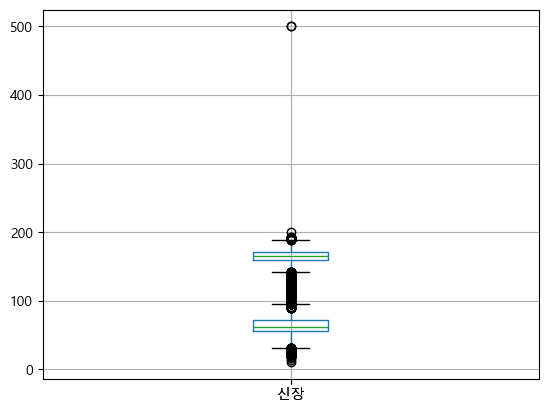

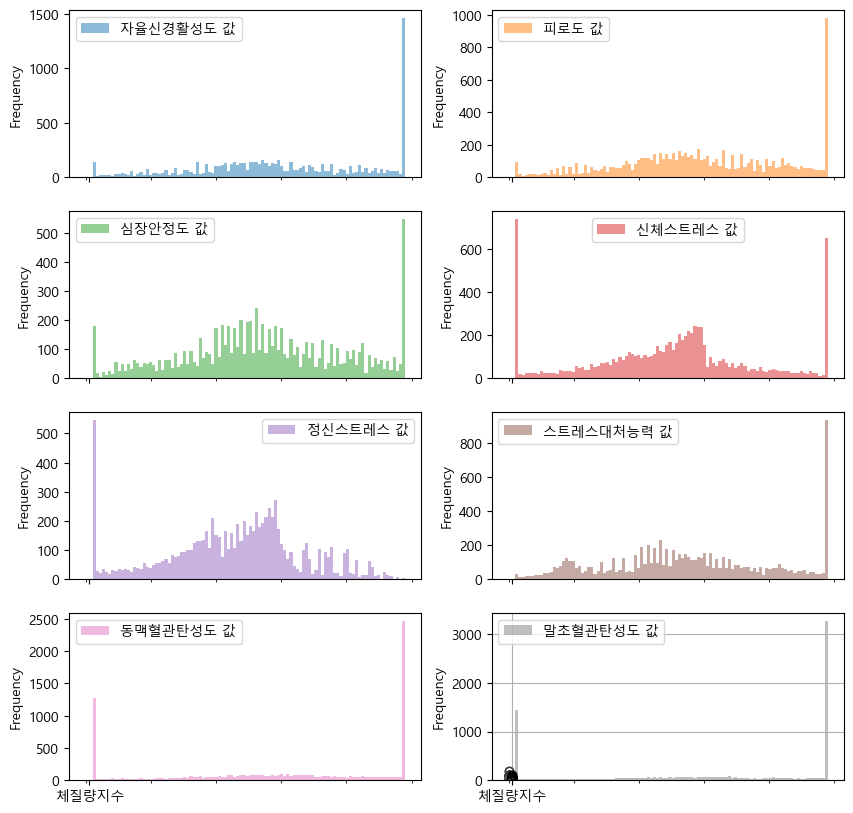

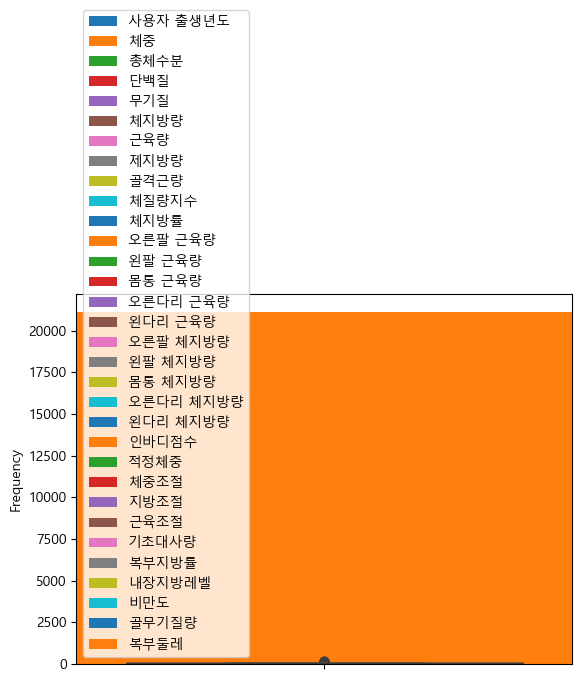

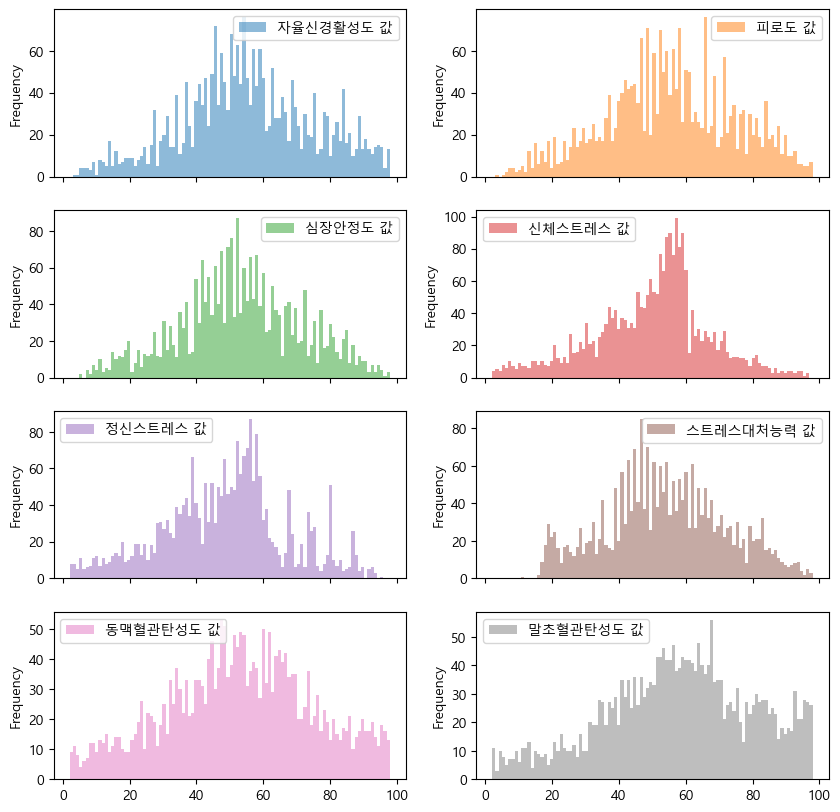

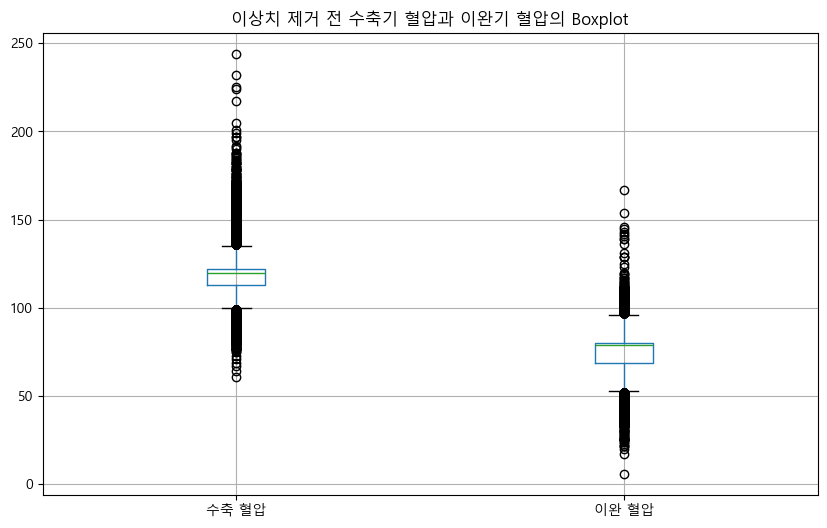

In [1331]:
# 혈압 이상치 제거 전 수축기  혈압과 이완기 혈압 Boxplot 그리기
plt.figure(figsize=(10, 6))
df_blood[['수축 혈압', '이완 혈압']].boxplot()
plt.title('이상치 제거 전 수축기 혈압과 이완기 혈압의 Boxplot')
plt.show()

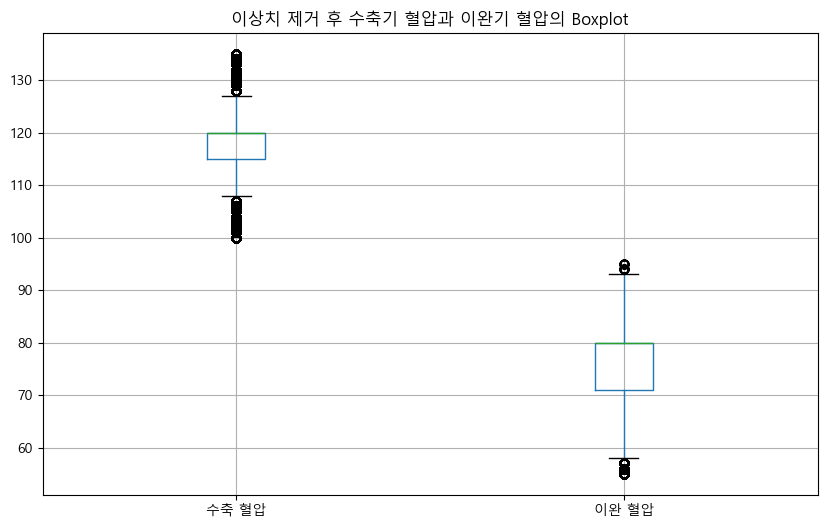

In [1332]:
# 혈압 이상치 제거 후 박스플롯
plt.figure(figsize=(10, 6))
df_blood_cleaned[['수축 혈압', '이완 혈압']].boxplot()
plt.title('이상치 제거 후 수축기 혈압과 이완기 혈압의 Boxplot')
plt.show()

---

## 5-5. 통합측정자료(공통) DataFrame생성작업

In [1335]:
## 임시적용 부분 추후 삭제 할것  start
adf_wh = df_wh.copy()
adf_inbody = df_inbody.copy()
adf_stress = df_stress.copy()
adf_blood = df_blood.copy()

adf_wh['나이']     = 2023 - adf_wh['사용자 출생년도'] +1 
adf_inbody['나이'] = 2023 - adf_inbody['사용자 출생년도'] +1 
adf_stress['나이'] = 2023 - adf_stress['사용자 출생년도'] +1 
adf_blood['나이']  = 2023 - adf_blood['사용자 출생년도'] +1 

#tmp_hw = adf_wh[['사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '나이']]
#tmp_hw
## 임시적용 부분 추후 삭제 할것  end

## 작업내역 : 작업 4개 DataFrame 별 구분(wh, inbody, stress, blood)값 입력한 필요 데이터 부분 검색 후 df.concat()으로 합치기
## 1. 구분값 적용
adf_wh['구분'] = 'wh'
adf_inbody['구분'] = 'inbody'
adf_stress['구분'] = 'stress'
adf_blood['구분'] = 'blood'

## 각 데이터셋에서 해당 필드만 골라 세로로 합치기 수행
base_check = pd.concat([ adf_wh[['구분', '사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '나이']],
                         adf_inbody[['구분','사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '나이']],
                         adf_stress[['구분','사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '나이']],
                         adf_blood[['구분','사용자 고유번호', '측정일자', '측정시간', '성별', '사용자 출생년도', '행정동명', '나이']]
                       ]).reset_index()

base_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179678 entries, 0 to 179677
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   index     179678 non-null  int64 
 1   구분        179678 non-null  object
 2   사용자 고유번호  179678 non-null  object
 3   측정일자      179678 non-null  object
 4   측정시간      179678 non-null  object
 5   성별        179678 non-null  object
 6   사용자 출생년도  179678 non-null  int64 
 7   행정동명      179678 non-null  object
 8   나이        179678 non-null  int64 
dtypes: int64(3), object(6)
memory usage: 12.3+ MB


In [1336]:
base_check.tail()

,index,구분,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,나이
179673,53773,blood,CF28FDE31F340DF7E0535F00A8C0BFE5,2023-12-31 00:00:00,23:39,M,1979,새롬동,45
179674,53774,blood,D97915F0A035D41DE0535F00A8C06243,2023-12-31 00:00:00,23:42,F,1982,다정동,42
179675,53775,blood,ED2C36A4C579AADFE0535F00A8C071AE,2023-12-31 00:00:00,23:49,F,1976,새롬동,48
179676,53776,blood,EC60BDA0AB32BDE8E0535F00A8C0CB28,2023-12-31 00:00:00,23:50,F,1982,소담동,42
179677,53777,blood,ED47D5D202D28AB6E0535F00A8C0CE6C,2023-12-31 00:00:00,23:52,M,1974,새롬동,50


In [1337]:
## 2. 측정일자/측정시간  Object Type를 data Type변환 
base_check['측정일자'] = pd.to_datetime(base_check['측정일자'])
base_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179678 entries, 0 to 179677
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   index     179678 non-null  int64         
 1   구분        179678 non-null  object        
 2   사용자 고유번호  179678 non-null  object        
 3   측정일자      179678 non-null  datetime64[ns]
 4   측정시간      179678 non-null  object        
 5   성별        179678 non-null  object        
 6   사용자 출생년도  179678 non-null  int64         
 7   행정동명      179678 non-null  object        
 8   나이        179678 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(5)
memory usage: 12.3+ MB


In [1338]:
base_check.head()

,index,구분,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,나이
0,0,wh,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,29
1,1,wh,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,53
2,2,wh,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,45
3,3,wh,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,30
4,4,wh,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,40


In [1339]:
## 추가 컬럼 년도, 요일 , 분기 등등...
# 측정연도 변수 추가 (년도)
base_check['측정연도'] = base_check['측정일자'].dt.year
# 측정요일 변수 추가 (요일) : ### 요일값 0:월 1:화.....6:일 입니다.
#base_check['측정요일'] = base_check['측정일자'].dt.weekday
base_check['측정요일'] = base_check['측정일자'].dt.day_name()

## 측정요일 갖고 주말(토.일) 평일 구분
base_check['휴일구분'] = np.where(base_check['측정일자'].dt.weekday>= 5, '주말','평일')

## 나이대역 구분
base_check['나이구분'] = (base_check['나이']//10)*10

## 측정시간 변수 추가 
base_check['방문시간'] = base_check['측정시간'].str.split(':').str.get(0)

## 측정년월 정의 계절별 이용 일자 확인용
base_check['측정년월'] = base_check['측정일자'].dt.strftime("%Y-%m")

base_check

,index,구분,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,측정년월
0,0,wh,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,29,2021,Tuesday,평일,20,18,2021-08
1,1,wh,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,53,2021,Tuesday,평일,50,18,2021-08
2,2,wh,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,45,2021,Tuesday,평일,40,19,2021-08
3,3,wh,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,30,2021,Wednesday,평일,30,16,2021-08
4,4,wh,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,40,2021,Thursday,평일,40,15,2021-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179673,53773,blood,CF28FDE31F340DF7E0535F00A8C0BFE5,2023-12-31,23:39,M,1979,새롬동,45,2023,Sunday,주말,40,23,2023-12
179674,53774,blood,D97915F0A035D41DE0535F00A8C06243,2023-12-31,23:42,F,1982,다정동,42,2023,Sunday,주말,40,23,2023-12
179675,53775,blood,ED2C36A4C579AADFE0535F00A8C071AE,2023-12-31,23:49,F,1976,새롬동,48,2023,Sunday,주말,40,23,2023-12
179676,53776,blood,EC60BDA0AB32BDE8E0535F00A8C0CB28,2023-12-31,23:50,F,1982,소담동,42,2023,Sunday,주말,40,23,2023-12


In [1340]:
base_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179678 entries, 0 to 179677
Data columns (total 15 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   index     179678 non-null  int64         
 1   구분        179678 non-null  object        
 2   사용자 고유번호  179678 non-null  object        
 3   측정일자      179678 non-null  datetime64[ns]
 4   측정시간      179678 non-null  object        
 5   성별        179678 non-null  object        
 6   사용자 출생년도  179678 non-null  int64         
 7   행정동명      179678 non-null  object        
 8   나이        179678 non-null  int64         
 9   측정연도      179678 non-null  int32         
 10  측정요일      179678 non-null  object        
 11  휴일구분      179678 non-null  object        
 12  나이구분      179678 non-null  int64         
 13  방문시간      179678 non-null  object        
 14  측정년월      179678 non-null  object        
dtypes: datetime64[ns](1), int32(1), int64(4), object(9)
memory usage: 19.9+ MB


In [1341]:
## 연도별 데이터 확인
base_check['측정연도'].value_counts()

측정연도
2023    152085
2022     23187
2021      4197
2020        58
2019        50
2013        30
2018        27
2015        13
2017        13
2016        10
2024         5
2014         3
Name: count, dtype: int64

In [1342]:
## 2021년도 이상만 구성 전처리 적용
base_check=base_check.query('측정연도 >= 2021')
base_check=base_check.query('측정연도 <  2024')
base_check.info()

<class 'pandas.core.frame.DataFrame'>
Index: 179469 entries, 0 to 179677
Data columns (total 15 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   index     179469 non-null  int64         
 1   구분        179469 non-null  object        
 2   사용자 고유번호  179469 non-null  object        
 3   측정일자      179469 non-null  datetime64[ns]
 4   측정시간      179469 non-null  object        
 5   성별        179469 non-null  object        
 6   사용자 출생년도  179469 non-null  int64         
 7   행정동명      179469 non-null  object        
 8   나이        179469 non-null  int64         
 9   측정연도      179469 non-null  int32         
 10  측정요일      179469 non-null  object        
 11  휴일구분      179469 non-null  object        
 12  나이구분      179469 non-null  int64         
 13  방문시간      179469 non-null  object        
 14  측정년월      179469 non-null  object        
dtypes: datetime64[ns](1), int32(1), int64(4), object(9)
memory usage: 21.2+ MB


---

---

# 6. DataFrame 분석 수행

## 6-1. 신장-체중 통해 똑똑건강 이용 현항 분석 수행

In [1347]:
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

In [1348]:
#성별 이용
adf_wh_es_sex=adf_wh.value_counts('성별')

adf_wh_es_sex

성별
F    58334
M    40851
Name: count, dtype: int64

In [1349]:
sns.countplot(data=adf_wh,x='성별')

<Axes: xlabel='성별', ylabel='count'>

In [1350]:
#동별 이용
adf_wh.value_counts('행정동명')

행정동명
새롬동     13446
한솔동     12394
아름동     10160
다정동      9290
고운동      7705
도담동      7273
소담동      5970
반곡동      5157
종촌동      4944
나성동      4717
보람동      4590
조치원읍     4018
해밀동      3401
대평동      3354
어진동      1160
연기면      1118
전의면       488
Name: count, dtype: int64

In [1351]:
sns.countplot(data=adf_wh,y='행정동명',order = adf_wh['행정동명'].value_counts().index)

<Axes: xlabel='성별', ylabel='count'>

In [1352]:
### 동별 , bmi지수 평균_신장,체중

In [1353]:

'''       .agg(n=('bmi','mean'))\
sns.barplot(data=adf_wh_es_mean,x='n')
adf_wh_es_mean=adf_wh.groupby('행정동명')\
'''

adf_wh_es_mean = adf_wh.groupby('행정동명', as_index=False)\
    .agg(bmi_mean=('bmi', 'mean'))\
    .sort_values(by='bmi_mean', ascending=False)
'''
df.sort_values(by = 'A', ascending = False)
'''
# barplot 그리기
#sns.barplot(data=adf_wh_es_mean, x='행정동명', y='bmi_mean')

"\ndf.sort_values(by = 'A', ascending = False)\n"

In [1354]:
adf_wh_es_mean

,행정동명,bmi_mean
3,대평동,24.764277
11,연기면,23.621320
8,소담동,23.603061
16,해밀동,23.555712
1,나성동,23.534182
6,보람동,23.503593
13,조치원읍,23.346089
14,종촌동,23.050680
5,반곡동,22.992000
15,한솔동,22.977142


In [1355]:
# barplot 그리기
sns.barplot(data=adf_wh_es_mean, x='행정동명', y='bmi_mean')

<Axes: xlabel='성별', ylabel='count'>

In [1356]:
# barplot 그리기
sns.barplot(data=adf_wh_es_mean, y='행정동명',x='bmi_mean')

<Axes: xlabel='성별', ylabel='count'>

In [1357]:
adf_wh_es_fat=adf_wh.copy()
adf_wh_es_fat['fat']=np.where(adf_wh_es_fat['bmi']<=18.5,'저체중',
                    np.where(adf_wh_es_fat['bmi']<=22.9,'보통',
                    np.where(adf_wh_es_fat['bmi']<=24.9,'과체중',
                    np.where(adf_wh_es_fat['bmi']<=29.9,'1단계비만',
                    np.where(adf_wh_es_fat['bmi']<=34.9,'2단계비만','3단계비만')))))

In [1358]:
#비만 유형벌 count
adf_wh_es_fat[['행정동명','fat']].value_counts('fat')

fat
보통       45875
과체중      24583
1단계비만    21685
저체중       3388
3단계비만     2713
2단계비만      941
Name: count, dtype: int64

### 동별 비만인 사람 수_신장체중

In [1360]:
adf_wh_es_fat

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이,bmi,구분,fat
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,29,26.31,wh,1단계비만
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,53,21.57,wh,보통
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,45,21.05,wh,보통
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,30,25.61,wh,1단계비만
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,40,26.74,wh,1단계비만
...,...,...,...,...,...,...,...,...,...,...,...,...
100274,EC8718D1FDF61A25E0535F00A8C0DBFB,2023-12-31,23:46,F,1981,소담동,54.8,164.0,43,20.37,wh,보통
100275,ED2C36A4C579AADFE0535F00A8C071AE,2023-12-31,23:49,F,1976,새롬동,58.5,158.0,48,23.43,wh,과체중
100276,EC60BDA0AB32BDE8E0535F00A8C0CB28,2023-12-31,23:50,F,1982,소담동,61.5,149.8,42,27.41,wh,1단계비만
100277,ED47D5D202D28AB6E0535F00A8C0CE6C,2023-12-31,23:52,M,1974,새롬동,75.9,175.0,50,24.78,wh,과체중


In [1361]:
#동별 비만인 사람 수_신장체중
adf_wh_fat_cnt = adf_wh_es_fat[adf_wh_es_fat['fat'].isin(['1단계비만', '2단계비만', '3단계비만'])]\
    .groupby('행정동명', as_index=False)\
    .size()\
    .sort_values('size',ascending=False)
adf_wh_fat_cnt

,행정동명,size
15,한솔동,2944
7,새롬동,2458
2,다정동,2458
8,소담동,2381
0,고운동,2095
9,아름동,2070
1,나성동,1586
3,대평동,1389
13,조치원읍,1359
4,도담동,1352


In [1362]:
adf_wh_fat_cnt.to_csv('wh_cnt.csv',index=False)

In [1363]:
sns.barplot(y='행정동명', x='size', data=adf_wh_fat_cnt, palette='viridis')

<Axes: xlabel='성별', ylabel='count'>

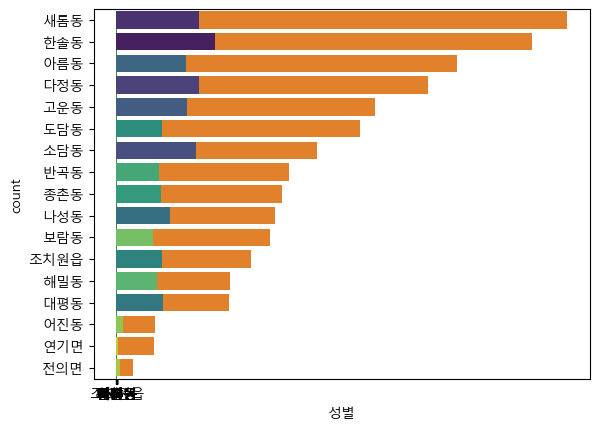

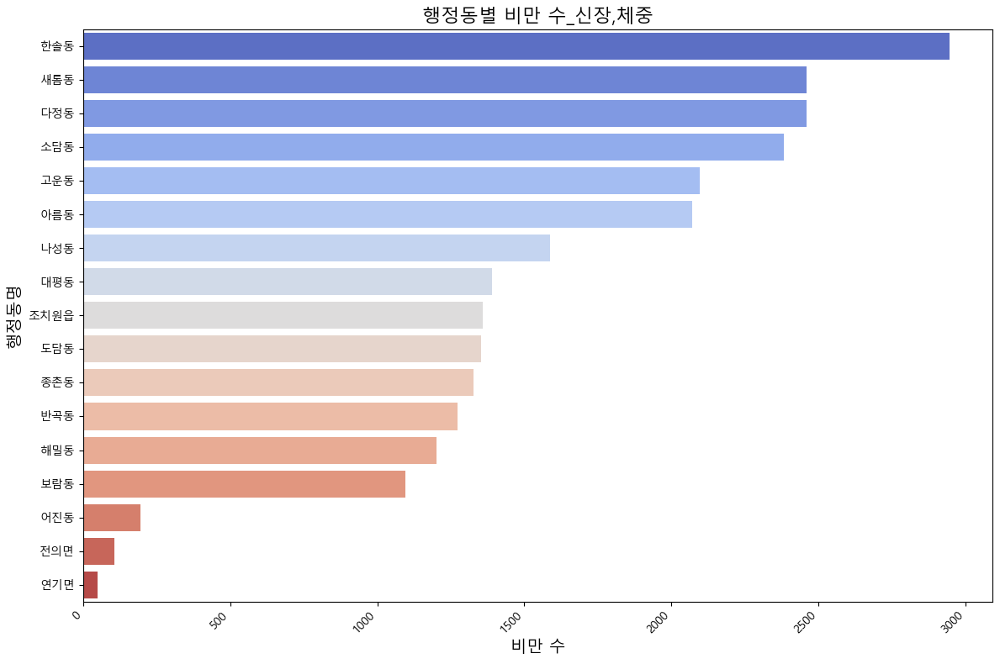

In [1364]:
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='size', data=adf_wh_fat_cnt, palette='coolwarm')
# 그래프 제목 및 축 레이블 설정
plt.title('행정동별 비만 수_신장,체중', fontsize=16)
plt.xlabel('비만 수', fontsize=14)
plt.ylabel('행정동명', fontsize=14)

# x축 레이블 회전 (가독성 향상)
plt.xticks(rotation=45, ha='right')

# 그래프 출력
plt.tight_layout()
plt.show()

### 행정동별 비만 비율

In [1366]:
# 행정동별 전체 인구 수 계산
adf_wh_es_pop = adf_wh_es_fat.groupby('행정동명', as_index=False).size()

# 비만 비율 계산 (비만인 사람 수 / 전체 인구 수)
adf_wh_fat_cnt['obesity_rate'] = adf_wh_fat_cnt['size'] / adf_wh_es_pop['size']
adf_wh_fat_cnt= adf_wh_fat_cnt.sort_values(by='obesity_rate', ascending=False)

# 행정동명을 기준으로 비만 비율을 barplot으로 그리기
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='obesity_rate', data=adf_wh_fat_cnt, palette='coolwarm')

<Axes: xlabel='obesity_rate', ylabel='행정동명'>

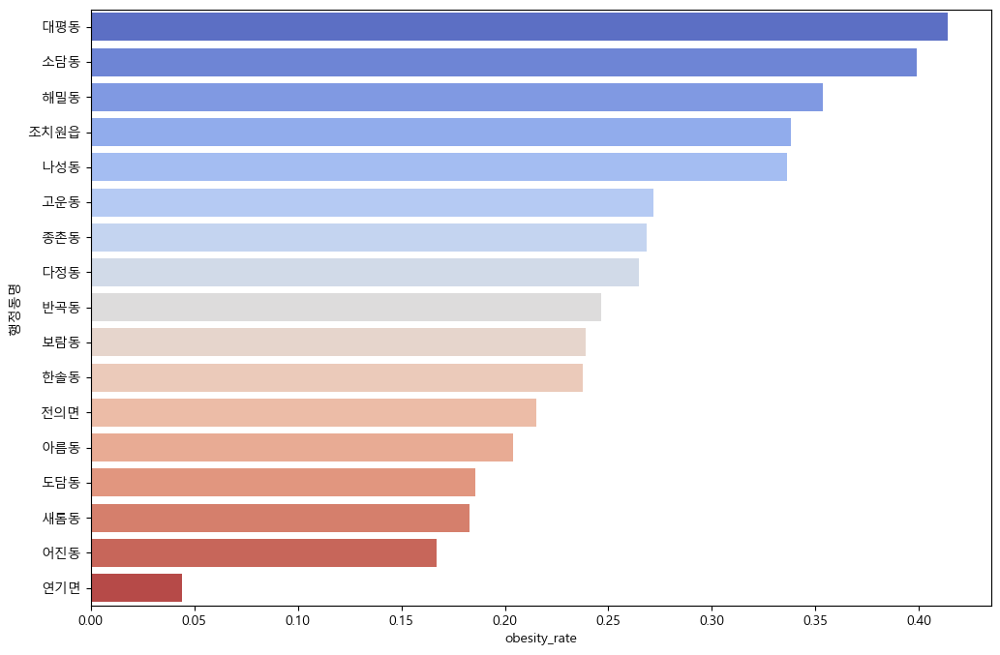

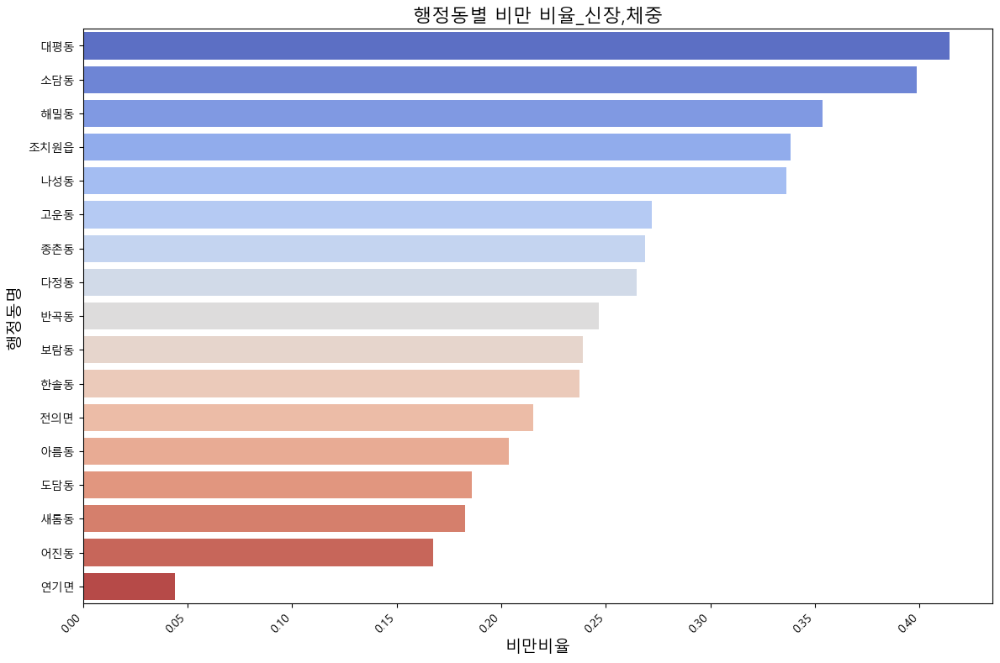

In [1367]:
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='obesity_rate', data=adf_wh_fat_cnt, palette='coolwarm')

# 그래프 제목 및 축 레이블 설정
plt.title('행정동별 비만 비율_신장,체중', fontsize=16)
plt.xlabel('비만비율', fontsize=14)
plt.ylabel('행정동명', fontsize=14)


# x축 레이블 회전 (가독성 향상)
plt.xticks(rotation=45, ha='right')

# 그래프 출력
plt.tight_layout()
plt.show()

### 동별 비만유형 구성비율 (son추후 확인 )

In [1369]:
adf_wh_es_fat.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이,bmi,구분,fat
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,29,26.31,wh,1단계비만
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,53,21.57,wh,보통
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,45,21.05,wh,보통
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,30,25.61,wh,1단계비만
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,40,26.74,wh,1단계비만


# 강사님 검토 요청합니다.

In [1371]:
adf_wh_es_fat.head(10)

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이,bmi,구분,fat
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,29,26.31,wh,1단계비만
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,53,21.57,wh,보통
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,45,21.05,wh,보통
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,30,25.61,wh,1단계비만
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,40,26.74,wh,1단계비만
5,CA71A1D7F7BCD664E0535F00A8C06D21,2021-08-26,15:39,F,1970,조치원읍,60.0,166.0,54,21.77,wh,보통
6,CA8AB5E618255322E0535F00A8C0D5AA,2021-08-27,21:34,M,1989,다정동,68.5,176.0,35,22.11,wh,보통
7,CA98263E0AFD077BE0535F00A8C05D95,2021-08-28,13:36,F,1998,새롬동,49.9,160.0,26,19.49,wh,보통
8,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:18,M,1994,나성동,76.2,168.6,30,26.81,wh,1단계비만
9,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,168.6,30,26.81,wh,1단계비만


In [1372]:
# '행정동명'과 'fat'으로 그룹화하여 각 그룹의 크기를 계산
df = adf_wh_es_fat.groupby(['행정동명', 'fat']).size().reset_index(name='count')

# '행정동명' 그룹 내에서 비율을 계산하여 'ratio' 컬럼에 저장
df['ratio'] = df['count'] / df.groupby('행정동명')['count'].transform('sum')

# 필요 없는 'count' 컬럼을 제거하고 최종 결과를 출력
df = df[['fat', '행정동명', 'ratio']]

# 결과 확인
df

,fat,행정동명,ratio
0,1단계비만,고운동,0.244257
1,2단계비만,고운동,0.004543
2,3단계비만,고운동,0.023102
3,과체중,고운동,0.180792
4,보통,고운동,0.518884
...,...,...,...
94,2단계비만,해밀동,0.023817
95,3단계비만,해밀동,0.099677
96,과체중,해밀동,0.221994
97,보통,해밀동,0.407527


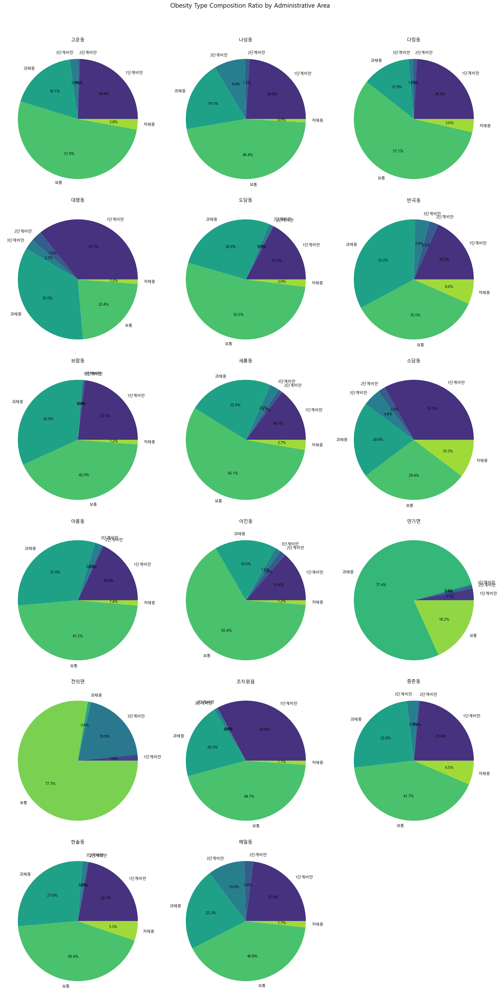

In [1373]:
'''
# 비만 유형별로 행정동별 구성 비율 계산
adf_wh_es_fat_per = adf_wh_es_fat.groupby(['행정동명', 'fat'])\
    .size()\
    .groupby(level=0)\
    .apply(lambda x: x / x.sum())\
    .reset_index(name='ratio')
'''

# 행정동명과 비만 유형을 기준으로 데이터를 정렬
adf_wh_es_fat_per = df.sort_values(by=['행정동명', 'fat'])

# 행정동별 비만 유형 비율을 원형 그래프로 나타내기
unique_areas = adf_wh_es_fat_per['행정동명'].unique()
num_areas = len(unique_areas)

# 원형 그래프를 그릴 서브플롯 설정
fig, axes = plt.subplots(nrows=int(np.ceil(num_areas / 3)), ncols=3, figsize=(18, 6 * np.ceil(num_areas / 3)))
axes = axes.flatten()  # 서브플롯 배열을 1차원으로 변환

for ax, area in zip(axes, unique_areas):
    # 해당 행정동의 데이터 필터링
    data = adf_wh_es_fat_per[adf_wh_es_fat_per['행정동명'] == area]
    
    # 원형 그래프 그리기
    ax.pie(data['ratio'], labels=data['fat'], autopct='%1.1f%%', colors=sns.color_palette('viridis', len(data)))
    ax.set_title(area)

# 남은 서브플롯 숨기기 (행정동이 적을 경우)
for i in range(len(unique_areas), len(axes)):
    fig.delaxes(axes[i])

# 전체 제목 설정
plt.suptitle('Obesity Type Composition Ratio by Administrative Area', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # 전체 제목과 서브플롯 간의 여백 조정
plt.show()

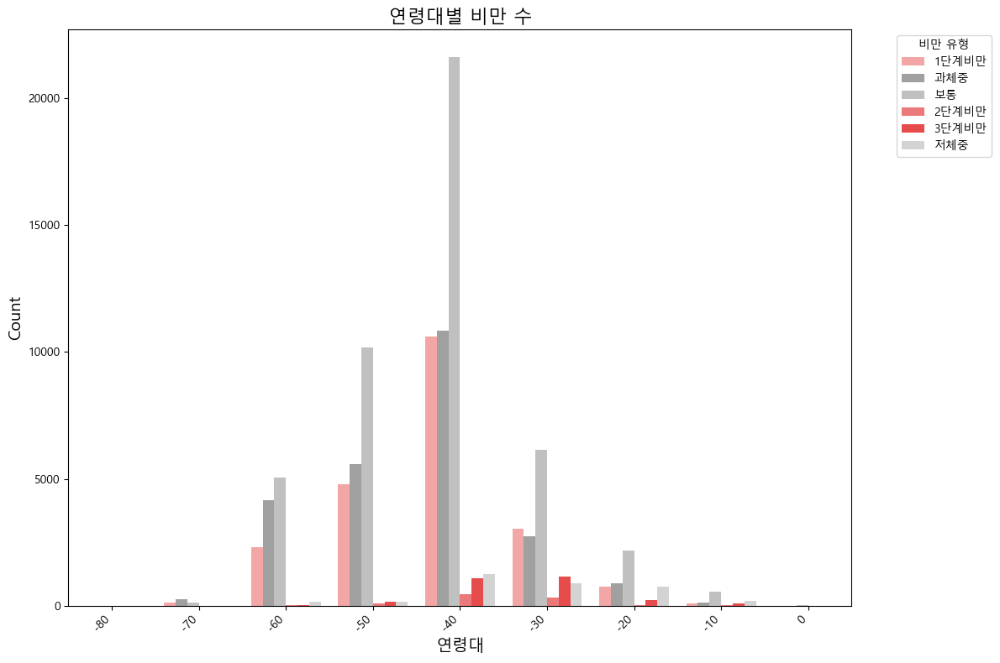

In [1832]:
#연령대별 비만 수
# 연령대별로 그룹화
adf_wh_es_fat['연령대'] = (adf_wh_es_fat['나이'] // 10 * -10)

# 연령대별 비만 유형 수 계산
adf_wh_es_age = adf_wh_es_fat.groupby(['연령대', 'fat'])\
    .size()\
    .reset_index(name='count')

# 시각화를 위한 색상 설정
palette = {
    '저체중': '#d3d3d3',  # Light grey
    '보통': '#c0c0c0',    # Grey
    '과체중': '#a0a0a0',  # Darker grey
    '1단계비만': '#ff9999',  # Light red
    '2단계비만': '#ff6666',  # Medium red
    '3단계비만': '#ff3333'   # Dark red
}

# 시각화
plt.figure(figsize=(12, 8))
sns.barplot(
    x='연령대', 
    y='count', 
    hue='fat', 
    data=adf_wh_es_age, 
    palette=palette
)

# 그래프 제목 및 축 레이블 설정
plt.title('연령대별 비만 수', fontsize=16)
plt.xlabel('연령대', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')

# 범례 설정
plt.legend(title='비만 유형', bbox_to_anchor=(1.05, 1), loc='upper left')

# 그래프 출력
plt.tight_layout()
plt.show()

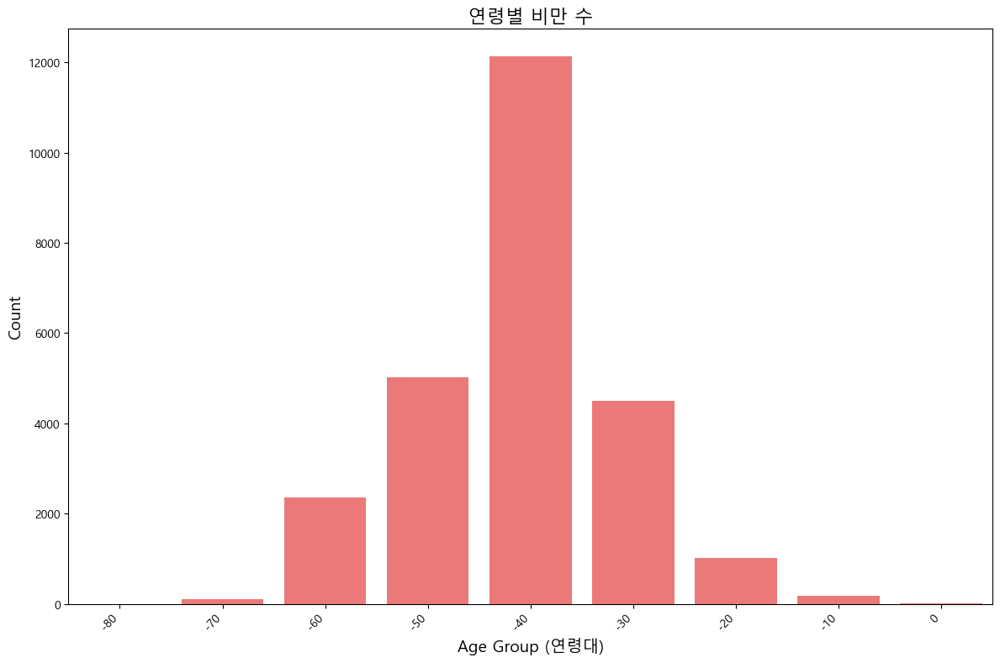

In [1834]:
#adf_wh_es_fat[adf_wh_es_fat['fat'].isin(['1단계비만', '2단계비만', '3단계비만'])]

adf_wh_es_fat_age= adf_wh_es_fat[adf_wh_es_fat['fat'].isin(['1단계비만', '2단계비만', '3단계비만'])]\
    .groupby('연령대')\
    .size()\
    .reset_index(name='count')

# 시각화
plt.figure(figsize=(12, 8))
sns.barplot(
    x='연령대', 
    y='count', 
    data=adf_wh_es_fat_age, 
    color='#ff6666'  # 비만을 나타내는 색상
)

# 그래프 제목 및 축 레이블 설정
plt.title('연령별 비만 수', fontsize=16)
plt.xlabel('Age Group (연령대)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')

# 그래프 출력
plt.tight_layout()
plt.show()

In [1479]:
## 이상치가 어디에 많은가
df_wh_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2713 entries, 28 to 100246
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  2713 non-null   object 
 1   측정일자      2713 non-null   object 
 2   측정시간      2713 non-null   object 
 3   성별        2713 non-null   object 
 4   사용자 출생년도  2713 non-null   int64  
 5   행정동명      2713 non-null   object 
 6   체중        2713 non-null   float64
 7   신장        2713 non-null   float64
 8   나이        2713 non-null   int64  
 9   bmi       0 non-null      float64
dtypes: float64(3), int64(2), object(5)
memory usage: 233.1+ KB


In [1481]:
df_wh_outliers.value_counts('행정동명')

행정동명
나성동     396
새롬동     344
해밀동     339
소담동     288
반곡동     201
아름동     201
고운동     178
한솔동     170
종촌동     149
다정동     111
전의면      97
대평동      92
도담동      72
조치원읍     34
보람동      20
어진동      17
연기면       4
Name: count, dtype: int64

In [1483]:
print(df_wh_outliers.value_counts('bmi'))

Series([], Name: count, dtype: int64)


In [1485]:
sns.countplot(data=df_wh_outliers, y='행정동명',order = df_wh_outliers['행정동명'].value_counts().index)

<Axes: xlabel='count', ylabel='행정동명'>

### 인바디 데이터 분석

In [1488]:
adf_inbody_es.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,31,2021,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,42,2021,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,44,2021,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,45,2021,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,73,2021,Tuesday,평일,70,17


In [1490]:
adf_inbody_es.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,31,2021,Monday,평일,30,14
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,42,2021,Tuesday,평일,40,14
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,44,2021,Tuesday,평일,40,14
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,45,2021,Tuesday,평일,40,16
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,73,2021,Tuesday,평일,70,17


In [1492]:
#성별 이용
adf_inbody_es_sex=adf_inbody_es.value_counts('성별')

adf_inbody_es_sex

성별
F    12378
M     8348
Name: count, dtype: int64

In [1494]:
sns.countplot(data=adf_inbody_es,x='성별',order=['F','M'])

<Axes: xlabel='count', ylabel='행정동명'>

In [1496]:
#동별 이용
adf_inbody_es.value_counts('행정동명')

행정동명
한솔동     3853
새롬동     3776
아름동     2358
다정동     1498
도담동     1496
고운동     1211
반곡동     1210
종촌동      941
해밀동      898
보람동      811
나성동      724
대평동      645
연기면      524
조치원읍     424
소담동      357
Name: count, dtype: int64

In [1498]:
sns.countplot(data=adf_inbody_es,y='행정동명',order = adf_inbody_es['행정동명'].value_counts().index)

<Axes: xlabel='count', ylabel='행정동명'>

### 동별 , bmi지수 평균_인바디

In [1501]:

'''       .agg(n=('bmi','mean'))\
sns.barplot(data=adf_wh_es_mean,x='n')
adf_wh_es_mean=adf_wh.groupby('행정동명')\
'''

adf_inbody_es_mean = adf_inbody_es.groupby('행정동명', as_index=False)\
    .agg(bmi_mean=('체질량지수', 'mean'))\
    .sort_values(by='bmi_mean', ascending=False)
'''
df.sort_values(by = 'A', ascending = False)
'''
# barplot 그리기
#sns.barplot(data=adf_wh_es_mean, x='행정동명', y='bmi_mean')

"\ndf.sort_values(by = 'A', ascending = False)\n"

In [1503]:
adf_inbody_es_mean

,행정동명,bmi_mean
8,소담동,24.778246
6,보람동,24.577114
3,대평동,23.592271
10,연기면,23.475191
12,종촌동,23.367964
0,고운동,23.269337
11,조치원읍,23.209398
14,해밀동,23.179118
1,나성동,23.028959
5,반곡동,23.016710


In [1505]:
# barplot 그리기
sns.barplot(data=adf_inbody_es_mean, x='행정동명', y='bmi_mean')

<Axes: xlabel='count', ylabel='행정동명'>

In [1507]:
# barplot 그리기
sns.barplot(data=adf_inbody_es_mean, y='행정동명',x='bmi_mean')

<Axes: xlabel='count', ylabel='행정동명'>

In [1509]:
adf_inbody_es_fat=adf_inbody_es.copy()
adf_inbody_es_fat['fat']=np.where(adf_inbody_es_fat['체질량지수']<=18.5,'저체중',
                    np.where(adf_inbody_es_fat['체질량지수']<=22.9,'보통',
                    np.where(adf_inbody_es_fat['체질량지수']<=24.9,'과체중',
                    np.where(adf_inbody_es_fat['체질량지수']<=29.9,'1단계비만',
                    np.where(adf_inbody_es_fat['체질량지수']<=34.9,'2단계비만','3단계비만')))))

In [1511]:
#비만 유형벌 count
adf_inbody_es_fat[['행정동명','fat']].value_counts('fat')

fat
보통       9772
과체중      5646
1단계비만    4025
저체중       678
3단계비만     581
2단계비만      24
Name: count, dtype: int64

### 동별 비만인 사람 수_인바디

In [1514]:
adf_inbody_es_fat

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,fat
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,31,2021,Monday,평일,30,14,1단계비만
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,42,2021,Tuesday,평일,40,14,보통
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,44,2021,Tuesday,평일,40,14,저체중
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,45,2021,Tuesday,평일,40,16,3단계비만
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,73,2021,Tuesday,평일,70,17,보통
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,81.0,42.5,11.4,4.0,23.1,54.6,57.9,32,26.7,29,3.30,3.23,26.1,9.1,9.16,1.5,1.5,12.4,3.3,3.3,68,68.1,-12.9,-12.9,0.0,1620,0.94,10,121,3.27,95.8,61,2023,Sunday,주말,60,16,1단계비만
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,44.5,22.2,5.9,2.1,14.3,28.4,30.2,16,19.3,32,1.22,1.19,13.4,4.8,4.74,1.0,1.0,6.4,2.5,2.5,64,45.8,1.3,-7.4,8.7,1023,0.80,6,97,1.75,68.7,13,2023,Sunday,주말,10,16,보통
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,65.1,35.9,9.6,3.3,16.3,46.0,48.8,27,25.2,25,2.58,2.53,21.3,7.5,7.43,0.9,1.0,8.1,2.6,2.6,85,63.4,-1.7,-1.7,0.0,1425,0.82,6,120,2.77,79.7,47,2023,Sunday,주말,40,17,1단계비만
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,39.1,19.1,5.1,1.9,13.0,24.6,26.1,13,21.4,33,1.04,0.99,11.1,3.7,3.69,0.9,0.9,5.6,2.4,2.4,72,32.0,-7.1,-7.3,0.2,933,0.73,5,122,1.53,62.8,10,2023,Sunday,주말,10,17,보통


In [1516]:
#동별 비만인 사람 수_신장체중
adf_inbody_es_fat_cnt = adf_inbody_es_fat[adf_inbody_es_fat['fat'].isin(['1단계비만', '2단계비만', '3단계비만'])]\
    .groupby('행정동명', as_index=False)\
    .size()\
    .sort_values('size',ascending=False)
adf_inbody_es_fat_cnt

,행정동명,size
13,한솔동,716
7,새롬동,586
9,아름동,441
0,고운동,416
6,보람동,399
2,다정동,363
5,반곡동,307
14,해밀동,267
12,종촌동,266
4,도담동,257


In [1518]:
adf_inbody_es_fat_cnt.to_csv('inbody_cnt.csv',index=False)

In [1520]:
sns.barplot(y='행정동명', x='size', data=adf_inbody_es_fat_cnt, palette='viridis')

<Axes: xlabel='count', ylabel='행정동명'>

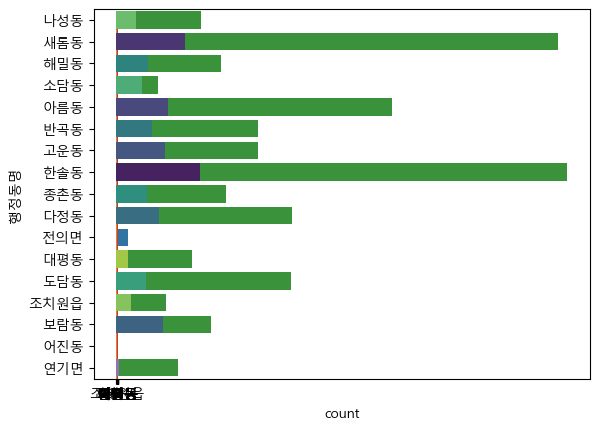

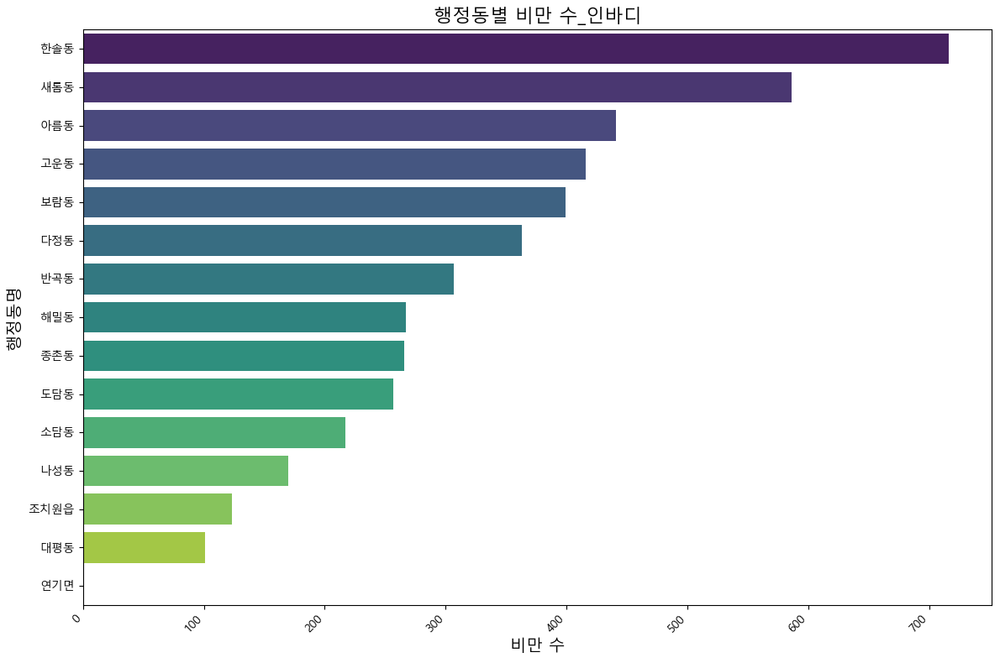

In [1522]:
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='size', data=adf_inbody_es_fat_cnt, palette='viridis')

# 그래프 제목 및 축 레이블 설정
plt.title('행정동별 비만 수_인바디', fontsize=16)
plt.xlabel('비만 수', fontsize=14)
plt.ylabel('행정동명', fontsize=14)

# x축 레이블 회전 (가독성 향상)
plt.xticks(rotation=45, ha='right')

# 그래프 출력
plt.tight_layout()
plt.show()

### 행정동별 비만 비율

In [1525]:
# 행정동별 전체 인구 수 계산
adf_inbody_es_pop = adf_inbody_es_fat.groupby('행정동명', as_index=False).size()

# 비만 비율 계산 (비만인 사람 수 / 전체 인구 수)
adf_inbody_es_fat_cnt['obesity_rate'] = adf_inbody_es_fat_cnt['size'] / adf_inbody_es_pop['size']
adf_inbody_es_fat_cnt= adf_inbody_es_fat_cnt.sort_values(by='obesity_rate', ascending=False)

# 행정동명을 기준으로 비만 비율을 barplot으로 그리기
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='obesity_rate', data=adf_inbody_es_fat_cnt, palette='coolwarm')


<Axes: xlabel='obesity_rate', ylabel='행정동명'>

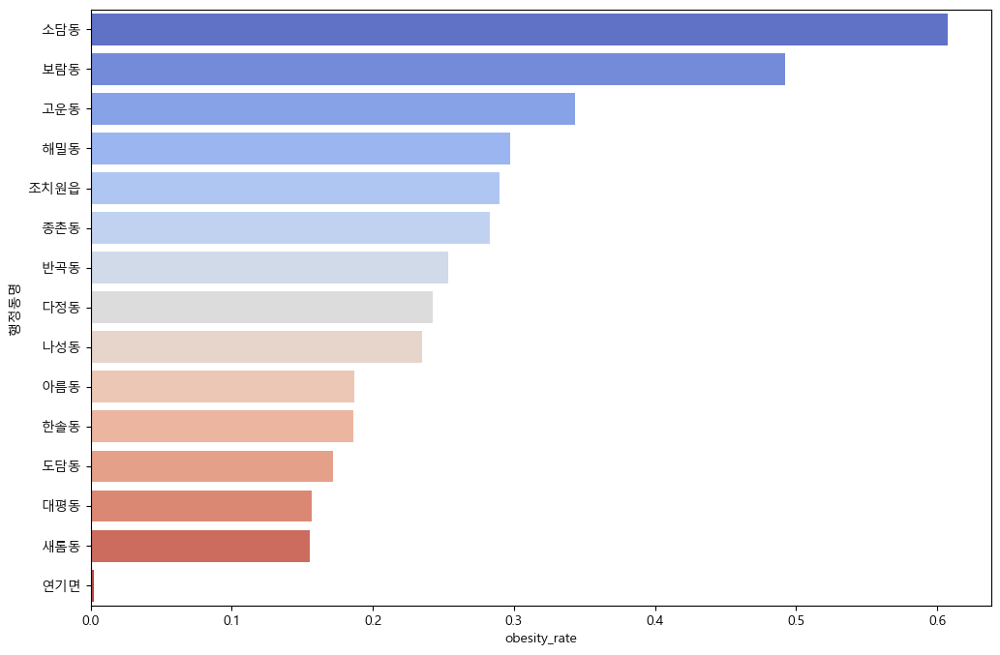

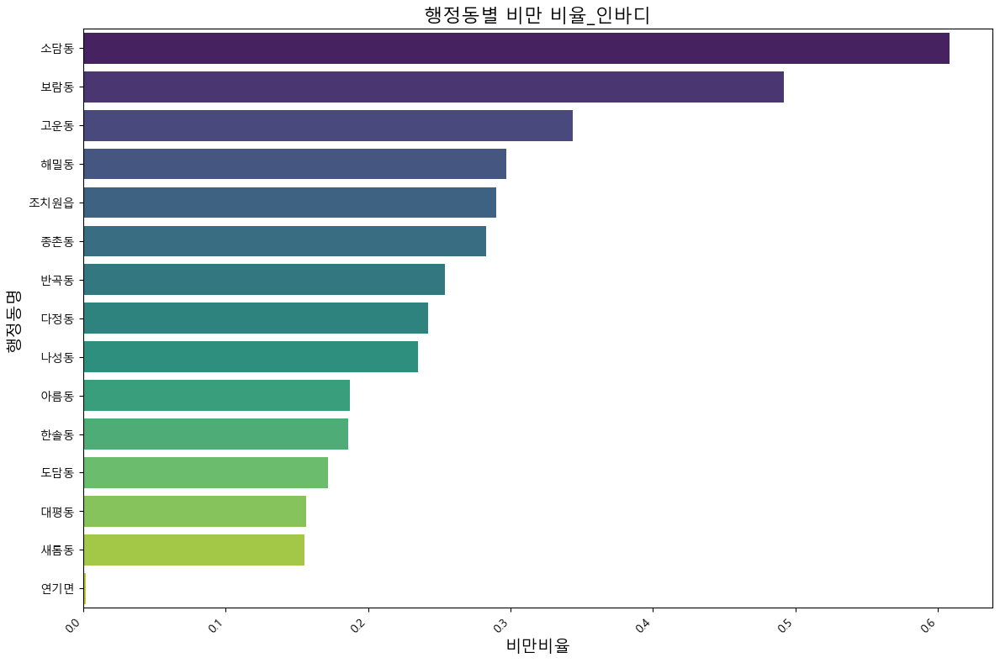

In [1526]:
plt.figure(figsize=(12, 8))
sns.barplot(y='행정동명',x='obesity_rate', data=adf_inbody_es_fat_cnt, palette='viridis')

# 그래프 제목 및 축 레이블 설정
plt.title('행정동별 비만 비율_인바디', fontsize=16)
plt.xlabel('비만비율', fontsize=14)
plt.ylabel('행정동명', fontsize=14)


# x축 레이블 회전 (가독성 향상)
plt.xticks(rotation=45, ha='right')

# 그래프 출력
plt.tight_layout()
plt.show()

In [1527]:
adf_wh.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,신장,나이,bmi,구분
0,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,72.5,166.0,29,26.31,wh
1,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,57.3,163.0,53,21.57,wh
2,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,58.0,166.0,45,21.05,wh
3,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,74.0,170.0,30,25.61,wh
4,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,93.5,187.0,40,26.74,wh


In [1528]:
#연령대별 비만 수
# 연령대별로 그룹화
adf_wh_es_fat['연령대'] = (adf_wh_es_fat['나이'] // 10 * -10).astype(str) + '대'

# 연령대별 비만 유형 수 계산
adf_wh_es_age = adf_wh_es_fat.groupby(['연령대', 'fat'])\
    .size()\
    .reset_index(name='count')

# 시각화를 위한 색상 설정
palette = {
    '저체중': '#d3d3d3',  # Light grey
    '보통': '#c0c0c0',    # Grey
    '과체중': '#a0a0a0',  # Darker grey
    '1단계비만': '#ff9999',  # Light red
    '2단계비만': '#ff6666',  # Medium red
    '3단계비만': '#ff3333'   # Dark red
}

# 시각화
plt.figure(figsize=(12, 8))
sns.barplot(
    x='연령대', 
    y='count', 
    hue='fat', 
    data=adf_wh_es_age, 
    palette=palette
)

# 그래프 제목 및 축 레이블 설정
plt.title('연령대별 비만 수', fontsize=16)
plt.xlabel('연령대', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')

# 범례 설정
plt.legend(title='비만 유형', bbox_to_anchor=(1.05, 1), loc='upper left')

# 그래프 출력
plt.tight_layout()
plt.show()

TypeError: data type '행정동명 == "연동면"' not understood

In [ ]:
### sonsuan 확인 필요

In [1531]:
## 이상치가 어디에 많은가
df_wh_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2713 entries, 28 to 100246
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   사용자 고유번호  2713 non-null   object 
 1   측정일자      2713 non-null   object 
 2   측정시간      2713 non-null   object 
 3   성별        2713 non-null   object 
 4   사용자 출생년도  2713 non-null   int64  
 5   행정동명      2713 non-null   object 
 6   체중        2713 non-null   float64
 7   신장        2713 non-null   float64
 8   나이        2713 non-null   int64  
 9   bmi       0 non-null      float64
dtypes: float64(3), int64(2), object(5)
memory usage: 233.1+ KB


In [1533]:
df_wh_outliers.value_counts('행정동명')

행정동명
나성동     396
새롬동     344
해밀동     339
소담동     288
반곡동     201
아름동     201
고운동     178
한솔동     170
종촌동     149
다정동     111
전의면      97
대평동      92
도담동      72
조치원읍     34
보람동      20
어진동      17
연기면       4
Name: count, dtype: int64

In [1535]:
print(df_wh_outliers.value_counts('bmi'))

Series([], Name: count, dtype: int64)


In [1537]:
sns.countplot(data=df_wh_outliers, y='행정동명',order = df_wh_outliers['행정동명'].value_counts().index)

<Axes: xlabel='count', ylabel='행정동명'>

---

## 6-2. 인바디 통해 똑똑건강 이용 현항 분석 수행

In [1541]:
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

In [1543]:
adf_inbody['나이'].value_counts()

나이
46    1012
44     982
45     928
43     852
41     843
      ... 
10       5
74       4
80       1
73       1
77       1
Name: count, Length: 70, dtype: int64

In [1545]:
sns.histplot(data=adf_inbody, x='나이')

<Axes: xlabel='count', ylabel='행정동명'>

In [1547]:
adf_inbody.describe()

,측정일자,사용자 출생년도,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,나이구분
count,20726,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.00000,20726.000000,20145.000000,20726.00000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000,20726.000000
mean,2023-05-05 05:33:29.649715200,1977.559732,63.683325,34.553088,9.299300,3.239371,16.595716,44.417056,47.08761,26.104892,22.969680,26.07493,2.436788,2.407156,20.911010,7.492261,7.460514,1.035496,1.055409,8.187740,2.634560,2.617905,74.312168,60.412207,-3.271118,-5.003377,1.732259,1387.096642,0.853079,6.582119,108.432693,2.669639,80.944958,46.440268,2022.746791,43.001544
min,2013-01-18 00:00:00,1944.000000,17.100000,12.200000,3.200000,-3.000000,0.500000,15.600000,16.40000,8.000000,15.800000,3.00000,0.450000,0.450000,6.700000,2.000000,1.970000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,22.600000,-56.000000,-56.000000,0.000000,725.000000,0.320000,1.000000,23.000000,-4.070000,51.700000,9.000000,2013.000000,10.000000
25%,2023-02-23 00:00:00,1970.000000,55.400000,29.100000,7.700000,2.800000,12.600000,37.300000,39.60000,22.000000,21.000000,21.00000,1.870000,1.840000,17.500000,6.300000,6.280000,0.700000,0.700000,6.000000,2.100000,2.000000,71.000000,54.800000,-6.600000,-7.600000,0.000000,1226.000000,0.820000,5.000000,99.000000,2.310000,74.900000,40.000000,2023.000000,40.000000
50%,2023-07-07 00:00:00,1978.000000,62.000000,32.600000,8.800000,3.100000,15.800000,41.900000,44.50000,24.000000,22.800000,26.00000,2.230000,2.210000,19.700000,7.200000,7.190000,1.000000,1.000000,7.700000,2.500000,2.500000,74.000000,58.800000,-2.500000,-4.200000,0.500000,1331.000000,0.850000,6.000000,107.000000,2.580000,79.600000,46.000000,2023.000000,40.000000
75%,2023-10-04 00:00:00,1984.000000,70.700000,39.800000,10.800000,3.600000,19.700000,51.300000,54.20000,31.000000,24.500000,31.00000,3.000000,2.950000,24.200000,8.600000,8.510000,1.300000,1.300000,9.900000,3.100000,3.100000,78.000000,65.500000,0.400000,-1.300000,3.100000,1541.000000,0.880000,8.000000,115.000000,2.970000,85.700000,54.000000,2023.000000,50.000000
max,2023-12-31 00:00:00,2015.000000,126.900000,71.200000,19.600000,6.400000,66.300000,92.000000,87.90000,57.000000,30.000000,58.00000,5.030000,5.040000,36.700000,15.400000,16.140000,8.600000,8.800000,29.000000,10.700000,10.600000,153.000000,99.900000,55.700000,14.400000,45.300000,2268.000000,1.190000,28.000000,507.000000,5.410000,141.400000,80.000000,2023.000000,80.000000
std,NaN,11.859502,11.700427,7.167354,1.981867,0.630957,5.804597,9.263952,9.75915,5.986176,2.621074,7.22764,0.729281,0.722582,4.382589,1.608022,1.584739,0.529218,0.529261,3.134996,0.824435,0.817542,5.827675,8.454601,6.411687,5.447704,2.363945,210.804762,0.053286,3.030251,14.625585,0.515096,8.907173,11.859502,0.537302,12.207641


In [1549]:
adf_inbody['나이구분'].value_counts()

나이구분
40    7733
50    4958
30    2949
60    2802
20    1385
70     678
10     220
80       1
Name: count, dtype: int64

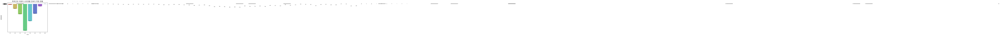

In [1551]:
plt.title('똑똑건강 이용자 나이대별 인바디 측정 현황', fontsize=14)
plt.xlabel('나이', fontsize=10)
plt.xticks(rotation=0, fontsize=8)

#sns.set_palette('hls')
ax = sns.countplot(data = adf_inbody, x ='나이구분', palette="hls")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 3, height, ha = 'center', size = 7)
    
plt.show()

In [1552]:
adf_inbody['행정동명'].value_counts()

행정동명
한솔동     3853
새롬동     3776
아름동     2358
다정동     1498
도담동     1496
고운동     1211
반곡동     1210
종촌동      941
해밀동      898
보람동      811
나성동      724
대평동      645
연기면      524
조치원읍     424
소담동      357
Name: count, dtype: int64

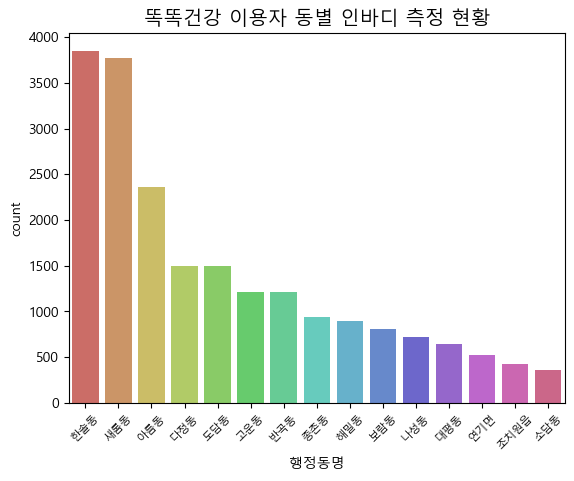

In [1555]:
plt.title('똑똑건강 이용자 동별 인바디 측정 현황', fontsize=14)
plt.xlabel('행정동명', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_inbody, x ='행정동명', palette="hls", order = adf_inbody['행정동명'].value_counts().index)
plt.show()

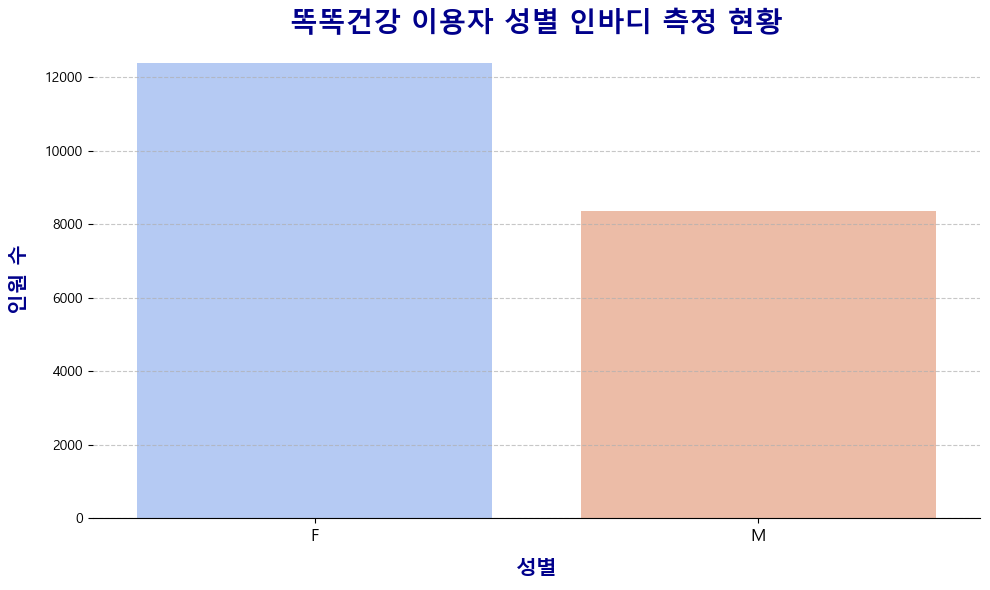

In [1557]:
plt.figure(figsize=(10, 6))
plt.title('똑똑건강 이용자 성별 인바디 측정 현황', fontsize=20, fontweight='bold', color='darkblue')

# 바 차트 생성
sns.countplot(data=adf_inbody, x='성별', palette="coolwarm", order=adf_inbody['성별'].value_counts().index)

# x축 레이블 설정
plt.xlabel('성별', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=0, fontsize=12)

# y축 레이블 설정
plt.ylabel('인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')

# 그리드 설정
sns.despine(left=True)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()


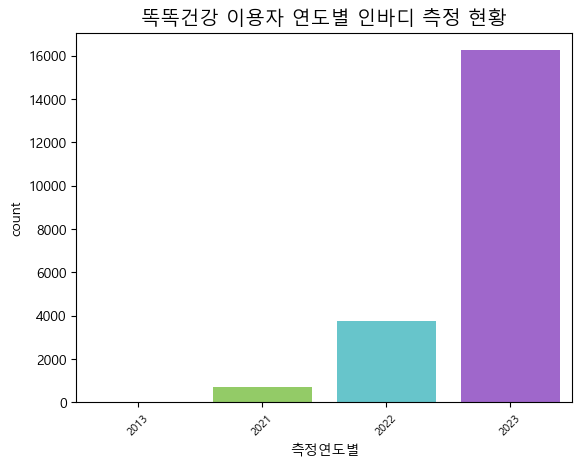

In [1559]:
plt.title('똑똑건강 이용자 연도별 인바디 측정 현황', fontsize=14)
plt.xlabel('측정연도별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_inbody, x ='측정연도',  palette="hls", legend=True)
plt.show()

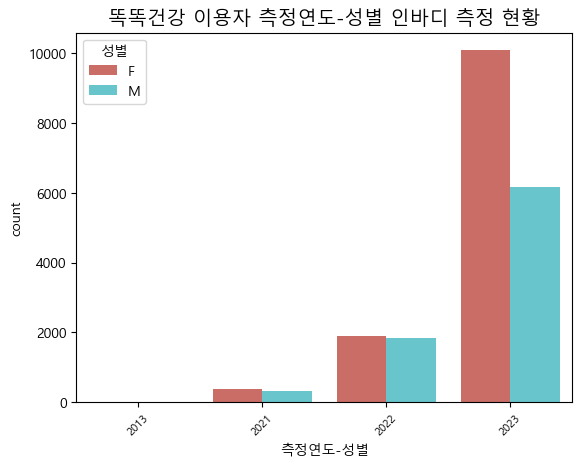

In [1561]:
plt.title('똑똑건강 이용자 측정연도-성별 인바디 측정 현황', fontsize=14)
plt.xlabel('측정연도-성별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_inbody, x ='측정연도',  hue='성별',  palette="hls")
plt.show()

In [1563]:
#인바디점수 분포 확인
sns.histplot(data = adf_inbody, x= '인바디점수')

<Axes: xlabel='인바디점수', ylabel='Count'>

In [1565]:
#인바디 점수별 체형 분석
def inbody_score(score):
    if score >= 90:
        return "근육이 매우 발달한 강인형"
    elif 80 <= score < 90:
        return "근육이 많은 건강형"
    elif 70 <= score < 80:
        return "보통"
    else:
        return "허약형/비만형"
        
adf_inbody['평가'] = adf_inbody['인바디점수'].apply(inbody_score)

In [1567]:
adf_inbody

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,구분,평가
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,30,2021,Monday,평일,30,14,inbody,허약형/비만형
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:11,F,1983,종촌동,63.7,33.8,9.0,3.4,17.5,43.4,46.2,25,22.7,27,2.22,2.09,19.5,7.6,7.40,1.1,1.2,8.4,2.9,2.9,77,60.1,-3.6,-3.6,0.0,1369,0.82,6,108,2.80,78.7,41,2021,Tuesday,평일,40,14,inbody,보통
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:20,F,1981,종촌동,41.9,24.3,6.4,2.2,9.0,31.1,32.9,18,17.8,22,1.51,1.46,14.9,5.1,5.04,0.6,0.6,3.8,1.6,1.6,72,49.5,7.6,2.4,5.2,1080,0.82,3,85,1.75,67.9,43,2021,Tuesday,평일,40,14,inbody,보통
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:51,M,1980,한솔동,84.0,47.2,13.7,4.6,18.5,61.7,65.5,39,NaN,22,3.62,3.51,28.4,11.5,11.43,0.9,0.9,9.0,3.3,3.2,88,77.1,-6.9,-6.9,0.0,1785,0.75,3,140,3.82,84.2,44,2021,Tuesday,평일,40,16,inbody,근육이 많은 건강형
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:01,M,1952,한솔동,65.9,44.6,12.7,4.1,4.5,58.0,61.4,36,22.2,7,3.42,3.37,27.4,11.0,10.67,0.1,0.1,1.3,1.1,1.0,86,65.9,0.0,0.0,0.0,1696,0.73,1,101,3.37,69.2,72,2021,Tuesday,평일,70,17,inbody,근육이 많은 건강형
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,81.0,42.5,11.4,4.0,23.1,54.6,57.9,32,26.7,29,3.30,3.23,26.1,9.1,9.16,1.5,1.5,12.4,3.3,3.3,68,68.1,-12.9,-12.9,0.0,1620,0.94,10,121,3.27,95.8,60,2023,Sunday,주말,60,16,inbody,허약형/비만형
21116,F4CFC4CC099E3653E0535F00A8C047B0,2023-12-31,16:59,M,2012,한솔동,44.5,22.2,5.9,2.1,14.3,28.4,30.2,16,19.3,32,1.22,1.19,13.4,4.8,4.74,1.0,1.0,6.4,2.5,2.5,64,45.8,1.3,-7.4,8.7,1023,0.80,6,97,1.75,68.7,12,2023,Sunday,주말,10,16,inbody,허약형/비만형
21117,ECA042D074BC3C3DE0535F00A8C03CE8,2023-12-31,17:08,F,1978,아름동,65.1,35.9,9.6,3.3,16.3,46.0,48.8,27,25.2,25,2.58,2.53,21.3,7.5,7.43,0.9,1.0,8.1,2.6,2.6,85,63.4,-1.7,-1.7,0.0,1425,0.82,6,120,2.77,79.7,46,2023,Sunday,주말,40,17,inbody,근육이 많은 건강형
21118,FC704619FFF0D53EE0535F00A8C02ED7,2023-12-31,17:13,F,2015,한솔동,39.1,19.1,5.1,1.9,13.0,24.6,26.1,13,21.4,33,1.04,0.99,11.1,3.7,3.69,0.9,0.9,5.6,2.4,2.4,72,32.0,-7.1,-7.3,0.2,933,0.73,5,122,1.53,62.8,9,2023,Sunday,주말,10,17,inbody,보통


In [1569]:
#"평가" 컬럼의 "허약형/비만형" 만 추출
adf_inbody[adf_inbody['평가'] == '허약형/비만형']

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,체중,총체수분,단백질,무기질,체지방량,근육량,제지방량,골격근량,체질량지수,체지방률,오른팔 근육량,왼팔 근육량,몸통 근육량,오른다리 근육량,왼다리 근육량,오른팔 체지방량,왼팔 체지방량,몸통 체지방량,오른다리 체지방량,왼다리 체지방량,인바디점수,적정체중,체중조절,지방조절,근육조절,기초대사량,복부지방률,내장지방레벨,비만도,골무기질량,복부둘레,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,구분,평가
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:19,M,1994,나성동,76.2,37.8,10.4,3.7,24.3,48.8,51.9,29,26.8,32,2.57,2.60,22.3,8.6,8.63,1.7,1.6,11.9,4.0,4.0,64,62.5,-13.7,-14.9,1.2,1491,0.85,9,122,3.14,88.2,30,2021,Monday,평일,30,14,inbody,허약형/비만형
16,CAD72451510337B6E0535F00A8C02A56,2021-09-05,12:26,M,1952,한솔동,71.8,29.0,7.7,2.6,32.5,37.3,39.3,22,NaN,45,2.46,2.41,20.3,5.4,5.51,2.6,2.7,17.7,4.1,4.1,53,48.9,-22.9,-25.2,2.3,1218,1.03,18,147,2.04,105.2,72,2021,Sunday,주말,70,12,inbody,허약형/비만형
18,CB51D1C48304818BE0535F00A8C0656A,2021-09-06,19:13,F,1994,한솔동,66.8,30.2,8.2,2.9,25.5,38.9,41.3,23,27.3,38,2.16,2.14,19.1,6.0,6.03,1.8,1.9,13.2,3.8,3.7,69,53.6,-13.2,-13.2,0.0,1262,0.92,12,130,2.41,90.9,30,2021,Monday,평일,30,19,inbody,허약형/비만형
19,CB522D3452F1C7A9E0535F00A8C0D00A,2021-09-06,19:39,F,1980,한솔동,72.9,32.7,9.0,3.1,28.1,42.2,44.8,25,27.9,39,2.39,2.38,20.9,7.0,6.89,2.1,2.1,14.5,4.1,4.1,68,58.1,-14.8,-14.8,0.0,1337,0.95,13,133,2.58,96.1,44,2021,Monday,평일,40,19,inbody,허약형/비만형
21,CB5F31E55615FC64E0535F00A8C0EBCA,2021-09-07,11:20,M,1958,고운동,67.6,35.1,9.3,3.1,20.1,45.0,47.5,26,25.5,30,2.81,2.68,22.4,7.2,7.15,1.2,1.3,10.7,2.8,2.8,67,58.2,-9.4,-11.4,2.0,1396,0.94,9,116,2.51,89.6,66,2021,Tuesday,평일,60,11,inbody,허약형/비만형
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21090,E837B1B1821C284CE0535F00A8C0A96E,2023-12-31,10:02,M,1996,보람동,71.3,35.5,9.5,3.5,22.8,45.7,48.5,27,24.7,32,2.48,2.51,21.8,7.8,7.95,1.5,1.5,11.6,3.5,3.5,61,63.6,-7.7,-13.3,5.6,1417,0.91,9,112,2.85,89.6,28,2023,Sunday,주말,20,10,inbody,허약형/비만형
21092,D148482AD419D6C7E0535F00A8C09151,2023-12-31,10:32,F,1967,한솔동,60.7,29.6,7.9,2.9,20.3,38.0,40.4,22,22.5,34,1.98,1.91,18.4,6.6,6.54,1.3,1.4,10.1,3.2,3.2,69,56.6,-4.1,-7.3,3.2,1242,0.89,9,107,2.39,82.9,57,2023,Sunday,주말,50,10,inbody,허약형/비만형
21095,01229EF5EE3E6B9AE0635F00A8C0A2D2,2023-12-31,10:57,M,1963,보람동,75.6,38.6,10.5,3.6,22.9,49.7,52.7,30,27.3,30,2.88,2.81,23.7,8.5,8.23,1.4,1.4,11.8,3.5,3.5,67,62.0,-13.6,-13.6,0.0,1509,0.89,8,124,2.98,91.0,61,2023,Sunday,주말,60,10,inbody,허약형/비만형
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,2023-12-31,16:55,M,1964,한솔동,81.0,42.5,11.4,4.0,23.1,54.6,57.9,32,26.7,29,3.30,3.23,26.1,9.1,9.16,1.5,1.5,12.4,3.3,3.3,68,68.1,-12.9,-12.9,0.0,1620,0.94,10,121,3.27,95.8,60,2023,Sunday,주말,60,16,inbody,허약형/비만형


In [1571]:
adf_inbody[['사용자 고유번호','평가']]

,사용자 고유번호,평가
0,CA5E614540CE0769E0535F00A8C08588,허약형/비만형
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,보통
2,CAD50BA68DA78C38E0535F00A8C01524,보통
3,CAD71E638BAC342BE0535F00A8C05272,근육이 많은 건강형
4,CAD72451510337B6E0535F00A8C02A56,근육이 많은 건강형
...,...,...
21115,DB1ADB27FA4AAB69E0535F00A8C0490E,허약형/비만형
21116,F4CFC4CC099E3653E0535F00A8C047B0,허약형/비만형
21117,ECA042D074BC3C3DE0535F00A8C03CE8,근육이 많은 건강형
21118,FC704619FFF0D53EE0535F00A8C02ED7,보통


In [1573]:
# '평가' 컬럼이 '허약형/비만형'이고, '행정동명'별로 카운트
adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('행정동명', as_index = False)\
                                                .agg(n = ("행정동명","count"))\
                                                .sort_values('n', ascending=False)

,행정동명,n
13,한솔동,619
7,새롬동,440
5,반곡동,339
2,다정동,331
9,아름동,324
12,종촌동,260
6,보람동,229
4,도담동,227
0,고운동,209
14,해밀동,170


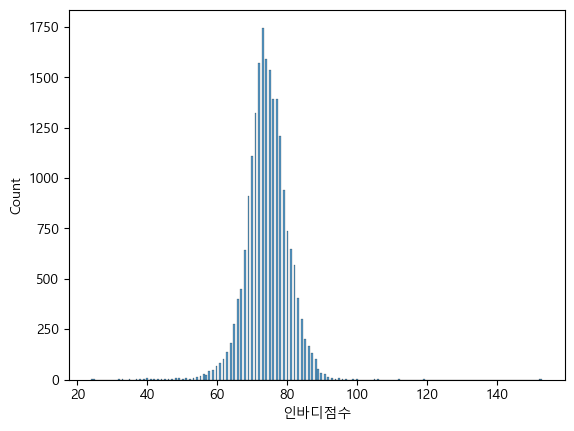

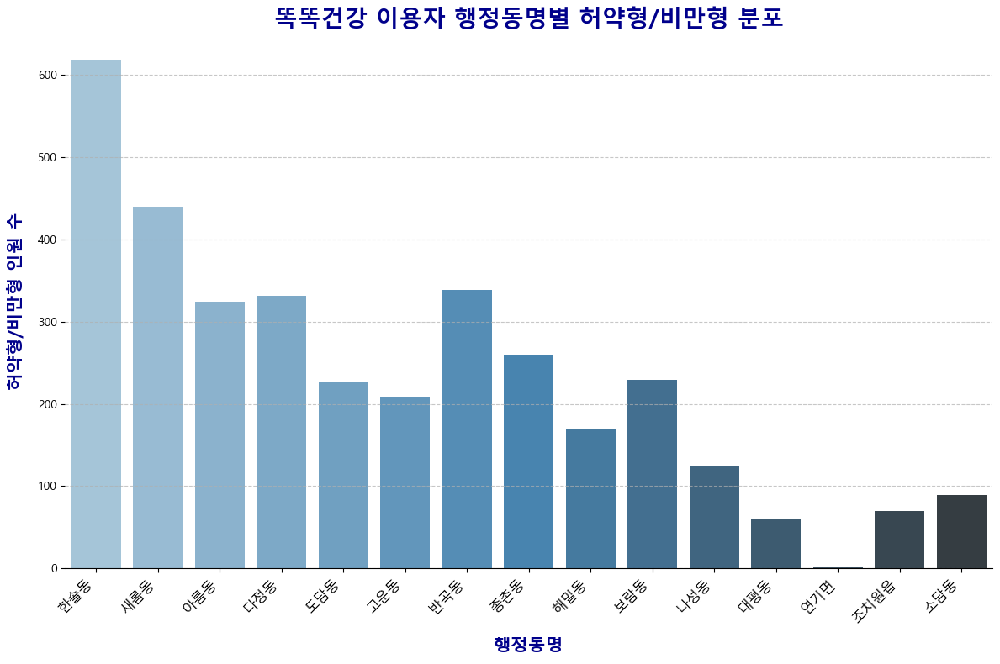

In [1575]:
# '행정동명'별로 '평가'가 '허약형/비만형'인 경우를 카운트
age_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('행정동명').size().reset_index(name='count')

plt.figure(figsize=(12, 8))
plt.title('똑똑건강 이용자 행정동명별 허약형/비만형 분포', fontsize=20, fontweight='bold', color='darkblue')

plt.xlabel('행정동명', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=45, fontsize=12, ha='right')

plt.ylabel('허약형/비만형 인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
sns.barplot(data=age_counts, x='행정동명', y='count', palette="Blues_d",
            order=adf_inbody['행정동명'].value_counts().index)
sns.despine(left=True)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [1576]:
# '평가' 컬럼이 '허약형/비만형'이고, '나이구분'별로 
adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('나이구분', as_index = False)\
                                                .agg(n = ("나이구분","count"))\
                                                .sort_values('n', ascending=False)

,나이구분,n
3,40,1293
2,30,857
4,50,503
1,20,390
5,60,360
0,10,69
6,70,21


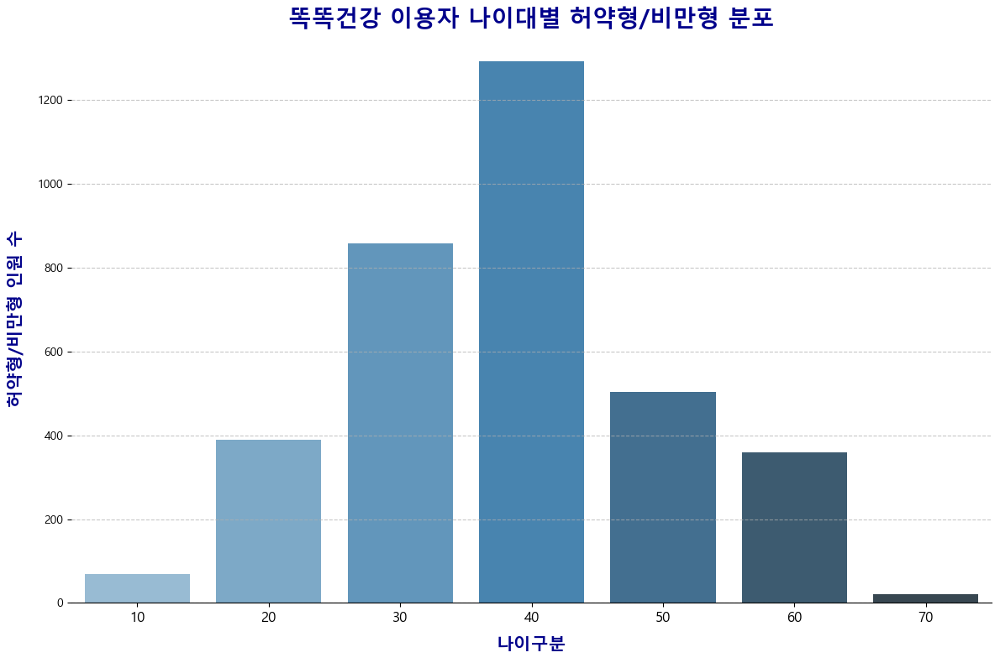

In [1579]:
# '나이구분'별로 '평가'가 '허약형/비만형'인 경우를 카운트
age_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('나이구분').size().reset_index(name='count')

plt.figure(figsize=(12, 8))
plt.title('똑똑건강 이용자 나이대별 허약형/비만형 분포', fontsize=20, fontweight='bold', color='darkblue')
plt.xlabel('나이구분', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=0, fontsize=12)

plt.ylabel('허약형/비만형 인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
sns.barplot(data=age_counts, x='나이구분', y='count', palette="Blues_d")

sns.despine(left=True)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [1581]:
# '평가' 컬럼이 '허약형/비만형'이고, '성별'별로 
adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('성별', as_index = False)\
                                                .agg(n = ("성별","count"))\
                                                .sort_values('n', ascending=False)

,성별,n
0,F,2364
1,M,1129


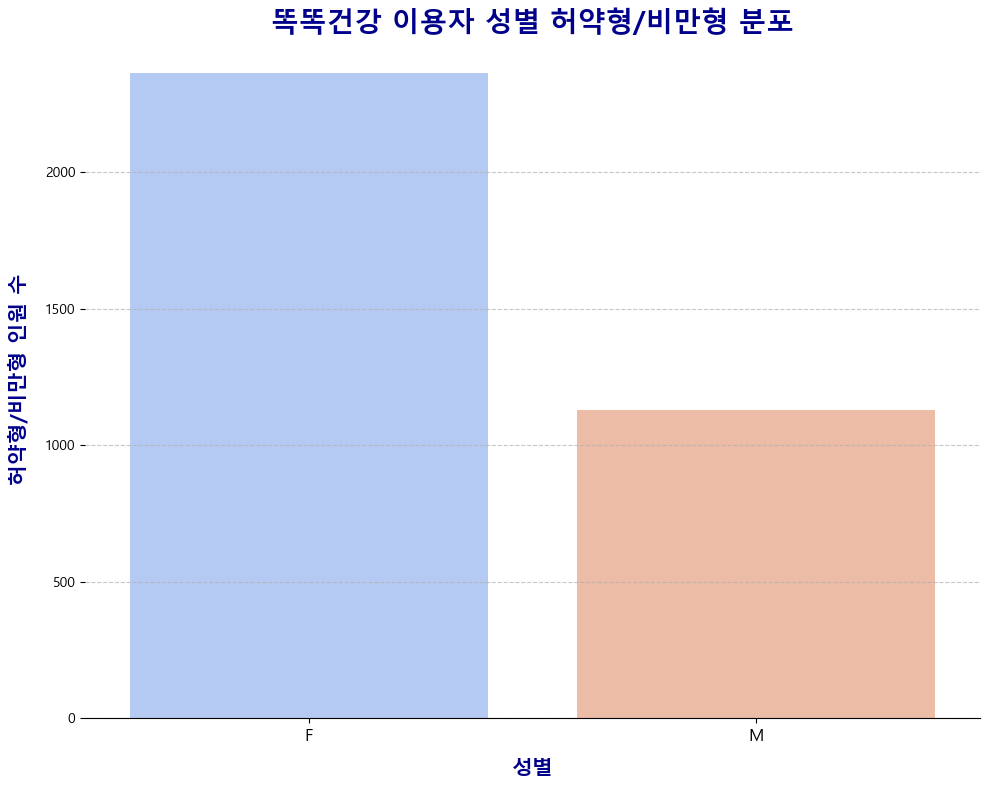

In [1583]:
# '나이구분'별로 '평가'가 '허약형/비만형'인 경우를 카운트
age_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형'].groupby('성별').size().reset_index(name='count')

plt.figure(figsize=(10, 8))
plt.title('똑똑건강 이용자 성별 허약형/비만형 분포', fontsize=20, fontweight='bold', color='darkblue')
plt.xlabel('성별', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=0, fontsize=12)

plt.ylabel('허약형/비만형 인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')

sns.barplot(data=age_counts, x='성별', y='count', palette="coolwarm", order=adf_inbody['성별'].value_counts().index)

sns.despine(left=True)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

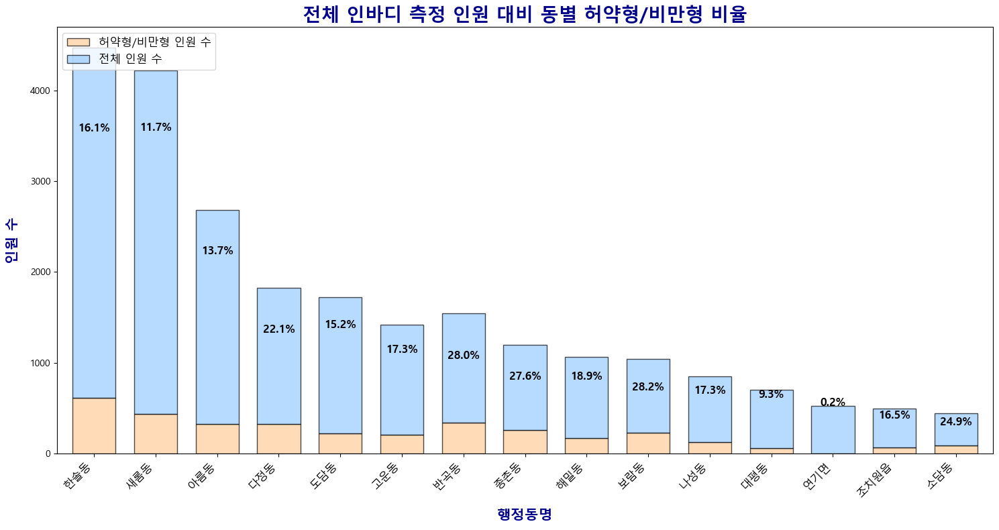

In [1585]:
# 전체 인바디 측정 인원과 허약형/비만형 인원을 데이터프레임으로 결합
total_counts = adf_inbody['행정동명'].value_counts().reset_index()
total_counts.columns = ['행정동명', '전체 인원 수']

lower_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형']['행정동명'].value_counts().reset_index()
lower_counts.columns = ['행정동명', '허약형/비만형 인원 수']

combined_counts = pd.merge(total_counts, lower_counts, on='행정동명', how='left').fillna(0)
combined_counts['허약형/비만형 비율 (%)'] = (combined_counts['허약형/비만형 인원 수'] / combined_counts['전체 인원 수']) * 100

plt.figure(figsize=(15, 8))
plt.title('전체 인바디 측정 인원 대비 동별 허약형/비만형 비율', fontsize=20, fontweight='bold', color='darkblue')

# 부드러운 색상으로 변경
combined_counts.set_index('행정동명')[['허약형/비만형 인원 수', '전체 인원 수']].plot(
    kind='bar', 
    stacked=True, 
    color=['#FFCC99', '#99CCFF'],
    alpha=0.7, 
    edgecolor='black', 
    width=0.7, 
    ax=plt.gca()
)

# x축, y축 레이블 설정
plt.xlabel('행정동명', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.ylabel('인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')

# 허약형/비만형 비율을 바 차트 위에 표시
for i, row in combined_counts.iterrows():
    plt.text(i, row['전체 인원 수'] - row['허약형/비만형 인원 수']/2, f"{row['허약형/비만형 비율 (%)']:.1f}%", 
             color='black', ha='center', fontsize=12, fontweight='bold')

# 범례 설정
plt.legend(['허약형/비만형 인원 수', '전체 인원 수'], loc='upper left', fontsize=12)

plt.tight_layout()
plt.show()


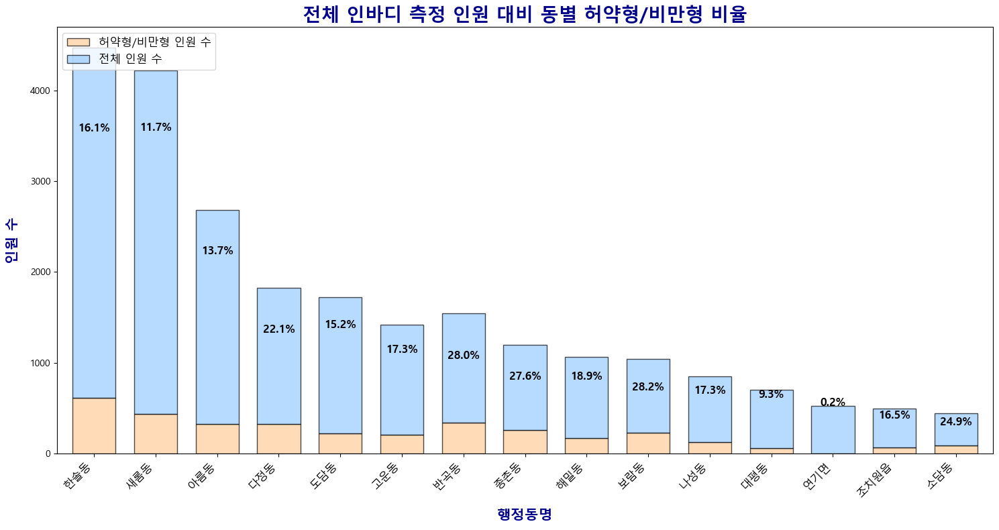

In [1587]:
# 전체 인바디 측정 인원과 허약형/비만형 인원을 데이터프레임으로 결합
total_counts = adf_inbody['행정동명'].value_counts().reset_index()
total_counts.columns = ['행정동명', '전체 인원 수']

lower_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형']['행정동명'].value_counts().reset_index()
lower_counts.columns = ['행정동명', '허약형/비만형 인원 수']

combined_counts = pd.merge(total_counts, lower_counts, on='행정동명', how='left').fillna(0)
combined_counts['허약형/비만형 비율 (%)'] = (combined_counts['허약형/비만형 인원 수'] / combined_counts['전체 인원 수']) * 100

plt.figure(figsize=(15, 8))
plt.title('전체 인바디 측정 인원 대비 동별 허약형/비만형 비율', fontsize=20, fontweight='bold', color='darkblue')

# 부드러운 색상으로 변경
combined_counts.set_index('행정동명')[['허약형/비만형 인원 수', '전체 인원 수']].plot(
    kind='bar', 
    stacked=True, 
    color=['#FFCC99', '#99CCFF'],
    alpha=0.7, 
    edgecolor='black', 
    width=0.7, 
    ax=plt.gca()
)

# x축, y축 레이블 설정
plt.xlabel('행정동명', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.ylabel('인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')

# 허약형/비만형 비율을 바 차트 위에 표시
for i, row in combined_counts.iterrows():
    plt.text(i, row['전체 인원 수'] - row['허약형/비만형 인원 수']/2, f"{row['허약형/비만형 비율 (%)']:.1f}%", 
             color='black', ha='center', fontsize=12, fontweight='bold')

# 범례 설정
plt.legend(['허약형/비만형 인원 수', '전체 인원 수'], loc='upper left', fontsize=12)

plt.tight_layout()
plt.show()


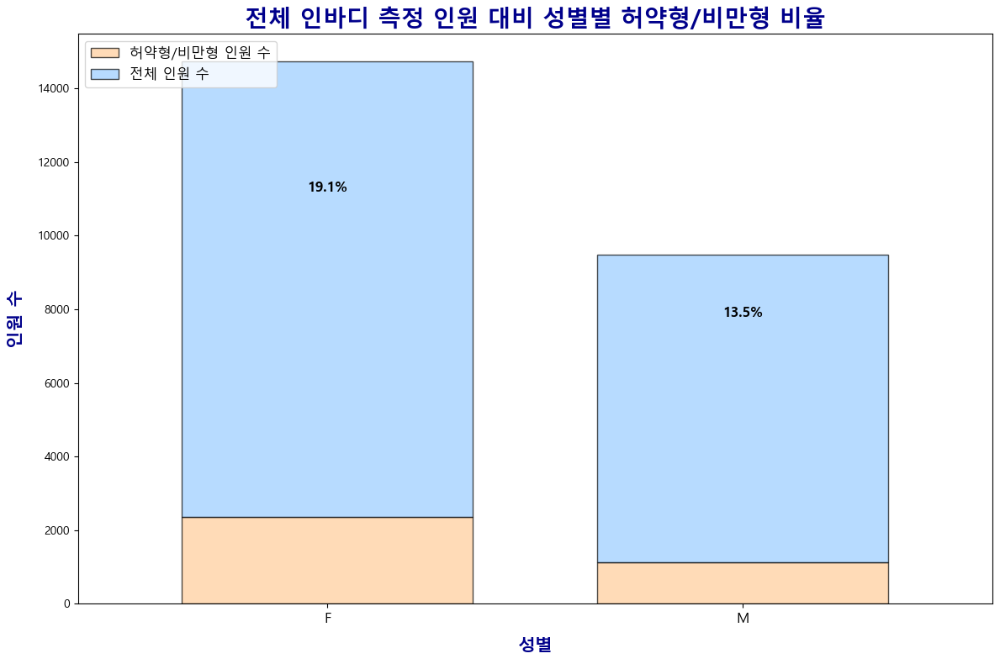

In [1588]:
# 전체 인바디 측정 인원과 허약형/비만형 인원을 데이터프레임으로 결합
total_counts = adf_inbody['성별'].value_counts().reset_index()
total_counts.columns = ['성별', '전체 인원 수']

age_counts = adf_inbody[adf_inbody['평가'] == '허약형/비만형']['성별'].value_counts().reset_index()
age_counts.columns = ['성별', '허약형/비만형 인원 수']

combined_counts = pd.merge(total_counts, age_counts, on='성별', how='left').fillna(0)
combined_counts['허약형/비만형 비율 (%)'] = (combined_counts['허약형/비만형 인원 수'] / combined_counts['전체 인원 수']) * 100

plt.figure(figsize=(12, 8))
plt.title('전체 인바디 측정 인원 대비 성별별 허약형/비만형 비율', fontsize=20, fontweight='bold', color='darkblue')

# 부드러운 색상으로 변경
combined_counts.set_index('성별')[['허약형/비만형 인원 수', '전체 인원 수']].plot(
    kind='bar', 
    stacked=True, 
    color=['#FFCC99', '#99CCFF'],  # 연한 주황색과 부드러운 하늘색
    alpha=0.7, 
    edgecolor='black', 
    width=0.7, 
    ax=plt.gca()
)

# x축, y축 레이블 설정
plt.xlabel('성별', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')
plt.xticks(rotation=0, fontsize=12)
plt.ylabel('인원 수', fontsize=15, labelpad=10, fontweight='bold', color='darkblue')

# 허약형/비만형 비율을 바 차트 위에 표시
for i, row in combined_counts.iterrows():
    plt.text(i, row['전체 인원 수'] - row['허약형/비만형 인원 수']/2, f"{row['허약형/비만형 비율 (%)']:.1f}%", 
             color='black', ha='center', fontsize=12, fontweight='bold')

# 범례 설정
plt.legend(['허약형/비만형 인원 수', '전체 인원 수'], loc='upper left', fontsize=12)

plt.tight_layout()
plt.show()


In [1590]:
total_users = adf_inbody['행정동명'].value_counts().reset_index()
total_users.columns = ['행정동명', '전체 이용자 수']
total_users

,행정동명,전체 이용자 수
0,한솔동,3853
1,새롬동,3776
2,아름동,2358
3,다정동,1498
4,도담동,1496
5,고운동,1211
6,반곡동,1210
7,종촌동,941
8,해밀동,898
9,보람동,811


In [1593]:
lower = adf_inbody[adf_inbody['평가'] == '허약형/비만형']['행정동명'].value_counts().reset_index()
lower.columns = ['행정동명', '허약형/비만형 인원 수']

# 데이터 병합
adf_inbody_bar = pd.merge(total_users, lower, on='행정동명', how='left').fillna(0)
adf_inbody_bar['허약형/비만형 비율 (%)'] = (adf_inbody_bar['허약형/비만형 인원 수'] / adf_inbody_bar['전체 이용자 수']) * 100
adf_inbody_bar

,행정동명,전체 이용자 수,허약형/비만형 인원 수,허약형/비만형 비율 (%)
0,한솔동,3853,619,16.065404
1,새롬동,3776,440,11.652542
2,아름동,2358,324,13.740458
3,다정동,1498,331,22.096128
4,도담동,1496,227,15.173797
5,고운동,1211,209,17.258464
6,반곡동,1210,339,28.016529
7,종촌동,941,260,27.630181
8,해밀동,898,170,18.930958
9,보람동,811,229,28.236745


---

## 6-3. 스트레스 통해 똑똑건강 이용 현항 분석 수행

In [1597]:
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

행정동명
아름동     0.295252
한솔동     0.339044
새롬동     0.316518
도담동     0.282325
반곡동     0.353333
종촌동     0.323049
보람동     0.242739
고운동     0.235556
다정동     0.297710
해밀동     0.355844
나성동     0.295880
조치원읍    0.149194
소담동     0.323529
연기면     0.140969
Name: count, dtype: float64


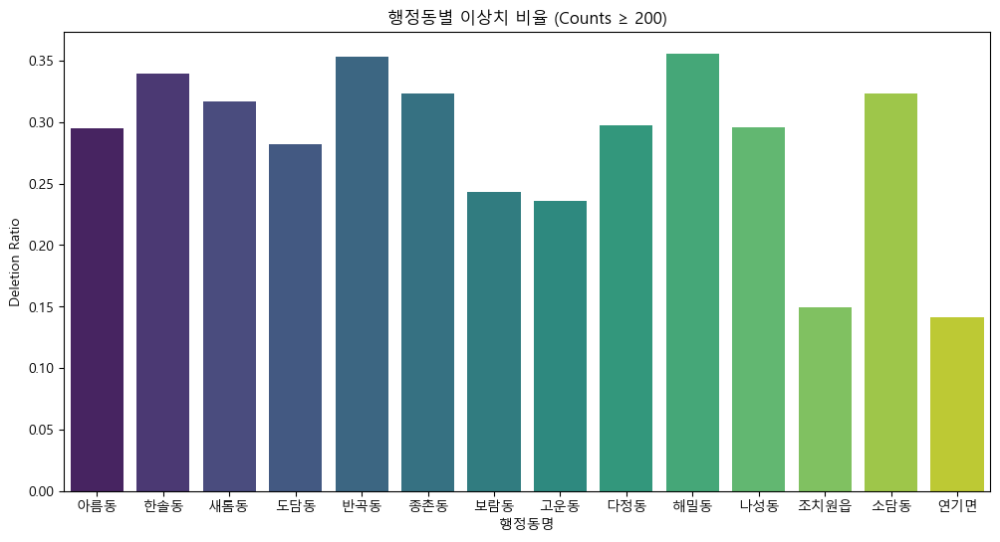

In [1599]:
#스트레스 이상치 비율
#200개 이상인 '행정동명' 값에 대한 전처리 전후 개수 비교 및 삭제된 비율 계산
#문헌에 따른 표본 크기에 대한 절대적 기준 (Williams et al., 2012)에 따르면 200개 이상이면 괜찮은 수준의 표본 사이즈

base_counts = base_stress['행정동명'].value_counts()
filtered_counts = base_counts[base_counts >= 200]

# 전처리 이후 데이터에서 해당 항목들만 남기기
after_counts = df_stress['행정동명'].value_counts().reindex(filtered_counts.index, fill_value=0)

# 삭제된 비율 계산
deleted_ratios = (filtered_counts - after_counts) / filtered_counts

# 결과 출력
print(deleted_ratios)

# 시각화
plt.figure(figsize=(12, 6))
sns.barplot(x=deleted_ratios.index, y=deleted_ratios.values, palette='viridis')
plt.title('행정동별 이상치 비율 (Counts ≥ 200)')
plt.xlabel('행정동명')
plt.ylabel('Deletion Ratio')
plt.show()

행정동명
아름동     0.643175
한솔동     0.706943
새롬동     0.714144
도담동     0.531435
반곡동     0.664000
종촌동     0.539020
보람동     0.651452
고운동     0.555556
다정동     0.646310
해밀동     0.646753
나성동     0.737828
조치원읍    0.415323
소담동     0.781513
연기면     0.991189
Name: count, dtype: float64


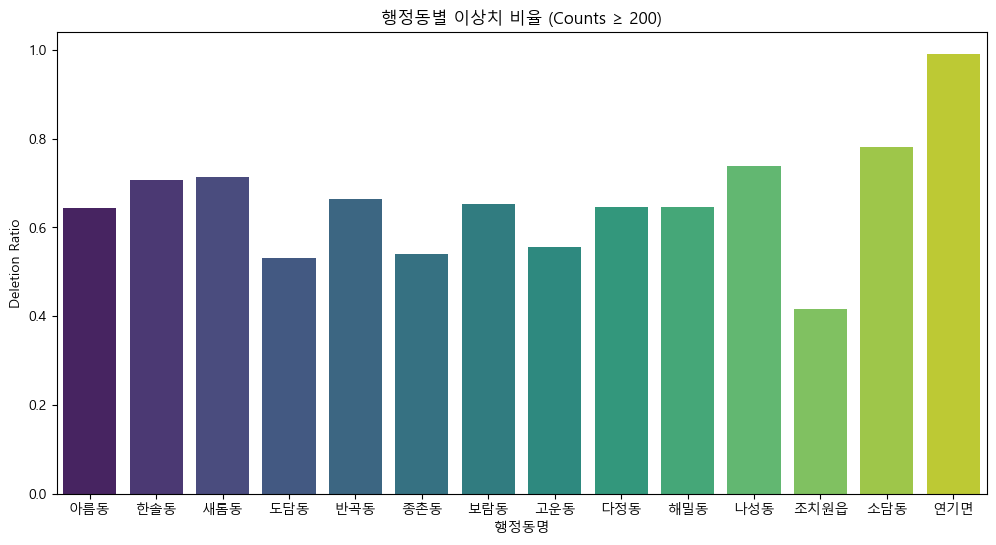

In [1601]:
#혈관 이상치 비율
#200개 이상인 '행정동명' 값에 대한 전처리 전후 개수 비교 및 삭제된 비율 계산
#문헌에 따른 표본 크기에 대한 절대적 기준 (Williams et al., 2012)에 따르면 200개 이상이면 괜찮은 수준의 표본 사이즈

base_counts = base_stress['행정동명'].value_counts()
filtered_counts = base_counts[base_counts >= 200]

# 전처리 이후 데이터에서 해당 항목들만 남기기
after_counts = df_vessel['행정동명'].value_counts().reindex(filtered_counts.index, fill_value=0)

# 삭제된 비율 계산
deleted_ratios = (filtered_counts - after_counts) / filtered_counts

# 결과 출력
print(deleted_ratios)

# 시각화
plt.figure(figsize=(12, 6))
sns.barplot(x=deleted_ratios.index, y=deleted_ratios.values, palette='viridis')
plt.title('행정동별 이상치 비율 (Counts ≥ 200)')
plt.xlabel('행정동명')
plt.ylabel('Deletion Ratio')
plt.show()

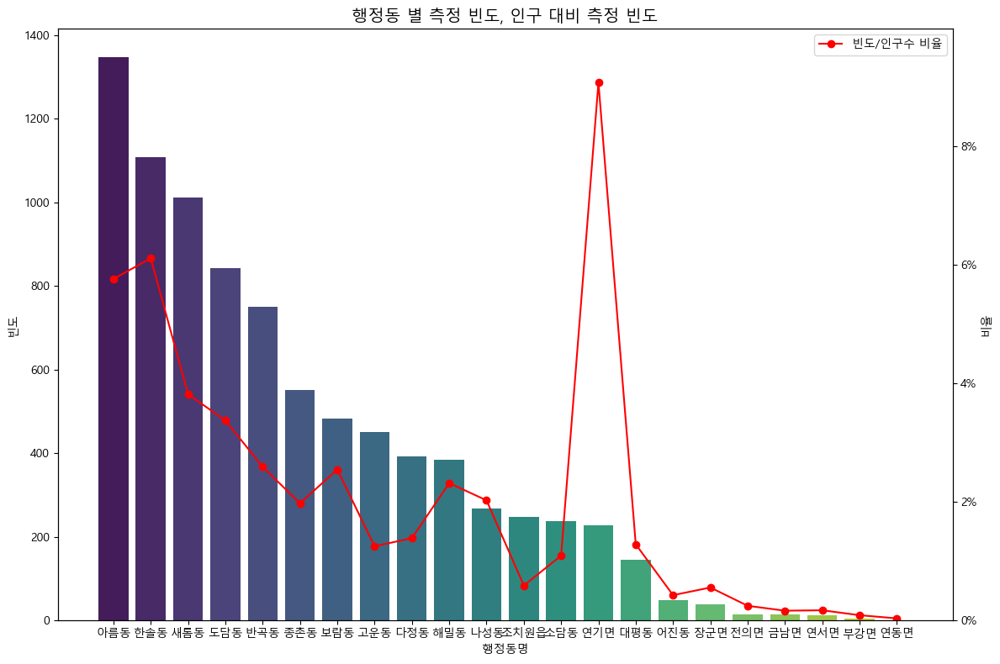

In [1603]:
# 행정동명 빈도 계산
value_counts = base_stress['행정동명'].value_counts()

# 행정동명에 맞는 인구수를 가져옴
matching_population = df_population.set_index('행정동명').loc[value_counts.index, '전체인구']

# 빈도 / 인구수 비율 계산
ratio = value_counts / matching_population

# 막대 그래프 그리기
plt.figure(figsize=(12, 8))
sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis")

# 꺾은선 그래프 추가 (두 번째 축을 사용)
ax1 = plt.gca()  # 현재 축 가져오기
ax2 = ax1.twinx()  # 두 번째 축 생성

ax2.plot(value_counts.index, ratio, color='red', marker='o', linestyle='-', label='빈도/인구수 비율')
ax2.set_ylabel('비율', fontsize=10)

# 오른쪽 축을 백분율로 변환하여 레이블을 표시
ax2.set_ylim(0, max(ratio) * 1.1)  # y축 범위를 기존 비율의 최대치보다 약간 크게 설정

# 오른쪽 y축 레이블을 백분율로 설정
ax2.set_yticklabels([f'{int(tick * 100):d}%' for tick in ax2.get_yticks()])

# 제목과 x축 레이블 설정
plt.title('행정동 별 측정 빈도, 인구 대비 측정 빈도', fontsize=14)
plt.xlabel('행정동명', fontsize=10)
ax1.set_ylabel('빈도', fontsize=10)

# x축 레이블 회전 및 폰트 크기 조정
plt.xticks(rotation=45, fontsize=8)

# 범례 설정
ax2.legend(loc='upper right')

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()

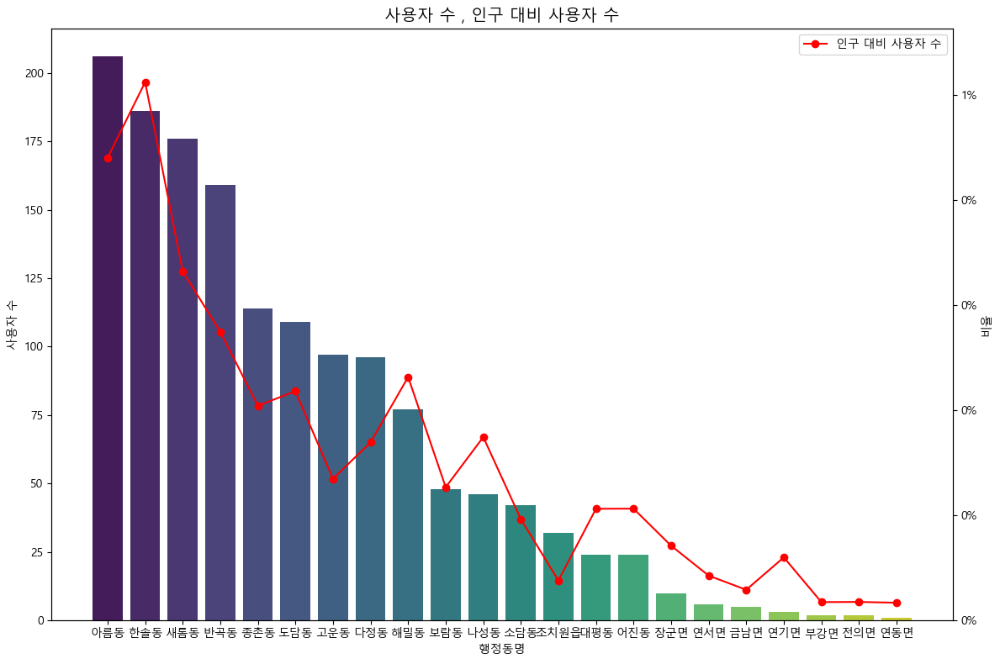

In [1604]:
# 행정동명별 사용자 고유번호의 종류 개수 계산
real_count = base_stress.groupby('행정동명')['사용자 고유번호'].nunique()

# 행정동명에 맞는 인구수를 가져옴
matching_population = df_population.set_index('행정동명').loc[real_count.index, '전체인구']

# 사용자 수 / 인구수 비율 계산
ratio = real_count / matching_population

# real_count를 기준으로 내림차순 정렬
real_count = real_count.sort_values(ascending=False)
ratio = ratio.loc[real_count.index]  # 비율도 동일한 순서로 정렬

# 막대 그래프 그리기
plt.figure(figsize=(12, 8))
sns.barplot(x=real_count.index, y=real_count.values, palette="viridis")

# 꺾은선 그래프 추가 (두 번째 축을 사용)
ax1 = plt.gca()  # 현재 축 가져오기
ax2 = ax1.twinx()  # 두 번째 축 생성

ax2.plot(real_count.index, ratio, color='red', marker='o', linestyle='-', label='인구 대비 사용자 수')
ax2.set_ylabel('비율', fontsize=10)

# 오른쪽 축을 백분율로 변환하여 레이블을 표시
ax2.set_ylim(0, max(ratio) * 1.1)  # y축 범위를 기존 비율의 최대치보다 약간 크게 설정

# 오른쪽 y축 레이블을 백분율로 설정
ax2.set_yticklabels([f'{int(tick * 100):d}%' for tick in ax2.get_yticks()])

# 제목과 x축 레이블 설정
plt.title('사용자 수 , 인구 대비 사용자 수', fontsize=14)
plt.xlabel('행정동명', fontsize=10)
ax1.set_ylabel('사용자 수', fontsize=10)

# x축 레이블 회전 및 폰트 크기 조정
plt.xticks(rotation=45, fontsize=8)

# 범례 설정
ax2.legend(loc='upper right')

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


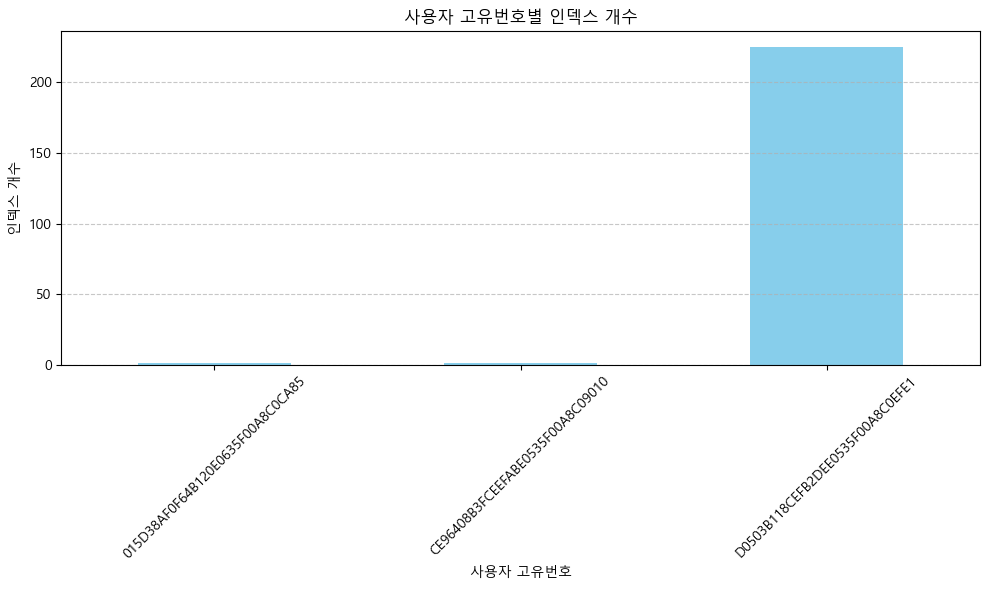

In [1606]:
filtered_df = base_stress[base_stress['행정동명'] == '연기면']

# '사용자 고유번호'별로 그룹화하고 인덱스 개수 세기
index_counts = filtered_df.groupby('사용자 고유번호').size()

# 그래프 그리기
plt.figure(figsize=(10, 6))
index_counts.plot(kind='bar', color='skyblue')
plt.xlabel('사용자 고유번호')
plt.ylabel('인덱스 개수')
plt.title('사용자 고유번호별 인덱스 개수')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

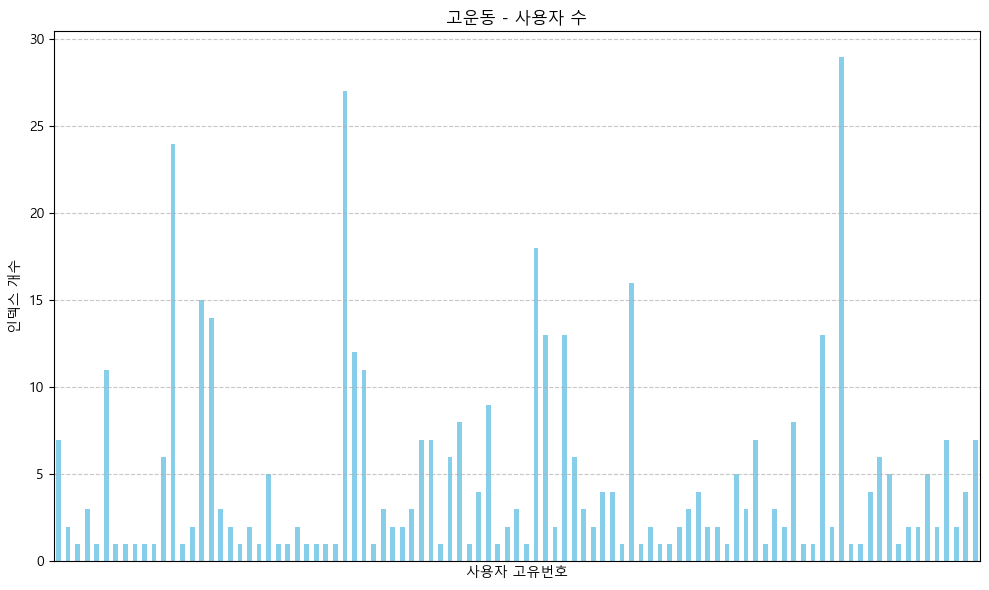

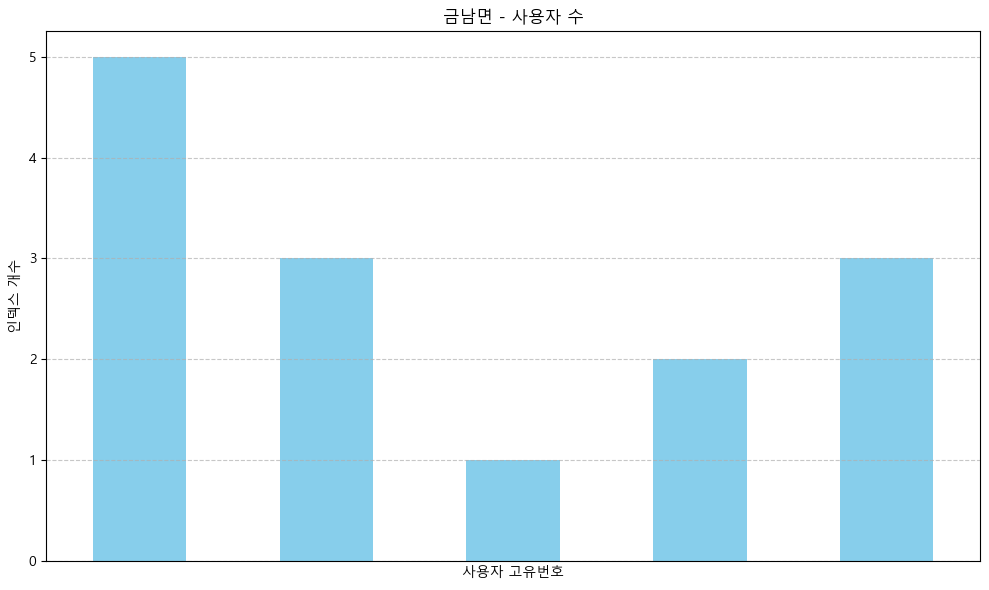

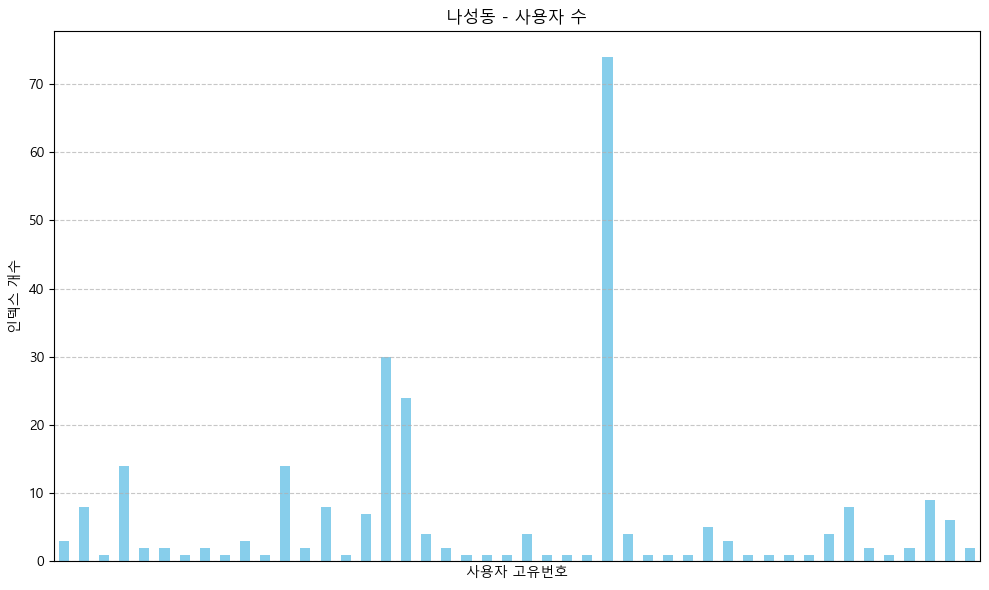

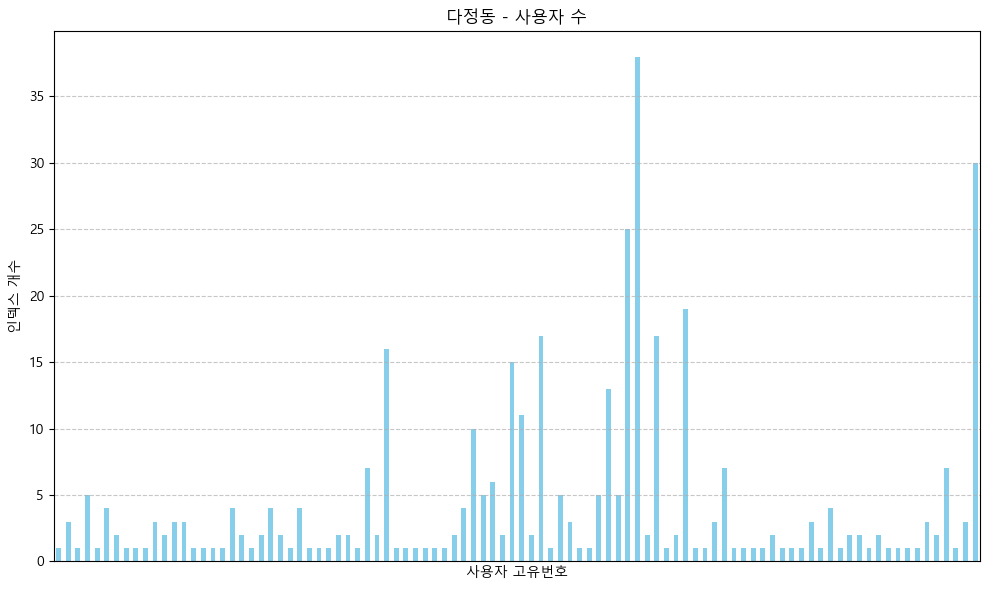

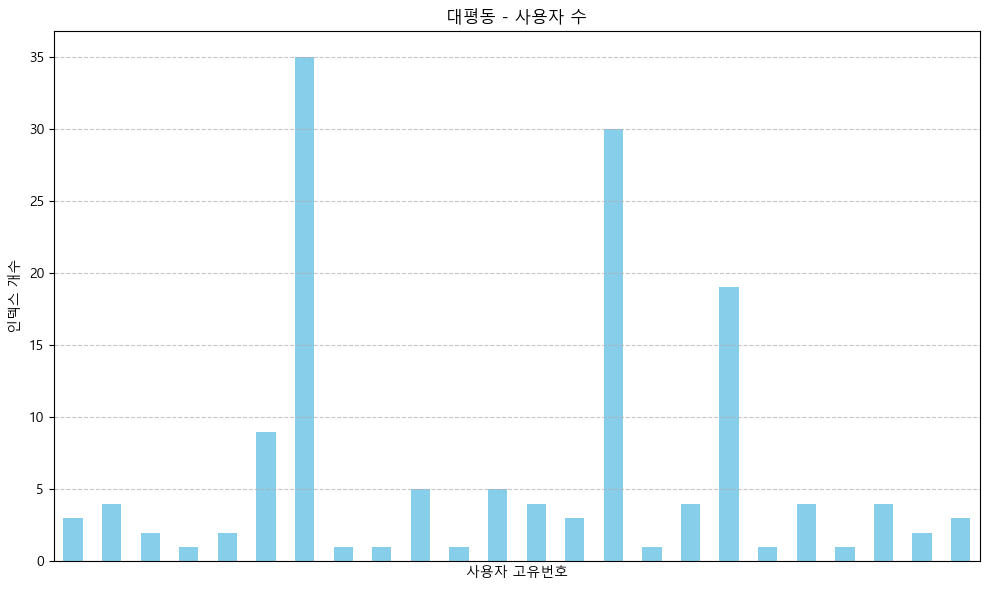

...

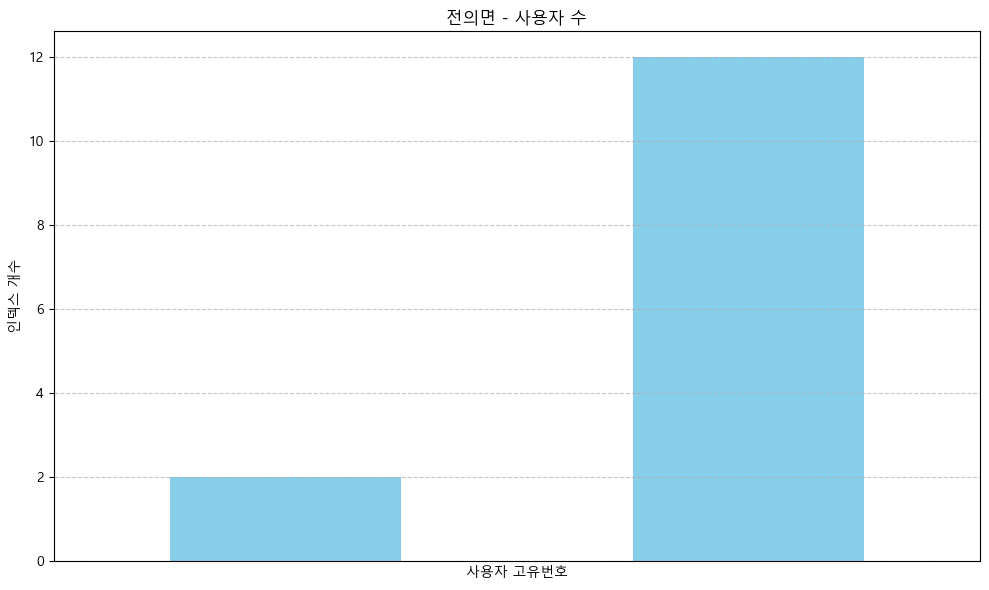

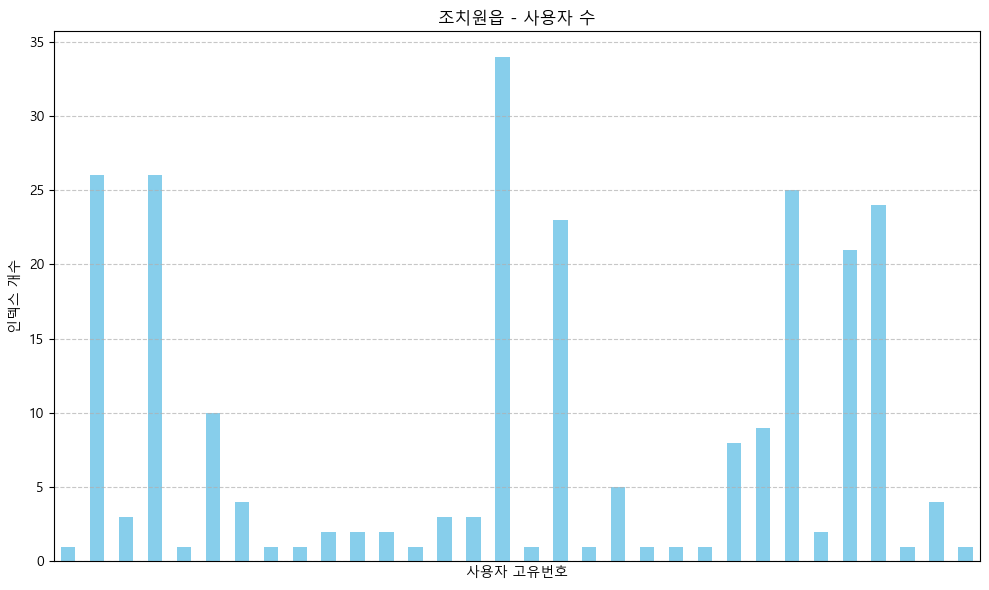

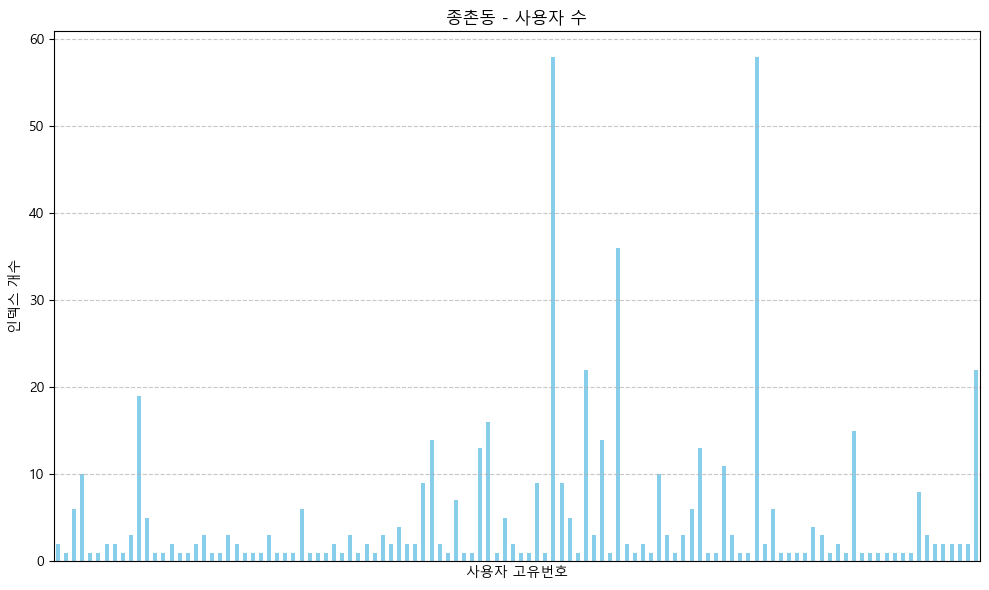

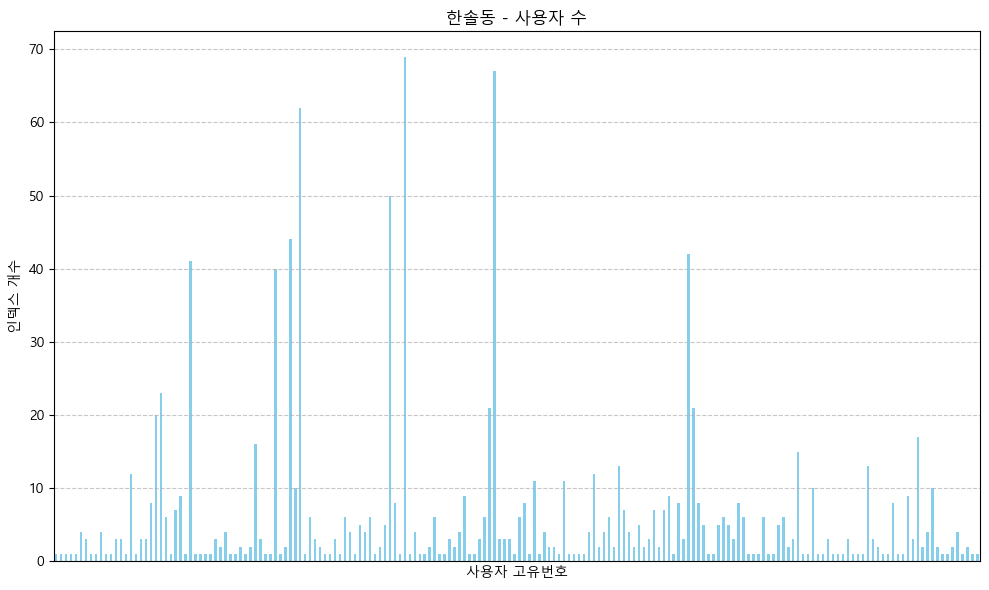

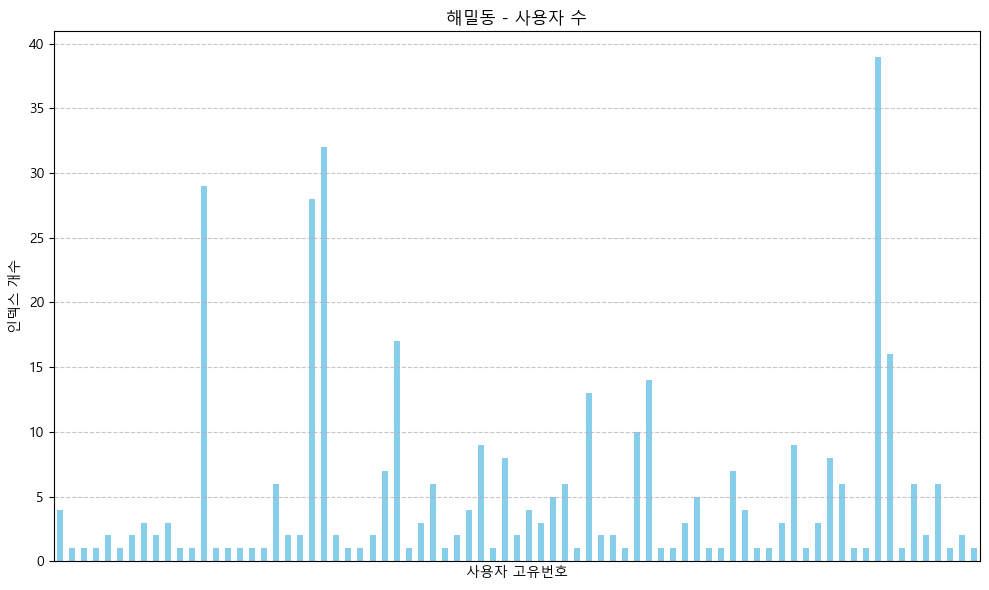

In [1609]:
#다른 도시는 어떨까
grouped = base_stress.groupby('행정동명')

# 모든 '행정동명'에 대해 반복
for name, group in grouped:
    # '사용자 고유번호'별로 그룹화하고 인덱스 개수 세기
    index_counts = group.groupby('사용자 고유번호').size()

    # 그래프 그리기
    plt.figure(figsize=(10, 6))
    index_counts.plot(kind='bar', color='skyblue')
    plt.xlabel('사용자 고유번호')
    plt.ylabel('인덱스 개수')
    plt.title(f'{name} - 사용자 수')
    plt.xticks([])
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

In [1610]:
def draw_radar_chart(df, rows, features):
    # 특정 행들의 평균 계산
    avg_values = df.loc[rows, features].mean()

    # 각 열의 평균값을 딕셔너리로 변환
    avg_dict = avg_values.to_dict()

    # 각 꼭짓점에 해당하는 label 설정
    labels = features
    num_vars = len(labels)

    # 각 꼭짓점의 각도 설정
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]  # 첫 번째 값을 마지막에 추가해서 원형으로 만듦

    # 레이더 차트 그리기
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # 데이터 준비
    values = []
    for feature in features:
        if feature.endswith('단계'):
            max_val = 5
        else:
            max_val = 100
        # 비율로 변환
        scaled_value = (avg_dict[feature] / max_val) * 100
        values.append(scaled_value)

    values += values[:1]  # 첫 번째 값을 마지막에 추가해서 원형으로 만듦

    # 레이더 차트 그리기
    ax.fill(angles, values, color='red', alpha=0.25)
    ax.plot(angles, values, color='red', linewidth=2)

    # 각 꼭짓점의 label 설정
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # 그리드 선 및 label 설정
    ax.set_yticks([20, 40, 60, 80, 100])
    ax.set_yticklabels(['20', '40', '60', '80', '100'])

    # 각 꼭짓점 옆에 데이터 값 표시
    for i, value in enumerate(values[:-1]):
        angle_rad = angles[i]
        ax.text(angle_rad, value + 5, f'{value:.1f}', horizontalalignment='center', size=12, color='black')

    # 제목 설정: rows의 개수를 제목으로 설정
    row_count = len(df.loc[rows])
    plt.title(f'Radar Chart (n= {row_count})', size=20, color='blue', y=1.1)

    plt.show()

    # 평균값 딕셔너리 반환
    return avg_dict

# 함수 호출 예시
# avg_dict = draw_radar_chart(df_stress, rows=df_stress['성별'] == 'M', features=['피로도 값', '신체스트레스 값', '정신스트레스 값', '심장안정도 값', '스트레스대처능력 값'])
# 2번째 매개변수에 df_stress.index 하면 전체 항목 전달
# features=['말초혈관탄성도 값','동맥혈관탄성도 값','혈관단계']

In [1611]:
def compare_dicts(dict1, dict2, label1='Dict1', label2='Dict2'):
    # 두 딕셔너리에서 공통 key 찾기
    common_keys = dict1.keys() & dict2.keys()

    # 공통 key에 대해 value의 차이를 계산
    differences = {key: dict2[key] - dict1[key] for key in common_keys}

    # 막대 그래프 그리기
    keys = list(differences.keys())
    values = list(differences.values())

    # 막대를 가운데에 놓기 위해 offset을 지정
    y_pos = np.arange(len(keys))

    plt.barh(y_pos, values, align='center', color=['blue' if x >= 0 else 'red' for x in values])
    plt.yticks(y_pos, keys)
    plt.axvline(0, color='black', linewidth=0.5)  # 축을 가운데에 위치
    plt.xlabel('Difference')
    plt.title(f'{label1}  vs {label2} (높을수록 좋은거)')

    plt.show()

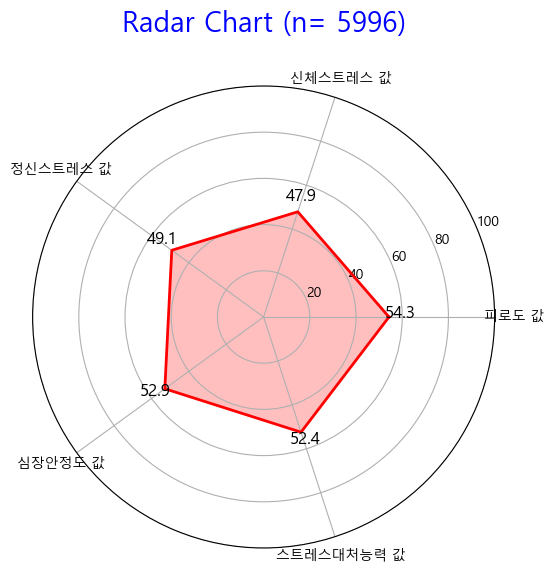

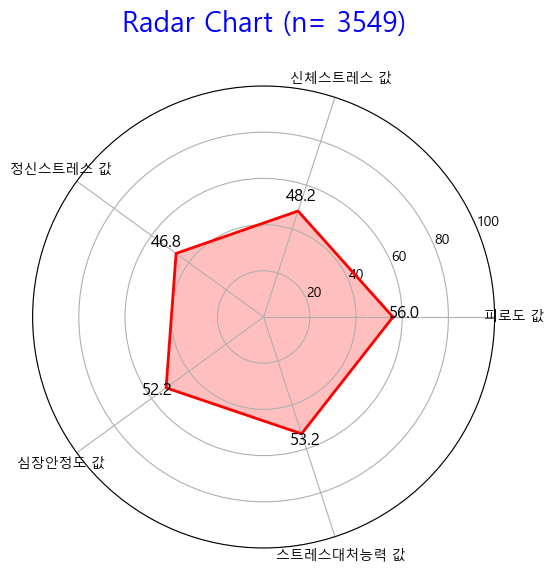

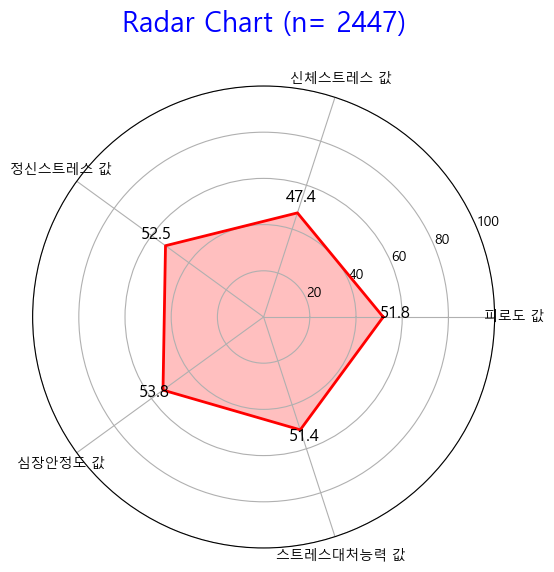

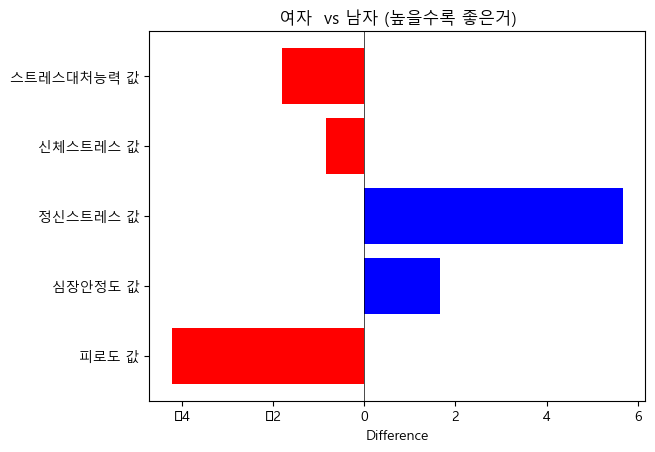

{'피로도 값': 55.99338686954072,
 '신체스트레스 값': 48.22605804451958,
 '정신스트레스 값': 46.82528036066497,
 '심장안정도 값': 52.182592279515355,
 '스트레스대처능력 값': 53.159050436742746}

In [1612]:
draw_radar_chart(df_stress, df_stress.index, features=['피로도 값', '신체스트레스 값', '정신스트레스 값', '심장안정도 값', '스트레스대처능력 값'])
avg_dict_F = draw_radar_chart(df_stress, rows=df_stress['성별'] == 'F', features=['피로도 값', '신체스트레스 값', '정신스트레스 값', '심장안정도 값', '스트레스대처능력 값'])
avg_dict_M= draw_radar_chart(df_stress, rows=df_stress['성별'] == 'M', features=['피로도 값', '신체스트레스 값', '정신스트레스 값', '심장안정도 값', '스트레스대처능력 값'])

compare_dicts(avg_dict_F,avg_dict_M,'여자','남자')
avg_dict_F

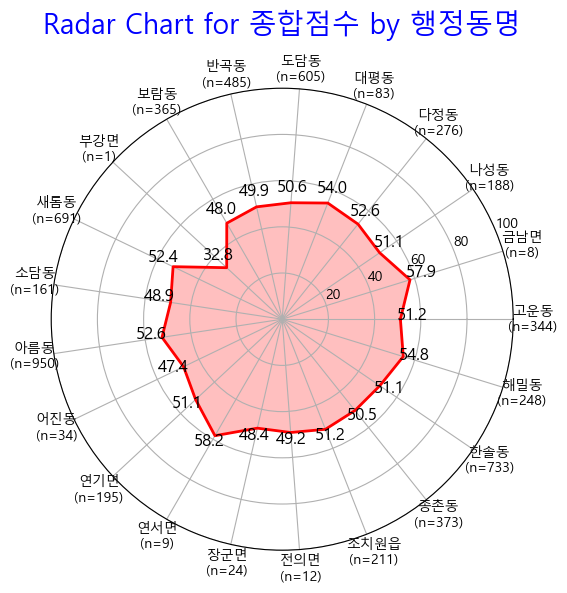

In [1613]:
def draw_radar_chart_group(df, group_column, feature):
    # 그룹별 평균 계산
    avg_values = df.groupby(group_column)[feature].mean()

    # 각 그룹의 데이터 개수 계산
    count_values = df.groupby(group_column).size()

    # 레이더 차트 그리기
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # 각 꼭짓점에 해당하는 label 설정
    labels = [f'{label}\n(n={count})' for label, count in zip(avg_values.index, count_values)]  # '행정동명 (n=개수)' 형태로 표시
    num_vars = len(labels)

    # 각 꼭짓점의 각도 설정
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]  # 첫 번째 값을 마지막에 추가해서 원형으로 만듦

    # 레이더 차트에 그릴 데이터 준비
    values = avg_values.tolist()
    values += values[:1]  # 첫 번째 값을 마지막에 추가해서 원형으로 만듦

    # 레이더 차트 그리기
    ax.fill(angles, values, color='red', alpha=0.25)
    ax.plot(angles, values, color='red', linewidth=2)

    # 각 꼭짓점의 label 설정
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # 그리드 선 및 label 설정
    ax.set_yticks([20, 40, 60, 80, 100])
    ax.set_yticklabels(['20', '40', '60', '80', '100'])

    # 각 꼭짓점 옆에 데이터 값 표시
    for i, value in enumerate(values[:-1]):
        angle_rad = angles[i]
        ax.text(angle_rad, value + 5, f'{value:.1f}', horizontalalignment='center', size=12, color='black')

    # 제목 설정
    plt.title(f'Radar Chart for {feature} by {group_column}', size=20, color='blue', y=1.1)

    plt.show()

    # 평균값 시리즈 반환
    return avg_values, count_values

# 함수 호출 예시
avg_dict_count, count_dict = draw_radar_chart_group(
    df_stress,
    group_column='행정동명',
    feature='종합점수'
)

#print(avg_dict_count)
#print(count_dict)


In [1614]:
adf_stress.info()
#연령대
adf_stress['연령대'] = (adf_stress['나이'] // 10 * 10)

<class 'pandas.core.frame.DataFrame'>
Index: 5996 entries, 5 to 8578
Data columns (total 37 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   사용자 고유번호     5996 non-null   object 
 1   측정일자         5996 non-null   object 
 2   측정시간         5996 non-null   object 
 3   성별           5996 non-null   object 
 4   사용자 출생년도     5996 non-null   int64  
 5   행정동명         5996 non-null   object 
 6   평균심박수        5996 non-null   int64  
 7   이상심박수        5996 non-null   int64  
 8   자율신경활성도 값    5996 non-null   float64
 9   자율신경활성도 단계   5996 non-null   int64  
 10  피로도 값        5996 non-null   float64
 11  피로도 단계       5996 non-null   int64  
 12  심장안정도 값      5996 non-null   float64
 13  심장안정도 단계     5996 non-null   int64  
 14  자율신경 균형도     5996 non-null   int64  
 15  신체스트레스 값     5996 non-null   float64
 16  신체스트레스 단계    5996 non-null   int64  
 17  정신스트레스 값     5996 non-null   float64
 18  정신스트레스 단계    5996 non-null   int64  
 19  스트레스대처능력 값 

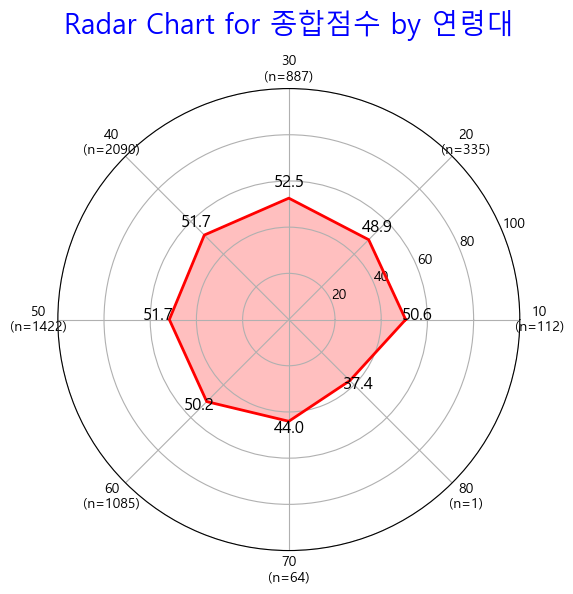

(연령대
 10    50.574554
 20    48.889313
 30    52.547835
 40    51.734699
 50    51.723952
 60    50.241806
 70    44.036406
 80    37.380000
 Name: 종합점수, dtype: float64,
 연령대
 10     112
 20     335
 30     887
 40    2090
 50    1422
 60    1085
 70      64
 80       1
 dtype: int64)

In [1615]:
draw_radar_chart_group( adf_stress,
    group_column='연령대',
    feature='종합점수'
)

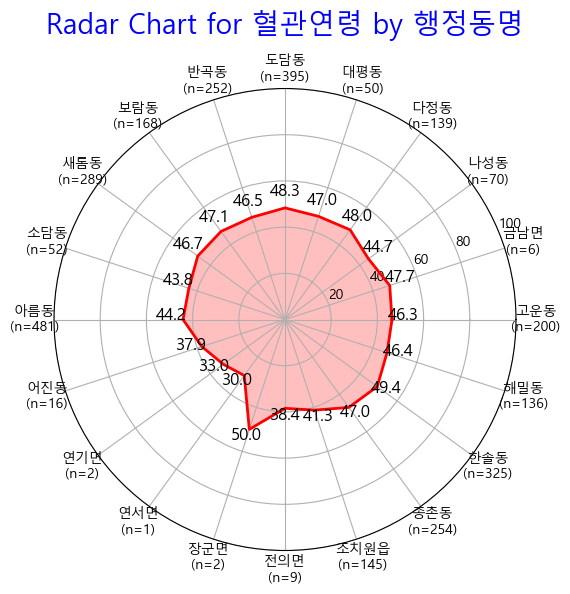

(행정동명
 고운동     46.320000
 금남면     47.666667
 나성동     44.671429
 다정동     47.985612
 대평동     46.960000
 도담동     48.324051
 반곡동     46.519841
 보람동     47.130952
 새롬동     46.709343
 소담동     43.769231
 아름동     44.155925
 어진동     37.875000
 연기면     33.000000
 연서면     30.000000
 장군면     50.000000
 전의면     38.444444
 조치원읍    41.255172
 종촌동     47.023622
 한솔동     49.350769
 해밀동     46.441176
 Name: 혈관연령, dtype: float64,
 행정동명
 고운동     200
 금남면       6
 나성동      70
 다정동     139
 대평동      50
 도담동     395
 반곡동     252
 보람동     168
 새롬동     289
 소담동      52
 아름동     481
 어진동      16
 연기면       2
 연서면       1
 장군면       2
 전의면       9
 조치원읍    145
 종촌동     254
 한솔동     325
 해밀동     136
 dtype: int64)

In [1616]:
draw_radar_chart_group( df_vessel,
    group_column='행정동명',
    feature='혈관연령'
)

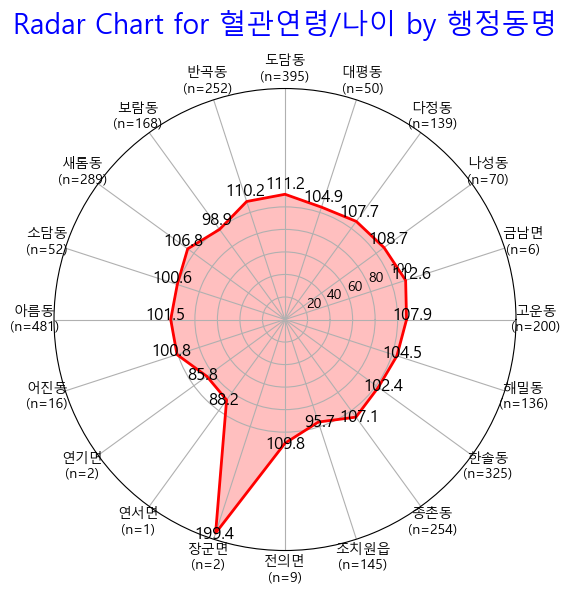

(행정동명
 고운동     107.911111
 금남면     112.604948
 나성동     108.650501
 다정동     107.675697
 대평동     104.874654
 도담동     111.191466
 반곡동     110.171847
 보람동      98.868403
 새롬동     106.795127
 소담동     100.565689
 아름동     101.488426
 어진동     100.792065
 연기면      85.805423
 연서면      88.235294
 장군면     199.404762
 전의면     109.841270
 조치원읍     95.712901
 종촌동     107.113726
 한솔동     102.413151
 해밀동     104.471344
 Name: 혈관연령/나이, dtype: float64,
 행정동명
 고운동     200
 금남면       6
 나성동      70
 다정동     139
 대평동      50
 도담동     395
 반곡동     252
 보람동     168
 새롬동     289
 소담동      52
 아름동     481
 어진동      16
 연기면       2
 연서면       1
 장군면       2
 전의면       9
 조치원읍    145
 종촌동     254
 한솔동     325
 해밀동     136
 dtype: int64)

In [1617]:
df_vessel['혈관연령/나이']=df_vessel['혈관연령']*100/adf_vessel['나이']
draw_radar_chart_group( df_vessel,
    group_column='행정동명',
    feature='혈관연령/나이')

---

## 6-4. 혈압 통해 똑똑건강 이용 현항 분석 수행

In [1629]:
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

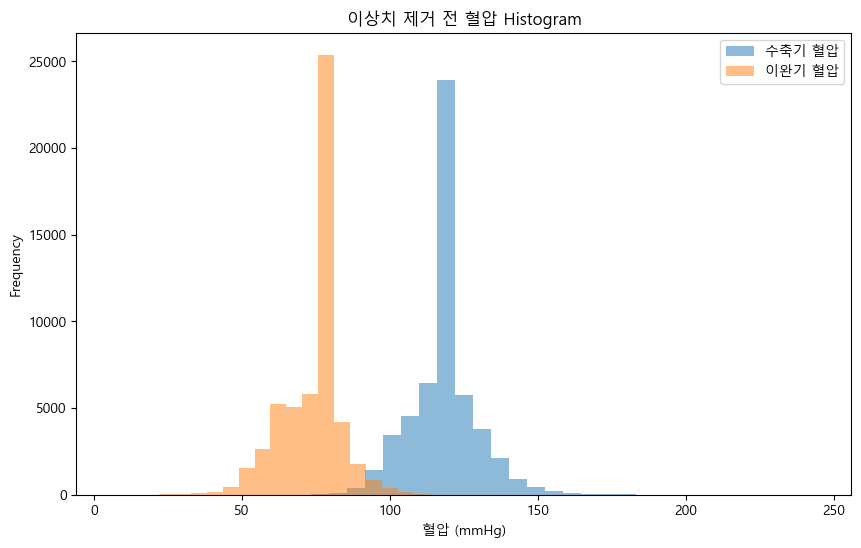

In [1631]:
# 혈압 이상치 제거 전 히스토그램
plt.figure(figsize=(10, 6))
df_blood['수축 혈압'].plot.hist(bins=30, alpha=0.5, label='수축기 혈압')
df_blood['이완 혈압'].plot.hist(bins=30, alpha=0.5, label='이완기 혈압')
plt.legend()
plt.title('이상치 제거 전 혈압 Histogram')
plt.xlabel('혈압 (mmHg)')
plt.show()

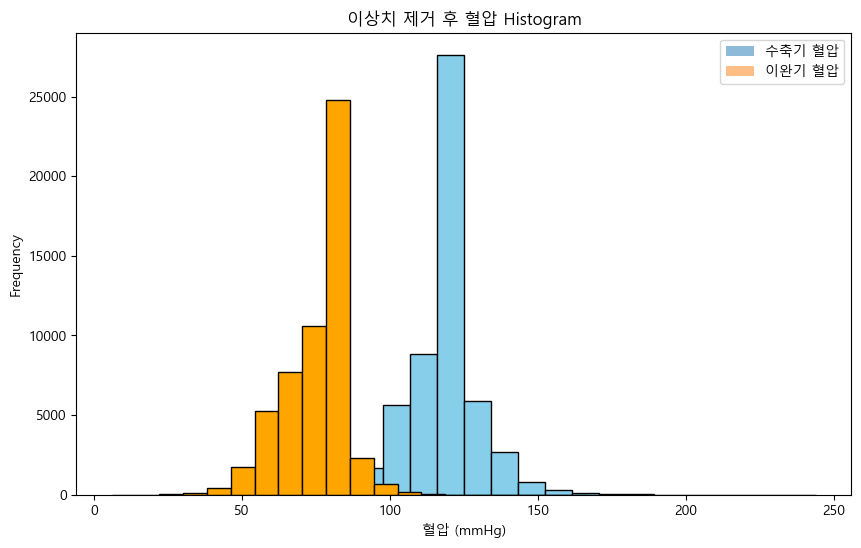

In [1633]:
# 혈압 이상치 제거 후 히스토그램
plt.figure(figsize=(10, 6))
df_blood_cleaned['수축 혈압'].plot.hist(bins=30, alpha=0.5, label='수축기 혈압')
df_blood_cleaned['이완 혈압'].plot.hist(bins=30, alpha=0.5, label='이완기 혈압')
plt.legend()
plt.hist(df_blood['수축 혈압'], bins=20, color='skyblue', edgecolor='black')  # 히스토그램 색상과 테두리 설정
plt.hist(df_blood['이완 혈압'], bins=20, color='orange', edgecolor='black')
plt.title('이상치 제거 후 혈압 Histogram')
plt.xlabel('혈압 (mmHg)')
plt.show()

In [1635]:
# 혈압 이상치 제거 전 Value Counts와 Bar Plot
bp_counts = df_blood['수축 혈압'].value_counts().sort_index()
bp_counts

수축 혈압
61     1
64     1
67     1
69     1
71     1
      ..
217    1
224    1
225    1
232    1
244    1
Name: count, Length: 133, dtype: int64

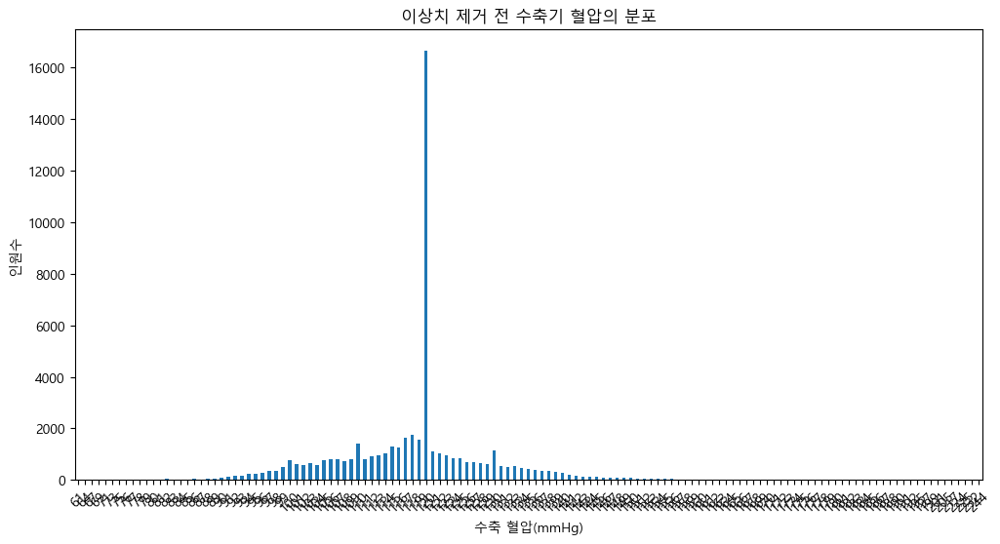

In [1637]:
# 혈압 이상치 제거 전 value_counts를 이용한 Bar Plot 그리기
plt.figure(figsize=(12, 6))
bp_counts.plot.bar()
plt.title('이상치 제거 전 수축기 혈압의 분포')
plt.xlabel('수축 혈압(mmHg)')
plt.ylabel('인원수')

# x축 레이블 회전
plt.xticks(rotation=45)  # 45도 회전

plt.show()

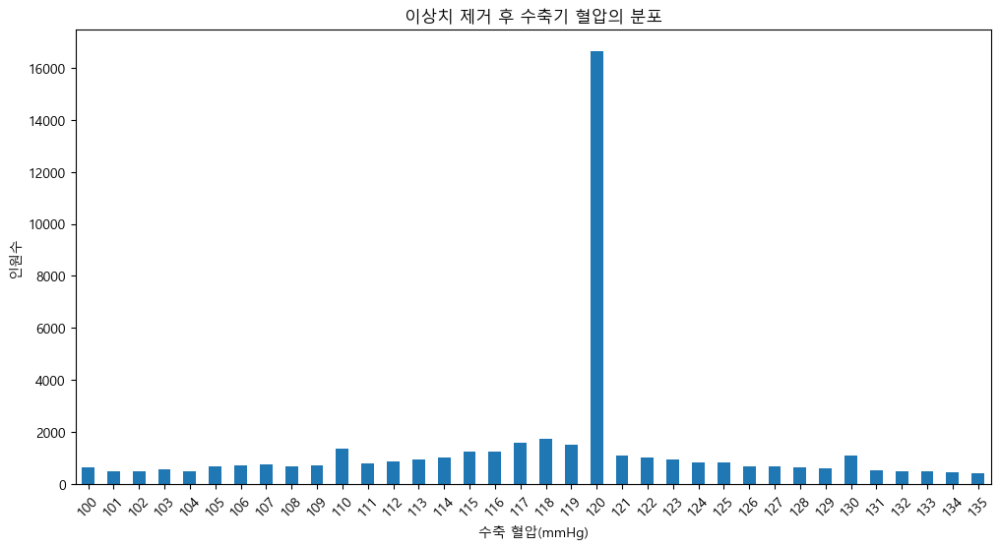

In [1638]:
# 혈압 이상치 제거 후 Value Counts와 Bar Plot
bp_counts = df_blood_cleaned['수축 혈압'].value_counts().sort_index()

# Bar Plot 그리기
plt.figure(figsize=(12, 6))
bp_counts.plot.bar()
plt.title('이상치 제거 후 수축기 혈압의 분포')
plt.xlabel('수축 혈압(mmHg)')
plt.ylabel('인원수')

# x축 레이블 회전
plt.xticks(rotation=45)

plt.show()

In [1641]:
df_blood.head()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도,나이
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0,2021,29
1,CAD4E5E5AE8D7CACE0535F00A8C075E0,2021-08-31,14:10,F,1983,종촌동,101,55,68.0,2021,40
2,CAD50BA68DA78C38E0535F00A8C01524,2021-08-31,14:19,F,1981,종촌동,117,83,86.0,2021,42
3,CAD71E638BAC342BE0535F00A8C05272,2021-08-31,16:48,M,1980,한솔동,157,96,65.0,2021,43
4,CAD72451510337B6E0535F00A8C02A56,2021-08-31,17:00,M,1952,한솔동,139,68,55.0,2021,71


In [1643]:
df_blood.tail()

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도,나이
53773,CF28FDE31F340DF7E0535F00A8C0BFE5,2023-12-31,23:39,M,1979,새롬동,120,80,NaN,2023,44
53774,D97915F0A035D41DE0535F00A8C06243,2023-12-31,23:42,F,1982,다정동,120,80,NaN,2023,41
53775,ED2C36A4C579AADFE0535F00A8C071AE,2023-12-31,23:49,F,1976,새롬동,119,78,NaN,2023,47
53776,EC60BDA0AB32BDE8E0535F00A8C0CB28,2023-12-31,23:50,F,1982,소담동,117,73,NaN,2023,41
53777,ED47D5D202D28AB6E0535F00A8C0CE6C,2023-12-31,23:52,M,1974,새롬동,150,101,NaN,2023,49


In [1645]:
# 혈압 연령대별 평균 확인
age_group = df_blood.groupby('나이')[['수축 혈압', '이완 혈압']].mean()
print(age_group)


         수축 혈압      이완 혈압
나이                       
8   113.181818  74.636364
11  109.041667  75.020833
12  112.400000  68.400000
13  109.400000  66.000000
14  113.625000  69.750000
..         ...        ...
73  125.833333  76.000000
74  120.250000  67.666667
75  126.500000  54.750000
76  121.500000  64.000000
79   98.777778  54.888889

[68 rows x 2 columns]


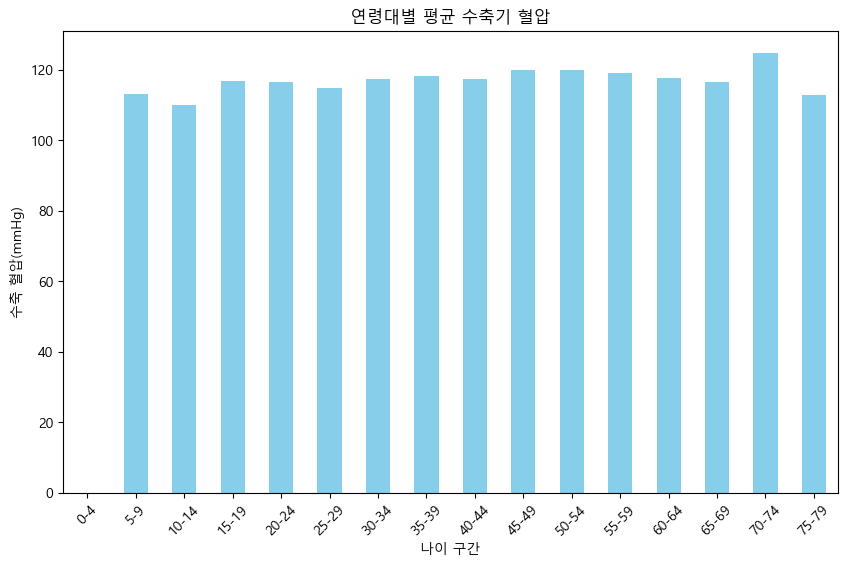

In [1647]:
# 나이를 5살 간격으로 나누는 구간 설정
bins = range(0, df_blood['나이'].max() + 5, 5)
labels = [f'{i}-{i+4}' for i in bins[:-1]]
df_blood['나이 구간'] = pd.cut(df_blood['나이'], bins=bins, labels=labels, right=False)
age_group = df_blood.groupby('나이 구간')[['수축 혈압', '이완 혈압']].mean()

# 연령대별 수축기 혈압의 평균 시각화
plt.figure(figsize=(10, 6))
age_group['수축 혈압'].plot(kind='bar', color='skyblue')
plt.title('연령대별 평균 수축기 혈압')
plt.xlabel('나이 구간')
plt.ylabel('수축 혈압(mmHg)')
plt.xticks(rotation=45)
plt.show()

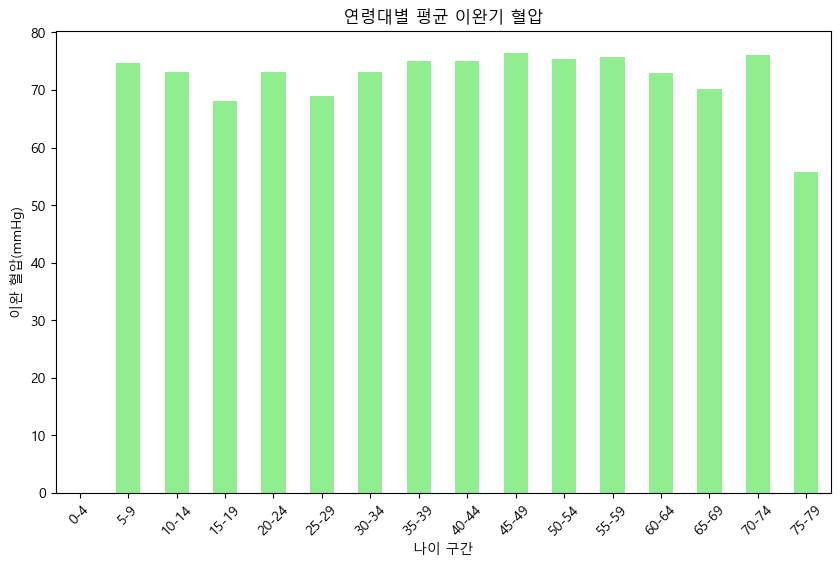

In [1649]:
# 연령대별 이완기 혈압의 평균 시각화
plt.figure(figsize=(10, 6))
age_group['이완 혈압'].plot(kind='bar', color='lightgreen')
plt.title('연령대별 평균 이완기 혈압')
plt.xlabel('나이 구간')
plt.ylabel('이완 혈압(mmHg)')
plt.xticks(rotation=45)
plt.show()

In [1651]:
df_blood.head(1)

,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,수축 혈압,이완 혈압,맥박,측정연도,나이,나이 구간
0,CA5E614540CE0769E0535F00A8C08588,2021-08-30,14:17,M,1994,나성동,128,78,92.0,2021,29,25-29


           수축 혈압      이완 혈압
행정동명                       
고운동   116.737715  75.388702
금남면   113.722222  68.166667
나성동   121.869969  77.659830
다정동   119.010294  76.306066
대평동   121.052461  77.566388
도담동   119.772025  74.207915
반곡동   120.440465  75.137948
보람동   118.905713  75.115861
부강면   114.250000  67.800000
새롬동   115.424503  72.379735
소담동   120.887755  78.537609
아름동   117.614114  74.423580
어진동   125.354125  80.671026
연기면   104.175503  58.592322
연동면   134.571429  84.428571
연서면   121.958333  73.583333
장군면   126.301653  76.888430
전동면   138.000000  61.500000
전의면   125.000000  78.804878
조치원읍  120.076923  77.203526
종촌동   118.334810  72.631216
한솔동   118.107613  72.982143
해밀동   117.307933  72.606496


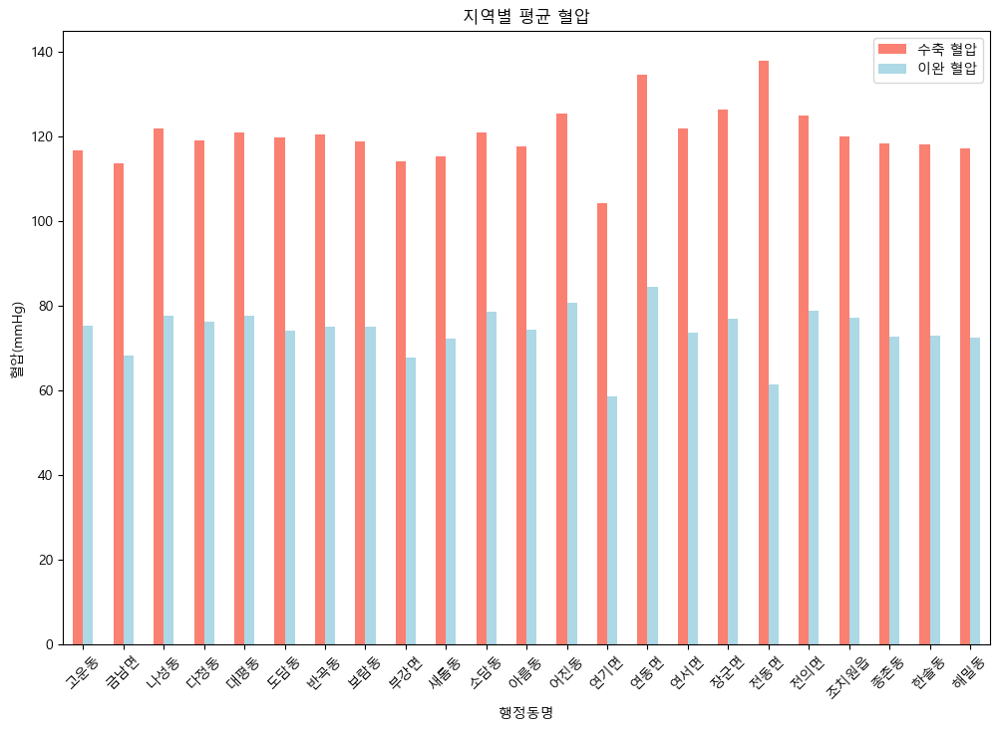

In [1653]:
# 지역별 수축기 및 이완기 혈압의 평균 구하기
region_group = df_blood.groupby('행정동명')[['수축 혈압', '이완 혈압']].mean()
print(region_group)

# 지역별 수축기 및 이완기 혈압 시각화
region_group.plot(kind='bar', figsize=(12, 8), color=['salmon', 'lightblue'],rot=(45))
plt.title('지역별 평균 혈압')
plt.xlabel('행정동명')
plt.ylabel('혈압(mmHg)')
plt.show()

## 나이 구간별 고혈압 비율 시각화

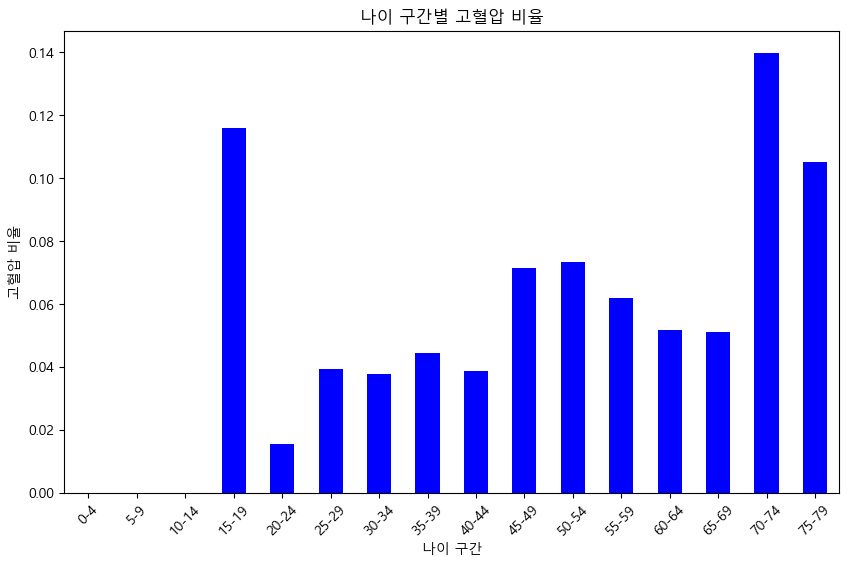

In [1656]:
# 고혈압 기준 정의
high_bp = (df_blood['수축 혈압'] >= 140) | (df_blood['이완 혈압'] >= 90)

# 나이를 5살 간격으로 나누는 구간 설정
bins = range(0, df_blood['나이'].max() + 5, 5)
labels = [f'{i}-{i+4}' for i in bins[:-1]]

# '나이 구간' 열 생성
df_blood['나이 구간'] = pd.cut(df_blood['나이'], bins=bins, labels=labels, right=False)

# 나이 구간별 고혈압 비율 계산
age_group_high_bp = df_blood[high_bp].groupby('나이 구간').size() / df_blood.groupby('나이 구간').size()

# 나이 구간별 고혈압 비율 시각화
plt.figure(figsize=(10, 6))
age_group_high_bp.plot(kind='bar', color='blue')
plt.title('나이 구간별 고혈압 비율')
plt.xlabel('나이 구간')
plt.ylabel('고혈압 비율')
plt.xticks(rotation=45)
plt.show()

         수축 혈압      이완 혈압
성별                       
F   116.223228  72.987699
M   121.118262  76.898266


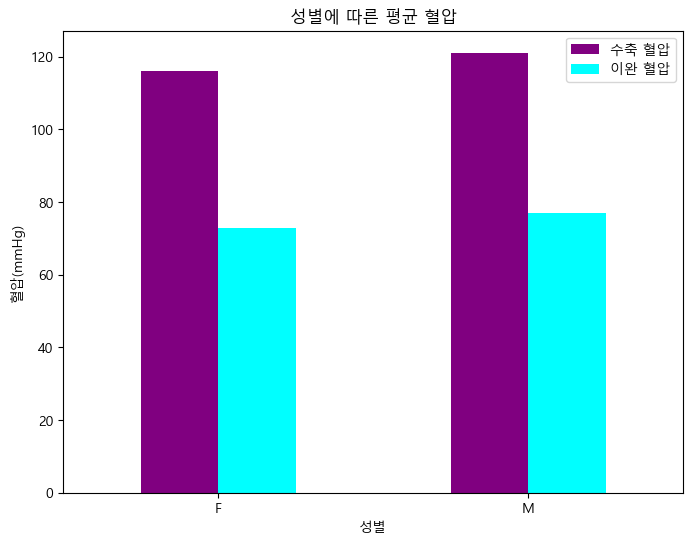

In [1658]:
# 성별에 따른 수축기 및 이완기 혈압의 평균 구하기
gender_group = df_blood.groupby('성별')[['수축 혈압', '이완 혈압']].mean()
print(gender_group)

# 성별에 따른 혈압 분포 시각화
gender_group.plot(kind='bar', figsize=(8, 6), color=['purple', 'cyan'], rot=0)
plt.title('성별에 따른 평균 혈압')
plt.xlabel('성별')
plt.ylabel('혈압(mmHg)')
plt.show()


## 세종시 혈압 이상치 동별 분포 확인

In [1661]:
# 데이터 불러오기
outlier_data = pd.read_csv('data/세종특별자치시_혈압 이상치_데이터.csv')
population_data = pd.read_excel('data/2024년_7월_말_기준_인구현황.xlsx')

# 데이터 확인
print("Outlier Data")
print(outlier_data.head())

print("\nPopulation Data")
print(population_data.head())


Outlier Data
                           사용자 고유번호        측정일자   측정시간 성별  사용자 출생년도 행정동명  \
0  CAD71E638BAC342BE0535F00A8C05272  2021-08-31  16:48  M      1980  한솔동   
1  CAD72451510337B6E0535F00A8C02A56  2021-08-31  17:00  M      1952  한솔동   
2  CAEEA89380A90716E0535F00A8C0F342  2021-09-01  20:58  F      1957  한솔동   
3  CAFCD67A8E9F55EAE0535F00A8C04C8B  2021-09-02  14:19  F      1990  고운동   
4  CA4C04225E405C30E0535F00A8C03ECD  2021-09-02  18:44  F      1995  다정동   

   수축 혈압  이완 혈압    맥박  측정연도  나이  
0    157     96  65.0  2021  43  
1    139     68  55.0  2021  71  
2    136     64  61.0  2021  66  
3     80     48  88.0  2021  33  
4    158     88  91.0  2021  28  

Population Data
   행정동명    구분    전체인구  지역별전체인구비율    내국인계  지역별내국인비율  전월대비증감      남자     남자구성비  \
0    총합     계  394630   1.000000  388788  1.000000     848  193538  0.497798   
1  조치원읍  조치원읍   42154   0.106819   40498  0.104165     -30   21036  0.054107   
2   연기면   연기면    2500   0.006335    2409  0.006196      -5    1384  0

### 세종시 혈압 이상치 동별 분포 비율 비교 시각화

    행정동명  이상치 빈도   전체인구  이상치 비율 (%)
0    한솔동    1287  18143    7.093645
1    새롬동    1031  26479    3.893652
2    아름동     736  23383    3.147586
3    반곡동     499  28923    1.725271
4    고운동     458  35964    1.273496
5    다정동     452  28312    1.596496
6    도담동     400  24976    1.601537
7    종촌동     396  27879    1.420424
8    해밀동     352  16612    2.118950
9    나성동     276  13176    2.094718
10   보람동     209  18924    1.104418
11   어진동     177  11278    1.569427
12  조치원읍     175  42154    0.415144
13   연기면     163   2500    6.520000
14   소담동     155  21772    0.711924
15   대평동     146  11293    1.292836
16   장군면      66   7032    0.938567
17   금남면       7   8581    0.081576
18   부강면       6   5755    0.104257
19   전의면       5   5694    0.087812
20   연서면       4   7045    0.056778
21   연동면       3   2978    0.100739
22   전동면       1   3421    0.029231


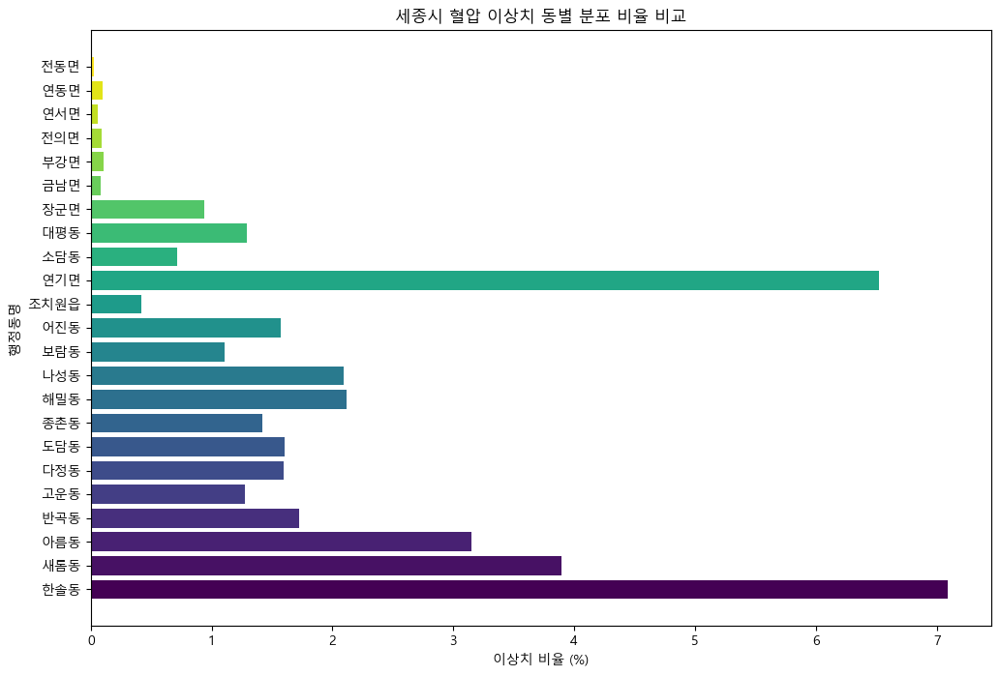

In [1664]:
# 이상치 데이터에서 행정동별 빈도 계산
outlier_counts = outlier_data['행정동명'].value_counts().reset_index()
outlier_counts.columns = ['행정동명', '이상치 빈도']

# 인구 데이터에서 행정동명별 인구 데이터만 추출
population_summary = population_data[['행정동명', '전체인구']].copy()

# 이상치 빈도와 인구 데이터 병합
comparison_data = pd.merge(outlier_counts, population_summary, on='행정동명', how='left')

# 이상치 빈도를 인구 대비 백분율 계산
comparison_data['이상치 비율 (%)'] = (comparison_data['이상치 빈도'] / comparison_data['전체인구']) * 100

# 결과 확인
print(comparison_data)

# 시각화
plt.figure(figsize=(12, 8))
bars = plt.barh(comparison_data['행정동명'], comparison_data['이상치 비율 (%)'],color=plt.cm.viridis(np.linspace(0, 1, len(comparison_data))))
plt.xlabel('이상치 비율 (%)')
plt.ylabel('행정동명')
plt.title('세종시 혈압 이상치 동별 분포 비율 비교')
plt.show()

### 세종시 행정동별 남성과 여성 인구 비교

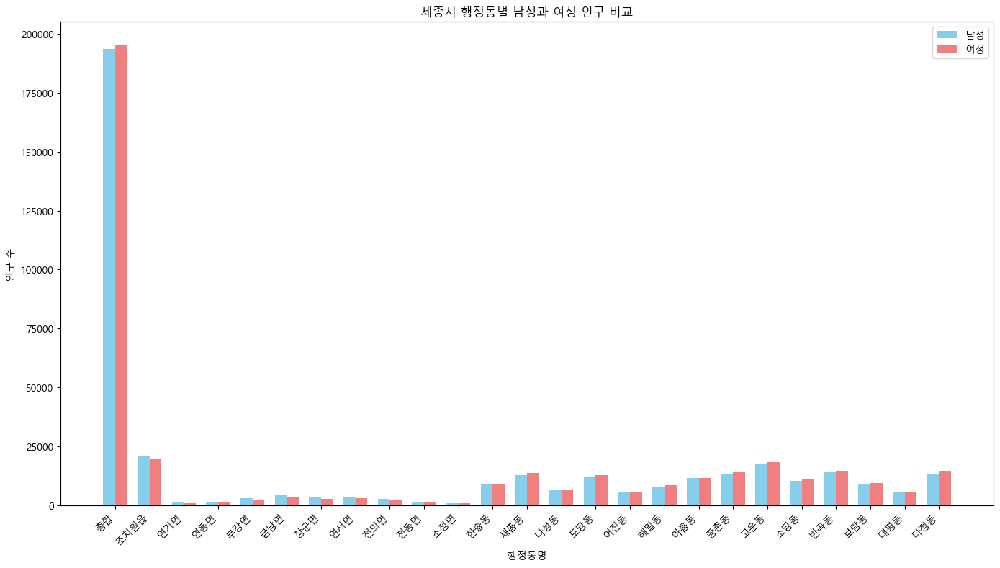

In [1667]:
# 필요한 데이터만 추출
gender_data = population_data[['행정동명', '남자', '여자']].copy()

# 막대의 위치 설정
x = np.arange(len(gender_data))  # 행정동별 위치
width = 0.35  # 막대의 너비

# 시각화
fig, ax = plt.subplots(figsize=(14, 8))

bars1 = ax.bar(x - width/2, gender_data['남자'], width, label='남성', color='skyblue')
bars2 = ax.bar(x + width/2, gender_data['여자'], width, label='여성', color='lightcoral')

# 레이블 및 제목 설정
ax.set_xlabel('행정동명')
ax.set_ylabel('인구 수')
ax.set_title('세종시 행정동별 남성과 여성 인구 비교')
ax.set_xticks(x)
ax.set_xticklabels(gender_data['행정동명'], rotation=45, ha="right")
ax.legend()

# 그래프 보여주기
plt.tight_layout()
plt.show()

## 중증 고혈압(수축기) 질환의 기준 정의와 출처

#### 고혈압의 정의:
###### -정상 혈압: 수축기 혈압 < 120mmHg, 이완기 혈압 < 80mmHg
###### -고혈압 전단계: 수축기 혈압 120-139mmHg 또는 이완기 혈압 80-89mmHg
###### -1기 고혈압: 수축기 혈압 140-159mmHg 또는 이완기 혈압 90-99mmHg
###### -2기 고혈압 (중증 고혈압): 수축기 혈압 ≥ 160mmHg 또는 이완기 혈압 ≥ 100mmHg
####   -중증 질환의 기준: 수축기 혈압이 160mmHg 이상이거나 이완기 혈압이 100mmHg 이상일 때
####     중증 고혈압으로 분류되며, 이는 즉각적인 치료가 필요한 상태입니다.

##### 출처:
###### 대한고혈압학회 (Korean Society of Hypertension) 고혈압 진단 기준
###### American College of Cardiology/American Heart Association (ACC/AHA) 2017 Hypertension Guidelines

### 세종시 행정동별 중증 고혈압 대상자수 시작화

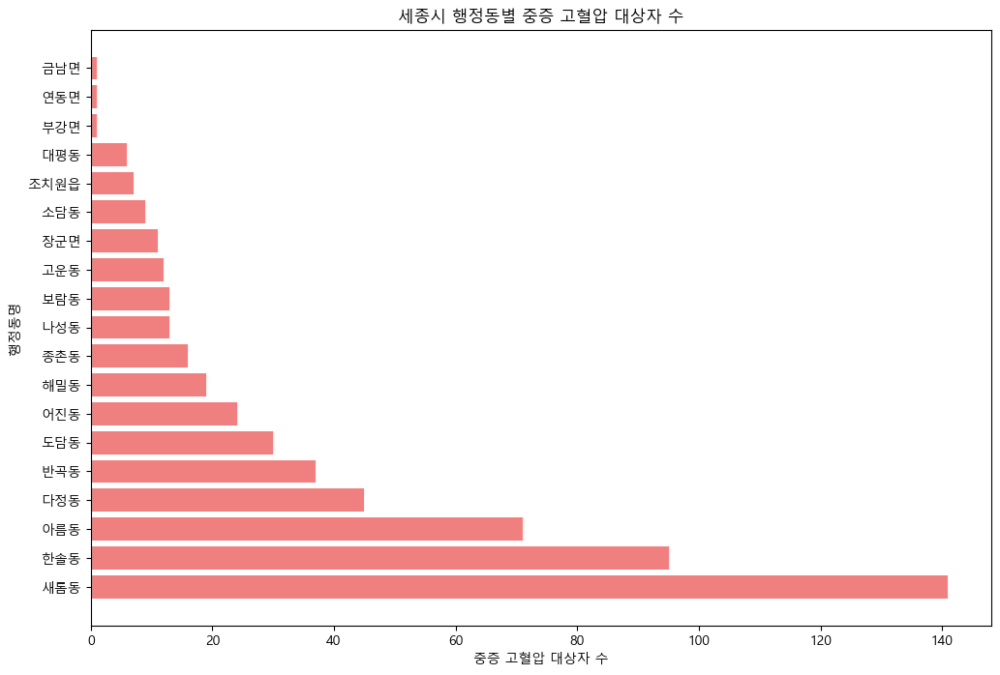

In [1671]:
# 데이터 불러오기
bp_data = pd.read_csv('data/세종특별자치시_혈압 이상치_데이터.csv', encoding='utf-8')

# 중증 고혈압 기준 적용 (수축기 ≥ 160mmHg 또는 이완기 ≥ 100mmHg)
severe = bp_data[(bp_data['수축 혈압'] >= 160) | (bp_data['이완 혈압'] >= 100)]

# 행정동별 중증 고혈압 대상자 수 집계
severe_counts = severe['행정동명'].value_counts().reset_index()
severe_counts.columns = ['행정동명', '중증 고혈압 대상자 수']

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.barh(severe_counts['행정동명'], severe_counts['중증 고혈압 대상자 수'], color='lightcoral')
plt.xlabel('중증 고혈압 대상자 수')
plt.ylabel('행정동명')
plt.title('세종시 행정동별 중증 고혈압 대상자 수')
plt.show()

#### '세종시 혈압 이상치 동별 분포 비율 비교'와 '세종시 행정동별 중증 고혈압 대상자 수' 사이에 차이가 나타나는 이유는 비율과 절대 수치의 차이 때문임
###### 이상치 비율: 특정 행정동에서 발견된 혈압 이상치의 수를 해당 행정동의 전체 인구수로 나누어 계산됩니다. 이 지표는 인구 수와 비교했을 때 얼마나 많은 이상치가 발생했는지를 보여줍니다.
###### 중증 고혈압 대상자 수: 이는 해당 행정동에서 중증 고혈압으로 분류된 사람들의 절대 수치입니다.
###### 따라서, 인구 대비 이상치 비율은 인구가 적은 지역에서 중증 고혈압 대상자의 수가 적더라도 비율적으로는 높게 나타날 수 있습니다. 반대로, 인구가 많은 지역에서는 중증 고혈압 대상자 수가 많아도, 비율적으로는 상대적으로 낮게 나타날 수 있습니다.

## 6-5.  "통합측정자료(공통)" 통해 똑똑건강 이용 실태 현황 분석 수행

In [1676]:
#<시각화 그래프 이미지 개선 시 사용>
import matplotlib.pyplot as plt
#1. 한글폰트 및 이미지처리 패키지 선언
# 맑은 고딕 폰트 설정
plt.rcParams.update({'font.family' : 'Malgun Gothic'})

In [1678]:
## 복사본 생성
adf_check = base_check.copy()

In [1680]:
## 똑똑건강 전체 이용 형태 분석 ##
adf_check.head(5)

,index,구분,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,측정년월
0,0,wh,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,29,2021,Tuesday,평일,20,18,2021-08
1,1,wh,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,53,2021,Tuesday,평일,50,18,2021-08
2,2,wh,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,45,2021,Tuesday,평일,40,19,2021-08
3,3,wh,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,30,2021,Wednesday,평일,30,16,2021-08
4,4,wh,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,40,2021,Thursday,평일,40,15,2021-08


In [1682]:
adf_check['나이'].value_counts()

나이
44    9956
46    9868
45    9776
43    9241
42    8788
      ... 
85       1
86       1
81       1
79       1
8        1
Name: count, Length: 75, dtype: int64

In [1684]:
sns.histplot(data=adf_check, x='나이')

<Axes: xlabel='나이', ylabel='Count'>

In [1686]:
adf_check.describe()

,index,측정일자,사용자 출생년도,나이,측정연도,나이구분
count,179469.000000,179469,179469.000000,179469.000000,179469.000000,179469.000000
mean,37046.433167,2023-06-11 06:57:38.883706880,1977.082098,46.917902,2022.824031,42.460035
min,0.000000,2021-01-11 00:00:00,1938.000000,8.000000,2021.000000,0.000000
25%,13141.000000,2023-04-15 00:00:00,1971.000000,41.000000,2023.000000,40.000000
50%,31686.000000,2023-07-29 00:00:00,1978.000000,46.000000,2023.000000,40.000000
75%,54618.000000,2023-10-20 00:00:00,1983.000000,53.000000,2023.000000,50.000000
max,100278.000000,2023-12-31 00:00:00,2016.000000,86.000000,2023.000000,80.000000
std,27921.587463,NaN,10.712224,10.712224,0.437923,10.853613


In [1688]:
adf_check['나이구분'].value_counts()

나이구분
40    80002
50    39077
30    24707
60    24014
20     8650
10     1582
70     1342
0        76
80       19
Name: count, dtype: int64

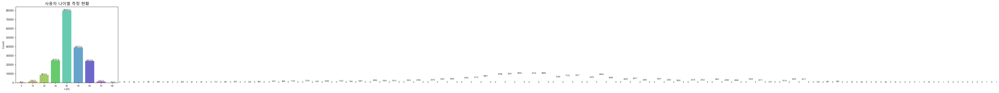

In [1690]:
plt.title('사용자 나이별 측정 현황', fontsize=14)
plt.xlabel('나이', fontsize=10)
plt.xticks(rotation=0, fontsize=8)

#sns.set_palette('hls')
ax = sns.countplot(data = adf_check, x ='나이구분', palette="hls")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 3, height, ha = 'center', size = 7)
    
plt.show()

In [1691]:
adf_check['행정동명'].value_counts()

행정동명
새롬동     25434
한솔동     23345
아름동     19247
다정동     16497
고운동     14004
도담동     13041
소담동      9902
반곡동      8905
종촌동      8277
보람동      8257
나성동      8209
조치원읍     6521
대평동      6231
해밀동      6140
연기면      2383
어진동      2182
전의면       539
장군면       266
연서면        33
금남면        26
부강면        21
연동면         7
전동면         2
Name: count, dtype: int64

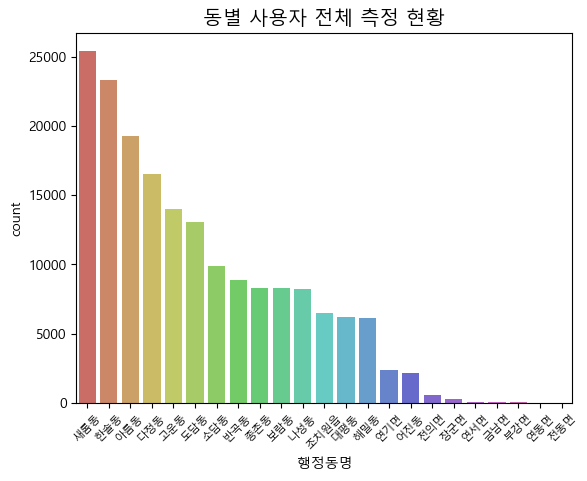

In [1692]:
plt.title('동별 사용자 전체 측정 현황', fontsize=14)
plt.xlabel('행정동명', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='행정동명', palette="hls", order = adf_check['행정동명'].value_counts().index)
plt.show()

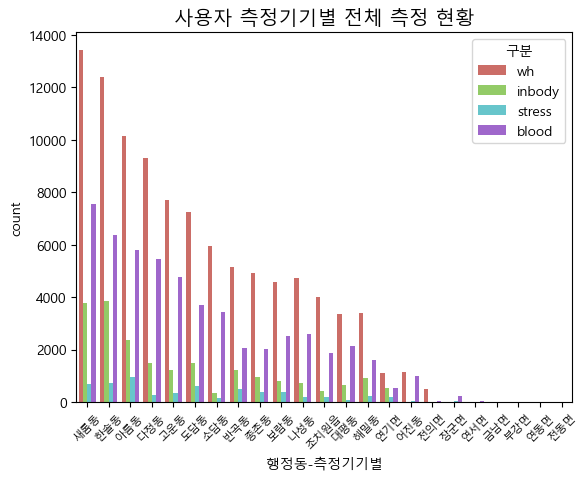

In [1695]:
import matplotlib.pyplot as plt
plt.title('사용자 측정기기별 전체 측정 현황', fontsize=14)
plt.xlabel('행정동-측정기기별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='행정동명', hue='구분', palette="hls", order = adf_check['행정동명'].value_counts().index)
plt.show()

In [1697]:
adf_check['구분'].value_counts()

구분
wh        98983
blood     53771
inbody    20719
stress     5996
Name: count, dtype: int64

In [1698]:
sns.countplot(data = adf_check, x ='구분')

<Axes: xlabel='구분', ylabel='count'>

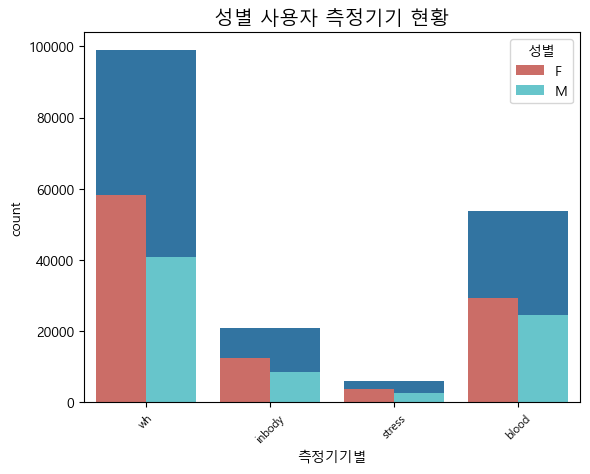

In [1700]:
plt.title('성별 사용자 측정기기 현황', fontsize=14)
plt.xlabel('측정기기별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='구분', hue='성별', palette="hls")
plt.show()

In [1702]:
adf_check['성별'].value_counts()

성별
F    103401
M     76068
Name: count, dtype: int64

In [1704]:
sns.countplot(data = adf_check, x ='성별')

<Axes: xlabel='성별', ylabel='count'>

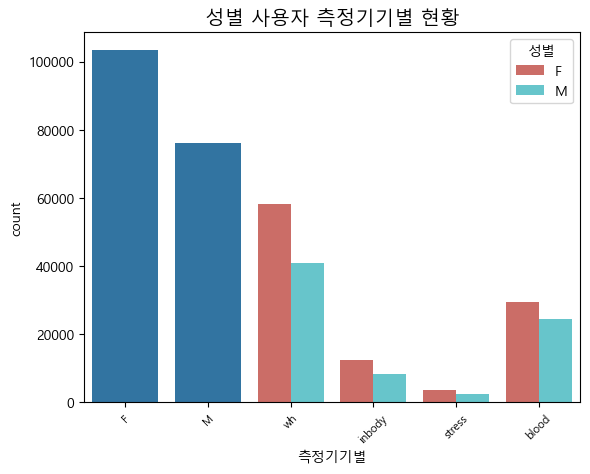

In [1707]:
plt.title('성별 사용자 측정기기별 현황', fontsize=14)
plt.xlabel('측정기기별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='구분', hue='성별', palette="hls")
plt.show()

In [1709]:
adf_check['측정연도'].value_counts()

측정연도
2023    152085
2022     23187
2021      4197
Name: count, dtype: int64

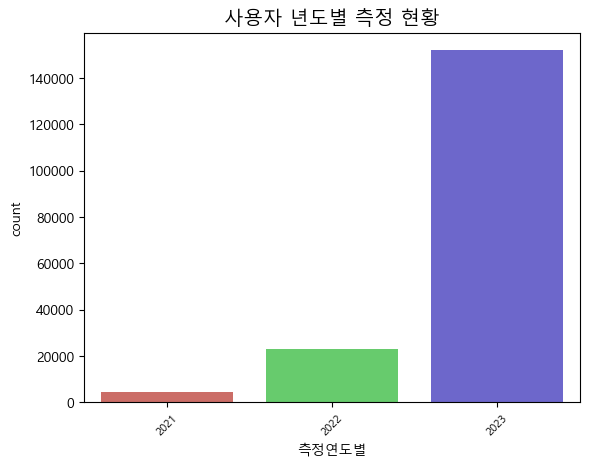

In [1712]:
plt.title('사용자 년도별 측정 현황', fontsize=14)
plt.xlabel('측정연도별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='측정연도',  palette="hls", legend=True)
plt.show()

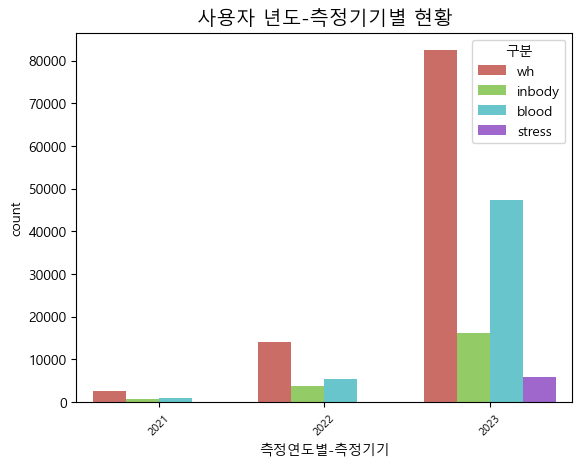

In [1714]:
plt.title('사용자 년도-측정기기별 현황', fontsize=14)
plt.xlabel('측정연도별-측정기기', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='측정연도',  hue='구분',  palette="hls")
plt.show()

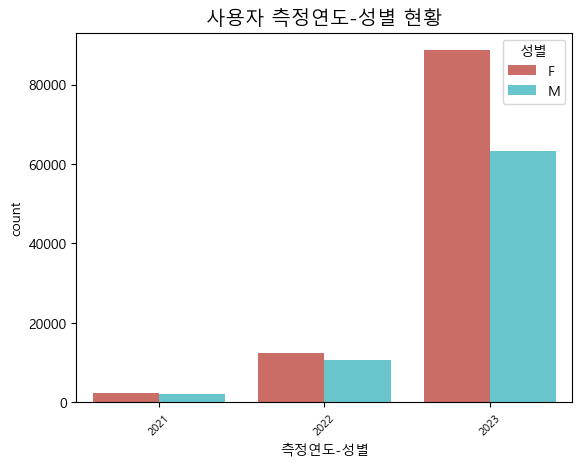

In [1716]:
plt.title('사용자 측정연도-성별 현황', fontsize=14)
plt.xlabel('측정연도-성별', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check, x ='측정연도',  hue='성별',  palette="hls")
plt.show()

In [1718]:
adf_check['측정연도'].value_counts()

측정연도
2023    152085
2022     23187
2021      4197
Name: count, dtype: int64

In [1720]:
adf_check_son_use01 = adf_check.groupby(['사용자 고유번호','성별','행정동명','나이'], as_index = False) \
                               .agg(cnt = ('사용자 고유번호', 'count'))
adf_check_son_use01

,사용자 고유번호,성별,행정동명,나이,cnt
0,0001F5821DFCA630E0635F00A8C0D49B,F,대평동,45,1
1,000236304C64D433E0635F00A8C0FDC5,F,소담동,49,1
2,0003ED848A1ED34DE0635F00A8C0E8C8,M,새롬동,43,11
3,0004090CFCA606CEE0635F00A8C0AC2F,F,새롬동,33,6
4,00040A3CF3370777E0635F00A8C0D17C,M,보람동,33,4
...,...,...,...,...,...
7176,FFF66E994A8FA523E0535F00A8C0A3E5,M,다정동,52,3
7177,FFF69384A4F0A4F7E0535F00A8C09A5E,M,새롬동,39,1
7178,FFF7F642B25F8ECBE0535F00A8C0445F,M,보람동,59,1
7179,FFFA772D46A7113CE0535F00A8C066C9,M,조치원읍,65,1


In [1722]:
adf_check_son_use01.describe()

,나이,cnt
count,7181.000000,7181.000000
mean,42.374321,24.992202
std,11.676333,96.482499
min,8.000000,1.000000
25%,35.000000,1.000000
50%,43.000000,3.000000
75%,49.000000,8.000000
max,86.000000,2265.000000


In [1724]:
adf_check_son_use01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7181 entries, 0 to 7180
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   사용자 고유번호  7181 non-null   object
 1   성별        7181 non-null   object
 2   행정동명      7181 non-null   object
 3   나이        7181 non-null   int64 
 4   cnt       7181 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 280.6+ KB


In [1726]:
sns.countplot(data = adf_check_son_use01, x ='나이')

<Axes: xlabel='나이', ylabel='count'>

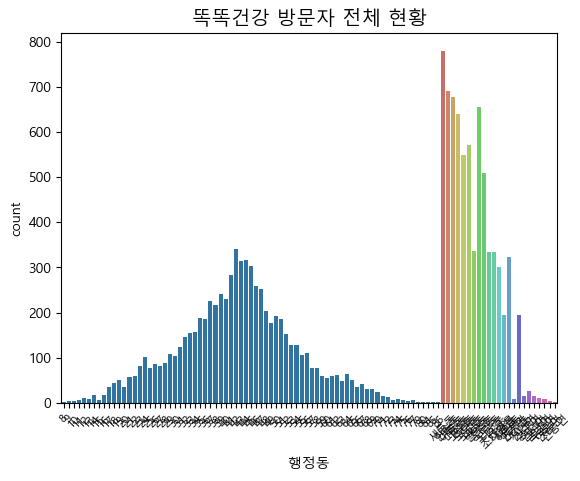

In [1728]:
plt.title('똑똑건강 방문자 전체 현황', fontsize=14)
plt.xlabel('행정동', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check_son_use01, x ='행정동명',  palette="hls", order = adf_check['행정동명'].value_counts().index)
plt.show()

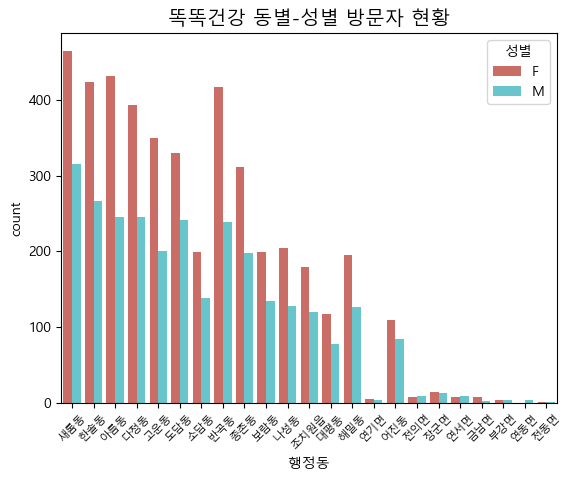

In [1730]:
plt.title('똑똑건강 동별-성별 방문자 현황', fontsize=14)
plt.xlabel('행정동', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.countplot(data = adf_check_son_use01, x ='행정동명', hue='성별',  palette="hls", order = adf_check['행정동명'].value_counts().index)
plt.show()

In [1732]:
## 이용자 행정동명별 집계 count
adf_check_son_use02 = adf_check_son_use01.groupby(['행정동명'], as_index = False) \
                               .agg(cnt = ('사용자 고유번호', 'count'))
adf_check_son_use02 

,행정동명,cnt
0,고운동,550
1,금남면,10
2,나성동,333
3,다정동,639
4,대평동,195
5,도담동,572
6,반곡동,656
7,보람동,334
8,부강면,8
9,새롬동,780


In [1734]:
## Join으로 세종인구 와 "adf_check_son_use01" 합치기
adf_check_son_use03 = adf_check_son_use02.merge(df_population, how='left', on='행정동명')
adf_check_son_use03.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   행정동명       23 non-null     object 
 1   cnt        23 non-null     int64  
 2   구분         23 non-null     object 
 3   전체인구       23 non-null     int64  
 4   지역별전체인구비율  23 non-null     float64
 5   내국인계       23 non-null     int64  
 6   지역별내국인비율   23 non-null     float64
 7   전월대비증감     23 non-null     int64  
 8   남자         23 non-null     int64  
 9   남자구성비      23 non-null     float64
 10  여자         23 non-null     int64  
 11  여자구성비      23 non-null     float64
 12  외국인계       23 non-null     int64  
 13  지역별외국인비율   23 non-null     float64
 14  전월증감       23 non-null     int64  
 15  외국인남자      23 non-null     int64  
 16  외국인여자      23 non-null     int64  
 17  세대수        23 non-null     int64  
 18  전월대비증감.1   23 non-null     int64  
 19  세대당인구      23 non-null     float64
 20  비고         4

In [1736]:
# 똑똑건강 이융자 - 동별 퍼센트
adf_check_son_use03['똑똑비율'] = adf_check_son_use03['cnt'] / adf_check_son_use03['전체인구'] * 100
adf_check_son_use03[['행정동명', 'cnt', '전체인구', '똑똑비율']]

,행정동명,cnt,전체인구,똑똑비율
0,고운동,550,35964,1.529307
1,금남면,10,8581,0.116537
2,나성동,333,13176,2.527322
3,다정동,639,28312,2.256994
4,대평동,195,11293,1.726733
5,도담동,572,24976,2.290199
6,반곡동,656,28923,2.268091
7,보람동,334,18924,1.764955
8,부강면,8,5755,0.139010
9,새롬동,780,26479,2.945731


In [1738]:
sum(adf_check_son_use03['cnt'])/ sum(adf_check_son_use03['전체인구'])*100

1.830608197331457

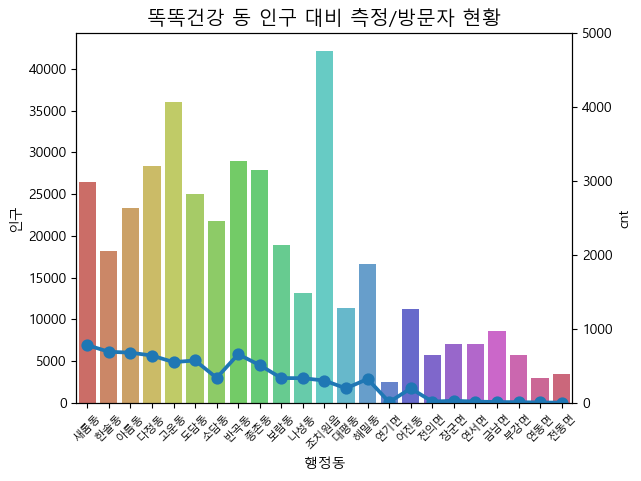

In [1740]:
plt.title('똑똑건강 동 인구 대비 측정/방문자 현황', fontsize=14)
plt.xlabel('행정동', fontsize=10)
plt.ylabel('인구', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')

ax = sns.barplot(data = adf_check_son_use03, x ='행정동명',  y = '전체인구',  palette="hls", order = adf_check['행정동명'].value_counts().index)

ax2 = ax.twinx()
sns.pointplot(data = adf_check_son_use03, x ='행정동명',  y = 'cnt',   order = adf_check['행정동명'].value_counts().index, ax=ax2).set(ylim=[0,5000])

plt.show()


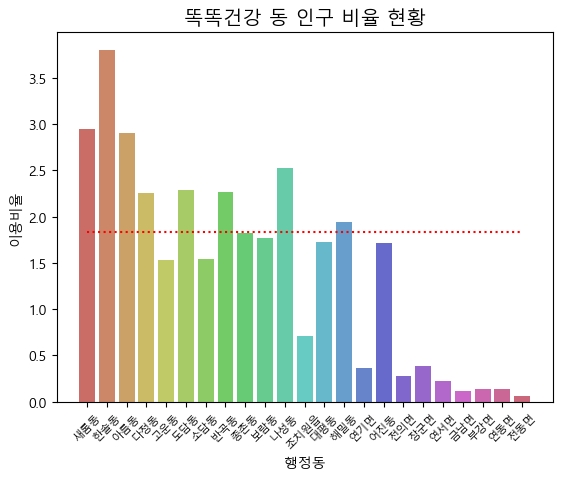

In [1742]:
plt.title('똑똑건강 동 인구 비율 현황', fontsize=14)
plt.xlabel('행정동', fontsize=10)
plt.ylabel('이용비율', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
#sns.set_palette('hls')
sns.barplot(data = adf_check_son_use03, x ='행정동명',  y = '똑똑비율',  palette="hls", order = adf_check['행정동명'].value_counts().index)

#plt.hlines(y=1.846286394850873, xmin=0, xmax=len(adf_check_son_use03)+1, color='red', linestyle='dotted')
plt.hlines(y=sum(adf_check_son_use03['cnt'])/ sum(adf_check_son_use03['전체인구'])*100, xmin=0, xmax=len(adf_check_son_use03)-1, color='red', linestyle='dotted')
plt.show()

In [1744]:
## 이용자 행정동명별 집계 count
adf_check_son_use04 = adf_check_son_use01.groupby(['나이'], as_index = False) \
                               .agg(cnt = ('사용자 고유번호', 'count'))
adf_check_son_use04['나이구분'] = (adf_check_son_use04['나이']//10)*10
adf_check_son_use04

,나이,cnt,나이구분
0,8,1,0
1,9,4,0
2,10,4,10
3,11,7,10
4,12,11,10
...,...,...,...
70,79,1,70
71,80,2,80
72,81,1,80
73,85,1,80


In [1747]:
## datafram cvs 저장 
## 참고 사이트 : https://velog.io/@holi/Pandas-Write-Files

adf_check

,index,구분,사용자 고유번호,측정일자,측정시간,성별,사용자 출생년도,행정동명,나이,측정연도,측정요일,휴일구분,나이구분,방문시간,측정년월
0,0,wh,CA4C04225E405C30E0535F00A8C03ECD,2021-08-24,18:47,F,1995,다정동,29,2021,Tuesday,평일,20,18,2021-08
1,1,wh,CA4C255510F09F7CE0535F00A8C009F2,2021-08-24,18:56,F,1971,해밀동,53,2021,Tuesday,평일,50,18,2021-08
2,2,wh,CA4CD6CDEB87EAF5E0535F00A8C081B0,2021-08-24,19:45,M,1979,새롬동,45,2021,Tuesday,평일,40,19,2021-08
3,3,wh,CA5E614540CE0769E0535F00A8C08588,2021-08-25,16:41,M,1994,나성동,30,2021,Wednesday,평일,30,16,2021-08
4,4,wh,CA71A06B1801D4FBE0535F00A8C05802,2021-08-26,15:39,M,1984,반곡동,40,2021,Thursday,평일,40,15,2021-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179673,53773,blood,CF28FDE31F340DF7E0535F00A8C0BFE5,2023-12-31,23:39,M,1979,새롬동,45,2023,Sunday,주말,40,23,2023-12
179674,53774,blood,D97915F0A035D41DE0535F00A8C06243,2023-12-31,23:42,F,1982,다정동,42,2023,Sunday,주말,40,23,2023-12
179675,53775,blood,ED2C36A4C579AADFE0535F00A8C071AE,2023-12-31,23:49,F,1976,새롬동,48,2023,Sunday,주말,40,23,2023-12
179676,53776,blood,EC60BDA0AB32BDE8E0535F00A8C0CB28,2023-12-31,23:50,F,1982,소담동,42,2023,Sunday,주말,40,23,2023-12


In [1750]:
## 이용자  집계 count
adf_check_son_total01 = adf_check.groupby(['측정년월','행정동명','성별','나이구분'], as_index = False) \
                               .agg(측정건수 = ('사용자 고유번호', 'count'))
adf_check_son_total01

,측정년월,행정동명,성별,나이구분,측정건수
0,2021-01,보람동,F,20,1
1,2021-01,아름동,M,70,1
2,2021-01,조치원읍,M,60,1
3,2021-02,고운동,M,40,1
4,2021-02,도담동,F,20,1
...,...,...,...,...,...
3976,2023-12,해밀동,F,60,24
3977,2023-12,해밀동,M,30,46
3978,2023-12,해밀동,M,40,57
3979,2023-12,해밀동,M,50,133


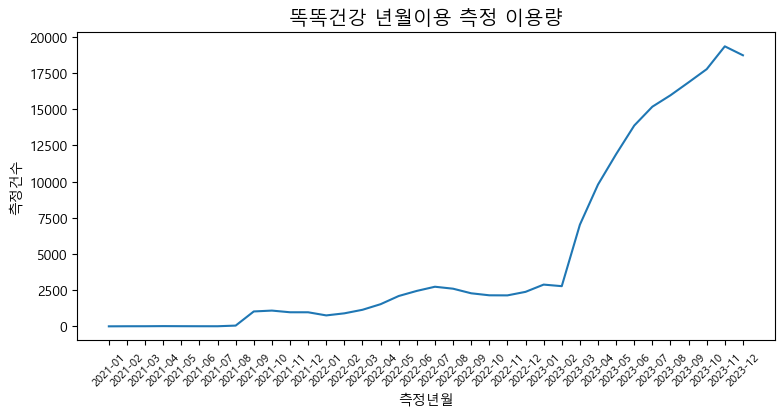

In [1752]:
## 이용자 측정년월별 측정 건수 집계 
adf_check_son_total02 = adf_check_son_total01.groupby(['측정년월'], as_index = False) \
                                             .agg(측정건수 = ('측정건수', 'sum'))
img=sns.lineplot(data = adf_check_son_total02, x = '측정년월', y = '측정건수')
plt.gcf().set_size_inches(9, 4)
plt.title('똑똑건강 년월이용 측정 이용량', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

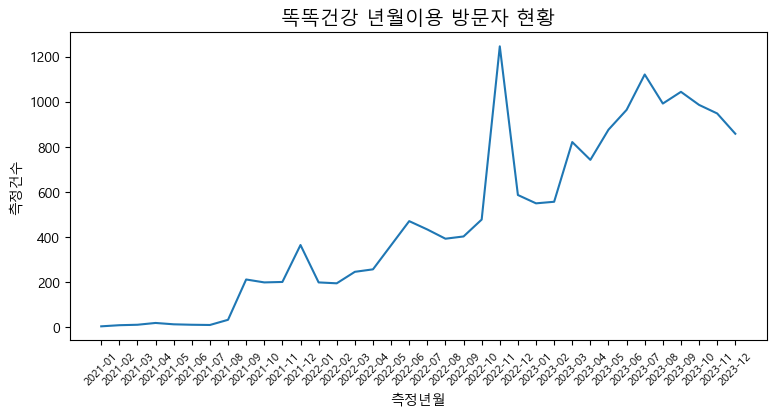

In [1754]:
## 이용자  집계 count
adf_check_son_total03 = adf_check.groupby(['사용자 고유번호','측정년월'], as_index = False) \
                                 .agg(측정건수 = ('사용자 고유번호', 'count'))
adf_check_son_total03

adf_check_son_total04 = adf_check_son_total03.groupby(['측정년월'], as_index = False) \
                                             .agg(측정건수 = ('측정건수', 'count'))
adf_check_son_total04

img=sns.lineplot(data = adf_check_son_total04, x = '측정년월', y = '측정건수')
plt.gcf().set_size_inches(9, 4)
plt.title('똑똑건강 년월이용 방문자 현황', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

In [1756]:
## 이용자  집계 count
adf_check_son_total10 = adf_check.groupby(['사용자 고유번호','측정년월', '행정동명'], as_index = False) \
                                 .agg(측정건수 = ('사용자 고유번호', 'count'))
adf_check_son_total10

adf_check_son_total04 = adf_check_son_total10.groupby(['측정년월','행정동명'], as_index = False) \
                                             .agg(측정건수 = ('측정건수', 'count'))
adf_check_son_total04

adf_check_son_total04.query('행정동명 == "새롬동"')[['측정년월','측정건수']].rename(columns={'측정건수':'새롬동'})

temp_son = adf_check_son_total10.groupby(['측정년월'], as_index = False) \
                                .agg(측정건수 = ('측정건수', 'sum')).rename(columns={'측정건수':'전체건수'})
temp_son



,측정년월,전체건수
0,2021-01,3
1,2021-02,9
2,2021-03,10
3,2021-04,18
4,2021-05,13
5,2021-06,10
6,2021-07,9
7,2021-08,54
8,2021-09,1031
9,2021-10,1091


In [1758]:
for i in adf_check_son_total04['행정동명'].unique().tolist():    
    str = '행정동명 == "' + i + '"'

    tmp=adf_check_son_total04.query(str)[['측정년월','측정건수']].rename(columns={'측정건수': i})    
    temp_son=temp_son.merge(tmp, how='left', on = '측정년월')
    temp_son.info()
    
#temp_son.info()


temp_son01 = temp_son.fillna(0)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   측정년월    36 non-null     object 
 1   전체건수    36 non-null     int64  
 2   보람동     33 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 996.0+ bytes
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   측정년월    36 non-null     object 
 1   전체건수    36 non-null     int64  
 2   보람동     33 non-null     float64
 3   아름동     34 non-null     float64
dtypes: float64(2), int64(1), object(1)
memory usage: 1.3+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   측정년월    36 non-null     object 
 1   전체건수    36 non-null     int64  
 2   보람동  

In [1760]:
temp_son01

,측정년월,전체건수,보람동,아름동,조치원읍,고운동,도담동,반곡동,새롬동,전의면,소담동,해밀동,나성동,다정동,종촌동,한솔동,대평동,어진동,연서면,장군면,부강면,연기면,금남면,전동면,연동면
0,2021-01,3,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2021-02,9,1.0,0.0,0.0,1.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2021-03,10,2.0,1.0,0.0,3.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2021-04,18,0.0,3.0,1.0,0.0,2.0,1.0,2.0,0.0,2.0,2.0,1.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2021-05,13,2.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2021-06,10,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2021-07,9,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2021-08,54,1.0,7.0,1.0,1.0,1.0,1.0,6.0,0.0,0.0,1.0,1.0,2.0,2.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,2021-09,1031,4.0,16.0,13.0,16.0,4.0,18.0,44.0,1.0,9.0,14.0,7.0,19.0,12.0,26.0,6.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
9,2021-10,1091,2.0,9.0,5.0,12.0,6.0,16.0,40.0,1.0,11.0,10.0,5.0,24.0,10.0,33.0,8.0,2.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0


In [1762]:
temp_son.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   측정년월    36 non-null     object 
 1   전체건수    36 non-null     int64  
 2   보람동     33 non-null     float64
 3   아름동     34 non-null     float64
 4   조치원읍    32 non-null     float64
 5   고운동     33 non-null     float64
 6   도담동     32 non-null     float64
 7   반곡동     31 non-null     float64
 8   새롬동     34 non-null     float64
 9   전의면     28 non-null     float64
 10  소담동     33 non-null     float64
 11  해밀동     33 non-null     float64
 12  나성동     31 non-null     float64
 13  다정동     33 non-null     float64
 14  종촌동     31 non-null     float64
 15  한솔동     32 non-null     float64
 16  대평동     30 non-null     float64
 17  어진동     28 non-null     float64
 18  연서면     13 non-null     float64
 19  장군면     23 non-null     float64
 20  부강면     9 non-null      float64
 21  연기면     26 non-null     float64
 22  금남면 

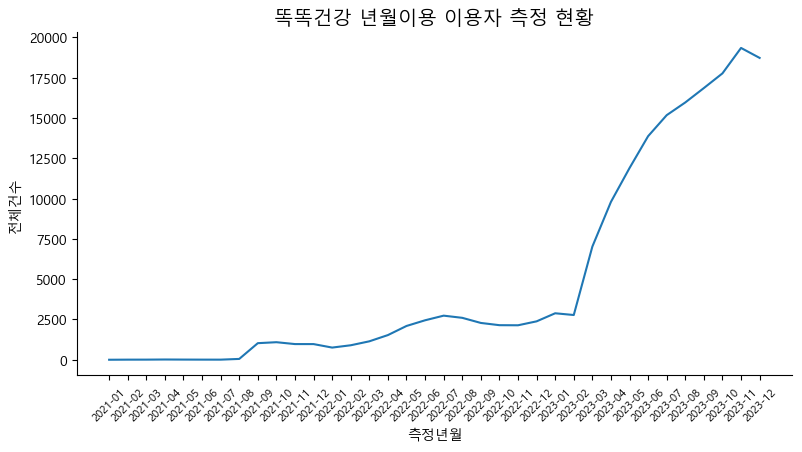

In [1764]:
#stemp = temp_son01.transpose()
#stemp

sns.relplot(x="측정년월", y="전체건수", kind="line", data=temp_son)

#img=sns.lineplot(data = temp_son01, x = '측정년월', y = '아름동', hue='대평동')
plt.gcf().set_size_inches(9, 4)
plt.title('똑똑건강 년월이용 이용자 측정 현황', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

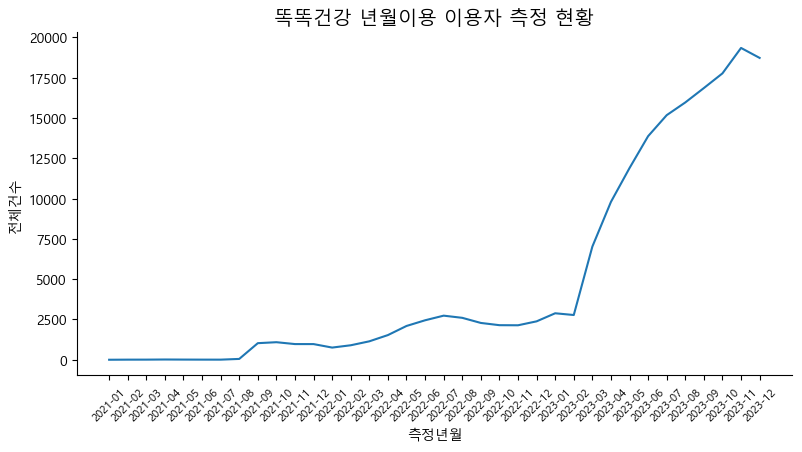

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

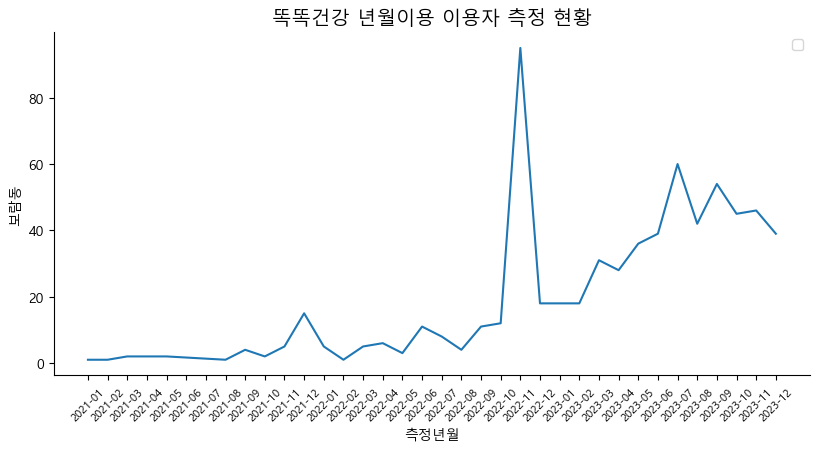

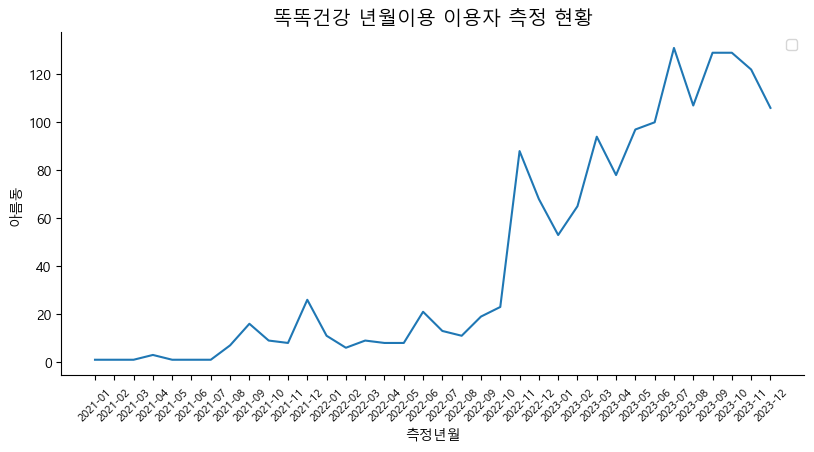

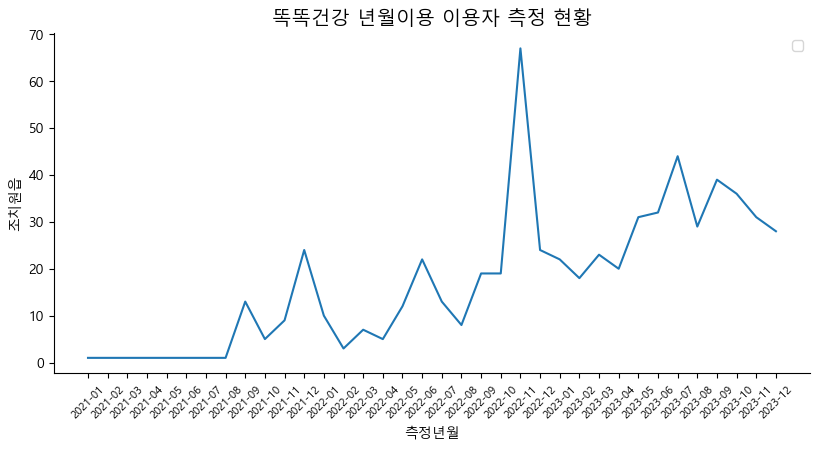

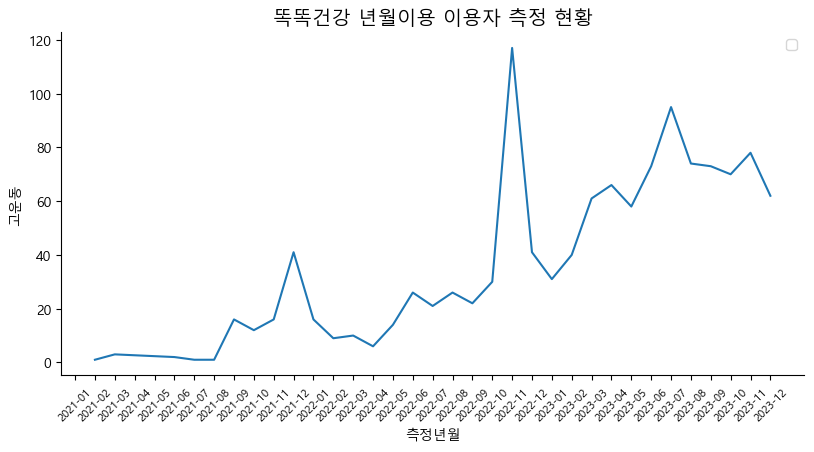

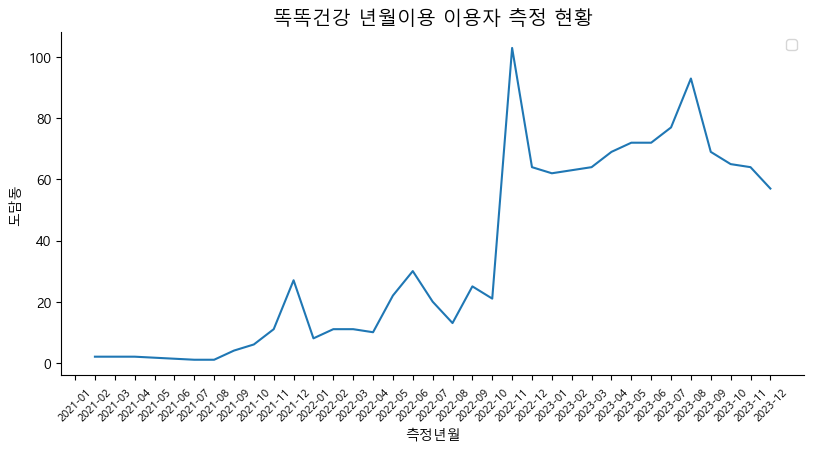

...

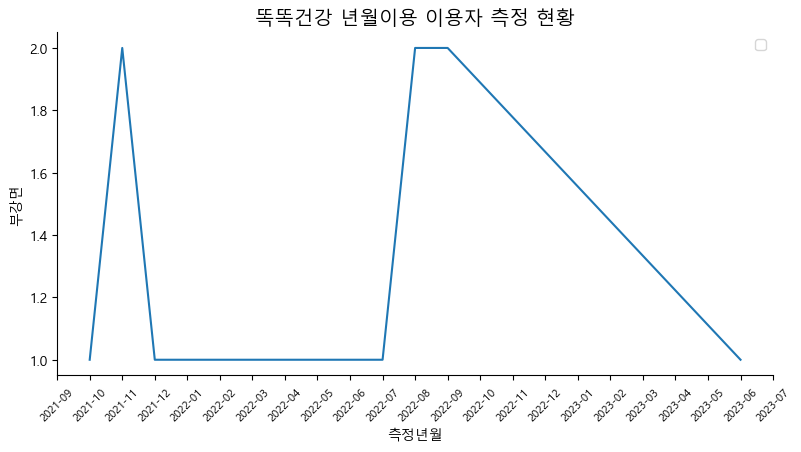

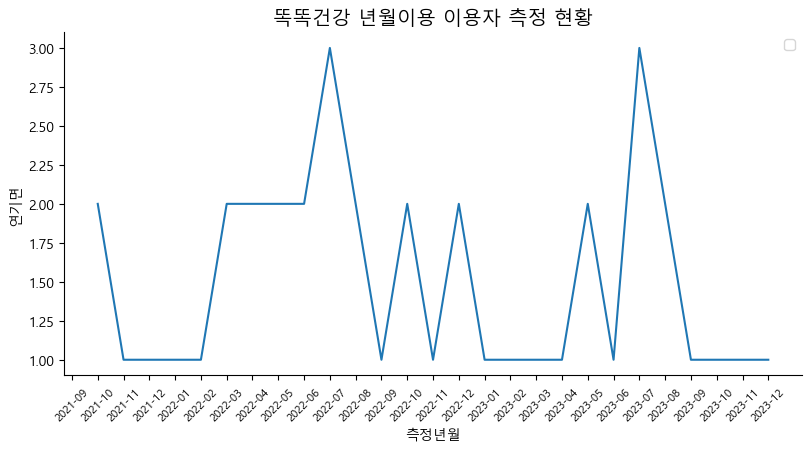

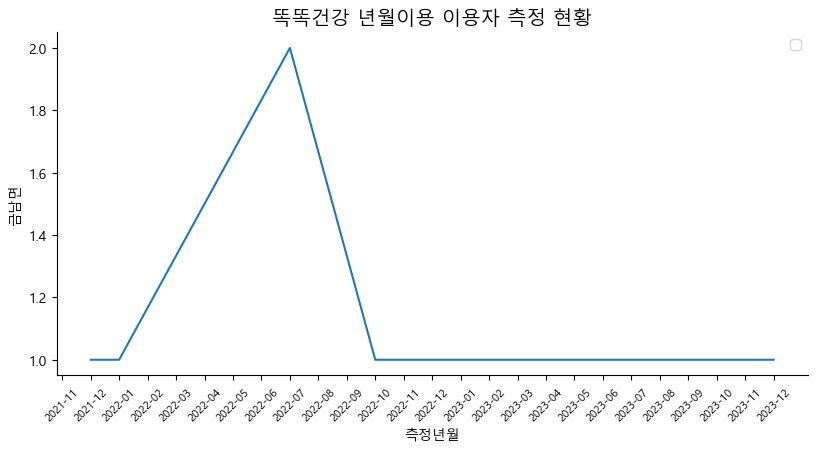

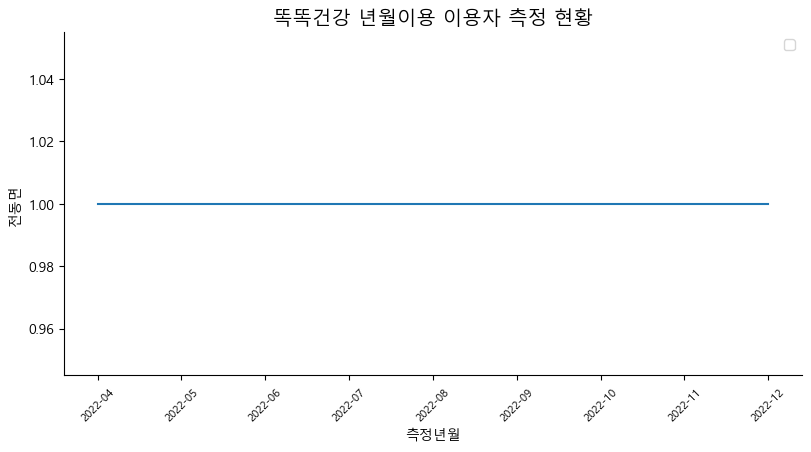

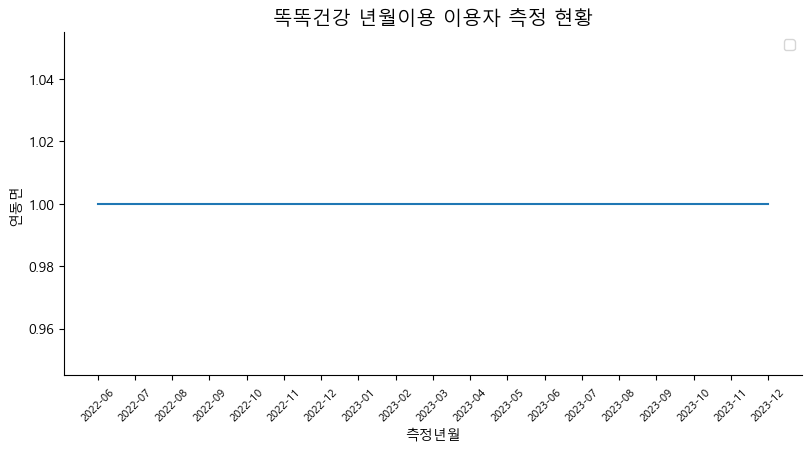

In [1766]:
sns.relplot(x="측정년월", y="전체건수", kind="line", data=temp_son)
plt.gcf().set_size_inches(9, 4)
plt.title('똑똑건강 년월이용 이용자 측정 현황', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

for i in adf_check_son_total04['행정동명'].unique().tolist(): 
     sns.relplot(x="측정년월", y=i, kind="line", data=temp_son)
     plt.gcf().set_size_inches(9, 4)
     plt.title('똑똑건강 년월이용 이용자 측정 현황', fontsize=14)
     plt.xlabel('측정년월', fontsize=10)
     plt.xticks(rotation=45, fontsize=8)
     plt.legend()
plt.show()

In [1767]:
temp_son_xx = adf_check_son_total10.groupby(['측정년월'], as_index = False) \
                                .agg(측정건수 = ('측정건수', 'sum'))
temp_son_xx['행정동명'] = "전체건수"
temp_son_xx

,측정년월,측정건수,행정동명
0,2021-01,3,전체건수
1,2021-02,9,전체건수
2,2021-03,10,전체건수
3,2021-04,18,전체건수
4,2021-05,13,전체건수
5,2021-06,10,전체건수
6,2021-07,9,전체건수
7,2021-08,54,전체건수
8,2021-09,1031,전체건수
9,2021-10,1091,전체건수


In [1768]:
for i in adf_check_son_total04['행정동명'].unique().tolist():    
    str = '행정동명 == "' + i + '"'
    tmp=adf_check_son_total04.query(str)[['측정년월','측정건수']]
    tmp['행정동명'] = i
    temp_son_xx=pd.concat([temp_son_xx,tmp]) 
    
temp_son_xx.info()

temp_son_xx = temp_son_xx.fillna(0)


<class 'pandas.core.frame.DataFrame'>
Index: 634 entries, 0 to 591
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   측정년월    634 non-null    object
 1   측정건수    634 non-null    int64 
 2   행정동명    634 non-null    object
dtypes: int64(1), object(2)
memory usage: 19.8+ KB


In [1769]:
temp_son_xx

,측정년월,측정건수,행정동명
0,2021-01,3,전체건수
1,2021-02,9,전체건수
2,2021-03,10,전체건수
3,2021-04,18,전체건수
4,2021-05,13,전체건수
...,...,...,...
359,2022-12,1,전동면
243,2022-06,1,연동면
413,2023-03,1,연동면
475,2023-06,1,연동면


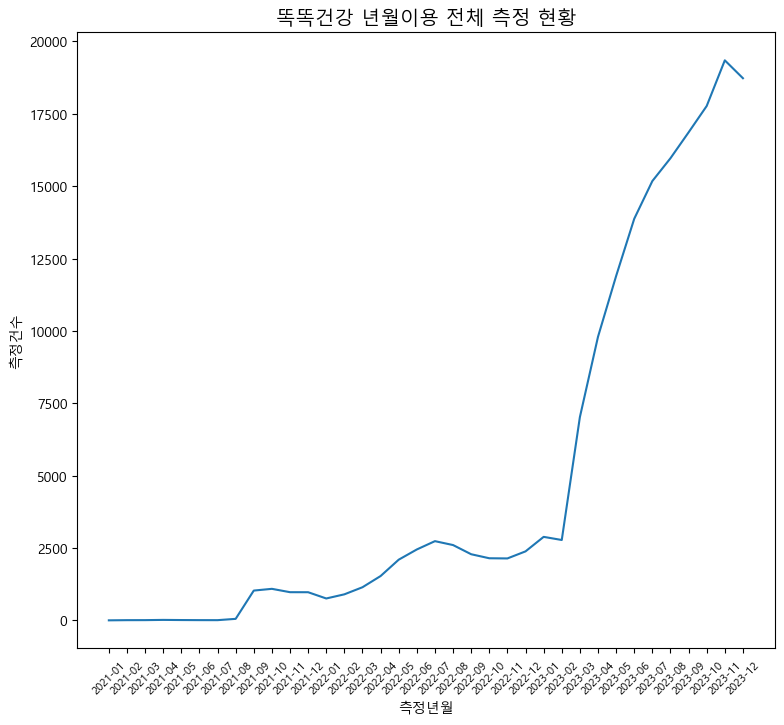

In [1770]:
img=sns.lineplot(data = temp_son_xx.query('행정동명 == "전체건수"'), x = '측정년월', y = '측정건수')
plt.gcf().set_size_inches(9, 8)
plt.title('똑똑건강 년월이용 전체 측정 현황', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

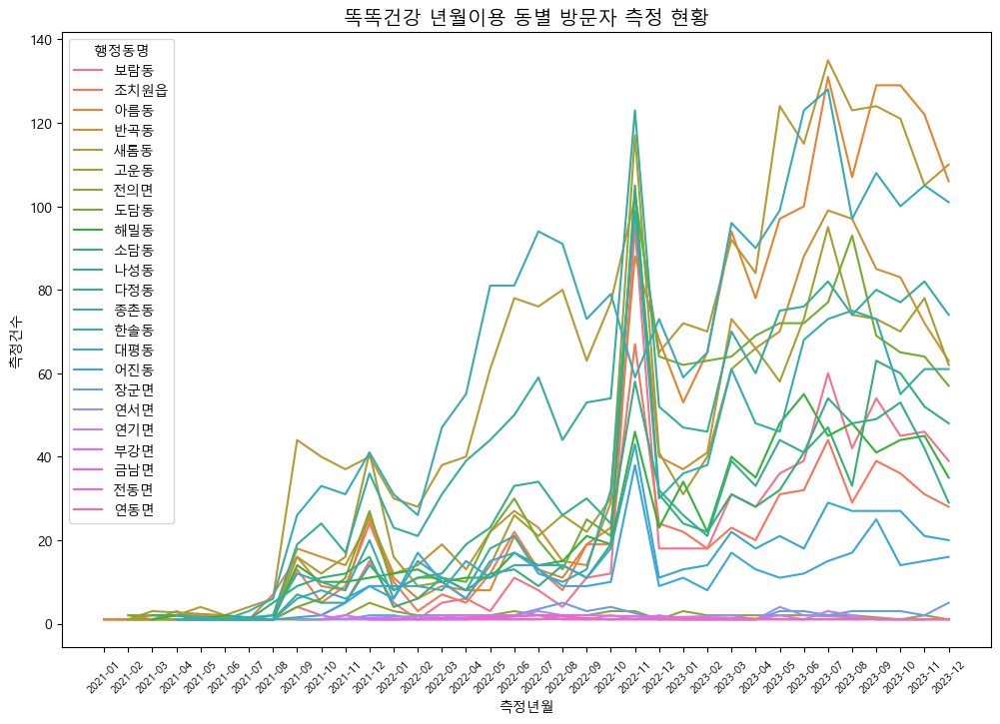

In [1771]:
img=sns.lineplot(data = temp_son_xx.query('행정동명 != "전체건수"').sort_values(by='측정년월'), x = '측정년월', y = '측정건수', hue='행정동명')
plt.gcf().set_size_inches(12, 8)
plt.title('똑똑건강 년월이용 동별 방문자 측정 현황', fontsize=14)
plt.xlabel('측정년월', fontsize=10)
plt.xticks(rotation=45, fontsize=8)
plt.show()

---

----

## 7. 통합 지도 시각화 

In [1775]:
## PublicDataReader는 공공 데이터를 자동으로 조회할 수 있는 파이썬 라이브러리 설치
!pip install PublicDataReader
!pip install folium

## 파이썬에서 주소로 위도경도 갖고 오는 라이브러리  
!pip install geopy

### 6-1. 지도 시각화 사용 라이브러리 선언

In [1777]:
# PublicDataReader 임포트하기
import PublicDataReader as pdr

## 지도 시각화 필수 라이브러리 적 
import folium
from folium.features import DivIcon
from folium.plugins import MarkerCluster

## JSON 경계파일 지도 위에 매핑 사용 / java 설치 필수
import json

## 위도/경도 조회하는 라이브러리 적용
from geopy.geocoders import Nominatim

### 6-2. 지도 시각화 dataframe 정의

In [1779]:
### 6-3. 병원/약국 우편번호 통해 행정동명 컬럼 추가 작업 

In [1780]:
## 세종시 병원 / 건강 내역 추출 수행
#df_hospital.info()
adf_hospital = df_hospital.query('시도코드명 == "세종시"')
adf_hospital_tmp = adf_hospital.dropna(subset=['x좌표','y좌표'])
adf_hospital_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 399 entries, 354 to 74509
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   암호화요양기호     399 non-null    object        
 1   요양기관명       399 non-null    object        
 2   종별코드        399 non-null    int64         
 3   종별코드명       399 non-null    object        
 4   시도코드        399 non-null    int64         
 5   시도코드명       399 non-null    object        
 6   시군구코드       399 non-null    int64         
 7   시군구코드명      399 non-null    object        
 8   읍면동         98 non-null     object        
 9   우편번호        399 non-null    int64         
 10  주소          399 non-null    object        
 11  전화번호        399 non-null    object        
 12  병원URL       25 non-null     object        
 13  개설일자        399 non-null    datetime64[ns]
 14  총의사수        399 non-null    int64         
 15  의과일반의 인원수   399 non-null    int64         
 16  의과인턴 인원수    399 non-null   

In [1781]:
adf_pharmacy = df_pharmacy.query('시도코드명 == "세종시"')
adf_pharmacy_tmp = adf_pharmacy.dropna(subset=['x좌표','y좌표'])
adf_pharmacy_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145 entries, 7 to 22788
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   암호화요양기호  145 non-null    object        
 1   요양기관명    145 non-null    object        
 2   종별코드     145 non-null    int64         
 3   종별코드명    145 non-null    object        
 4   시도코드     145 non-null    int64         
 5   시도코드명    145 non-null    object        
 6   시군구코드    145 non-null    int64         
 7   시군구코드명   145 non-null    object        
 8   읍면동      45 non-null     object        
 9   우편번호     145 non-null    float64       
 10  주소       145 non-null    object        
 11  전화번호     144 non-null    object        
 12  개설일자     145 non-null    datetime64[ns]
 13  x좌표      145 non-null    float64       
 14  y좌표      145 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(3), object(8)
memory usage: 18.1+ KB


In [1782]:
## 우편번호에서 행정동을 병원/약국 우편번호와 merge 수행하고자함 
tmp_zip01 = df_zip.groupby(['우편번호', '행정동명'] , as_index = False).agg(건수 = ('우편번호', 'count'))[['우편번호', '행정동명']]
adf_hospital_geo = adf_hospital_tmp.merge(tmp_zip01, how='left', on = '우편번호')
adf_pharmacy_geo = adf_pharmacy_tmp.merge(tmp_zip01, how='left', on = '우편번호')

### 6-4. 지도 시각화 경계면 파일 선언 (세종)

In [1784]:
## SIG.geojson파일은 시군구 경계 파일
geo = json.load(open('data/Local_HangJeongDong/hangjeongdong_세종특별자치시.geojson',encoding='UTF-8'))
geo

{'type': 'FeatureCollection',
 'name': 'temp',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'OBJECTID': 1143,
    'adm_nm': '세종특별자치시 세종시 조치원읍',
    'adm_cd': '2901011',
    'adm_cd2': '3611025000',
    'sgg': '36110',
    'sido': '36',
    'sidonm': '세종특별자치시',
    'sggnm': '세종시'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[127.30161101266826, 36.582124381608836],
       [127.30140820586777, 36.5779160358433],
       [127.29514488947336, 36.57854211096787],
       [127.29199030972909, 36.57942328129041],
       [127.29130066509202, 36.57926335331273],
       [127.29066505290272, 36.57912322584787],
       [127.29055863982121, 36.57913508304297],
       [127.29016530813054, 36.579178927491476],
       [127.28945611664575, 36.57954461485136],
       [127.28932911493877, 36.57964767230231],
       [127.28912725517226, 36.580182444255726],
       [127.28910214371724, 36.5802783911

### 6-5. 배경지도 생성

In [1791]:
## 배경지도 생성 (세좉특별시 위도/경도 좌표 : 36.5040736, 127.2494855)  
## 시도 좌표 구하는 법 : https://kp.maptons.com/3386712 , http://map.esran.com/
## 조치원으로 바꿈 위치 중앙 정렬을 위해 

map = folium.Map(location =[36.565959683567556, 127.27444515225777], zoom_start = 11, tiles = 'cartodbpositron')

In [1792]:
# 마커 클러스터 생성하기 (병원)
marker = MarkerCluster().add_to(map)

for idx, row in adf_hospital_geo.iterrows():
    name = row['요양기관명']
    gu1  = row['종별코드명']
    gu2  = row['전화번호']
    gu3  = row['우편번호']
    gu4  = row['주소']
    gu5  = row['개설일자']
    gu6  = row['총의사수']
    gu7  = row['병원URL']

    popup_html=f'''
                          <div style = "font-size: 7pt; font-weight: bold; color:white;
                                     background: dodgerblue; padding: 5px; border-radius: 5px;
                                     text-align: center;">
                                     주소 : ({gu3})  {gu4} <br> 
                                     개설일자 ; {gu5} / 총의사수 : {gu6}
                                     URL : {gu7}
                          </div>           
                            '''
    
    folium.Marker( [row['y좌표'], row['x좌표']],
                   icon=folium.Icon(color="red"),                   
                   tooltip=f'''
                          <div style = "font-size: 7pt; font-weight: bold; color:white;
                                     background: lightskyblue; padding: 1px; border-radius: 1px;
                                     text-align: center;">
                                     {gu1} - {name} <br> 
                                     전화번호 : {gu2}
                          </div>           
                            ''', 
                   popup = folium.Popup(popup_html, min_width=200, max_width=300)
                   ).add_to(marker)
map


In [1794]:
# 마커 클러스터 생성하기 (약국)
for idx, row in adf_pharmacy_geo.iterrows():
    name = row['요양기관명']
    gu1  = row['종별코드명']
    gu2  = row['전화번호']
    gu3  = row['우편번호']
    gu4  = row['주소']
    gu5  = row['개설일자']

    
    folium.Marker( [row['y좌표'], row['x좌표']],
                   icon=folium.Icon(color="blue"),                   
                   tooltip=f'''
                          <div style = "font-size: 7pt; font-weight: bold; color:white;
                                     background: navy; padding: 5px; border-radius: 5px;
                                     text-align: center;">
                                     {gu1} - {name} <br> 
                                     전화번호 : {gu2}
                          </div>           
                            ''', 
                   popup=f'''
                          <div style = "font-size: 7pt; font-weight: bold; color:white;
                                     background: navy; padding: 5px; border-radius: 5px;
                                     text-align: center;">
                                     주소 : ({gu3})  {gu4} <br> 
                                     개설일자 ; {gu5} 
                          </div>           
                            '''
                  ).add_to(marker)
map



In [1795]:
## 행정동 좌표 구하기 -- 오래 걸림  

In [1796]:
## 행정동과 관할 법정동의 연결내용 조회
df_totalcode = pdr.code_hdong_bdong()
df_totalcode

df_tmp01 = df_totalcode.query('읍면동명 == 동리명 & 시도명 == "세종특별자치시" ') 
df_tmp01["행정동명"] = df_tmp01["읍면동명"]
df_tmp01

adf_son  = adf_check_son_use03[['행정동명', 'cnt', '전체인구', '똑똑비율']]
adf_son.info()

## 분석된 행정동과 읍면동명으로 DataFrame합치기 할것 
adf_son_geo = adf_son.merge(df_tmp01[["행정동명", "행정동코드"]], how='left', on = '행정동명')
adf_son_geo.info()

출처: 행정기관(행정동) 및 관할구역(법정동) 변경내역(2024.8.1. 시행)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   행정동명    23 non-null     object 
 1   cnt     23 non-null     int64  
 2   전체인구    23 non-null     int64  
 3   똑똑비율    23 non-null     float64
dtypes: float64(1), int64(2), object(1)
memory usage: 868.0+ bytes
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   행정동명    23 non-null     object 
 1   cnt     23 non-null     int64  
 2   전체인구    23 non-null     int64  
 3   똑똑비율    23 non-null     float64
 4   행정동코드   23 non-null     object 
dtypes: float64(1), int64(2), object(2)
memory usage: 1.0+ KB


In [1797]:
## 배경지도 파라메터 설정 
folium.Choropleth(geo_data = geo,                     ## 배경지도에 json파일 매핑
                  data =adf_son_geo,                  ## 분석된 DataFrame에 행정동 코드 매핑한 자료 
                  columns =("행정동코드","똑똑비율"),
                  legend_name ="똑똑건강 읍면동 인구 대비 사용자 측정비율",
                  key_on="feature.properties.adm_cd2")\
      .add_to(map)   ## 배경지도에 매핑
map

In [1798]:
## 주소로 위도경도 갖고 오는 라이브러리  
!pip install geopy

In [1799]:
from geopy.geocoders import Nominatim

def geocoding(address):
    geolocoder = Nominatim(user_agent = 'South Korea', timeout=None)
    geo = geolocoder.geocode(address)
    crd = {"lat": geo.latitude, "lng": geo.longitude}

    return crd

In [1800]:
crd = geocoding("새롬동")
print(crd['lat'])
print(crd['lng'])

36.4856031
127.2518665


In [1801]:
## 행정동 좌표 구하기 
# 외부 접속 로직이어 오래 걸립니다 .
list_tmp = []

for idx, row in adf_son_geo.iterrows():    
   crd = geocoding(row['행정동명'])
   crd["행정동명"] =  row['행정동명']
   list_tmp.append(crd)
list_tmp   

[{'lat': 36.517378550000004, 'lng': 127.23357553676793, '행정동명': '고운동'},
 {'lat': 36.4607279, 'lng': 127.3028691, '행정동명': '금남면'},
 {'lat': 36.5028353, 'lng': 127.29102496571429, '행정동명': '나성동'},
 {'lat': 36.4938351, 'lng': 127.2482327, '행정동명': '다정동'},
 {'lat': 35.84716, 'lng': 128.72955, '행정동명': '대평동'},
 {'lat': 36.51587405, 'lng': 127.26031551703187, '행정동명': '도담동'},
 {'lat': 37.3296748, 'lng': 127.9743322, '행정동명': '반곡동'},
 {'lat': 36.4775742, 'lng': 127.2896146, '행정동명': '보람동'},
 {'lat': 36.5287437, 'lng': 127.3790174, '행정동명': '부강면'},
 {'lat': 36.4856031, 'lng': 127.2518665, '행정동명': '새롬동'},
 {'lat': 36.4840143, 'lng': 127.3003994, '행정동명': '소담동'},
 {'lat': 36.517541050000005, 'lng': 127.24746697635231, '행정동명': '아름동'},
 {'lat': 36.5001859, 'lng': 127.2627276, '행정동명': '어진동'},
 {'lat': 36.5427786, 'lng': 127.2773413, '행정동명': '연기면'},
 {'lat': 36.5594615, 'lng': 127.3273867, '행정동명': '연동면'},
 {'lat': 36.581283, 'lng': 127.2457914, '행정동명': '연서면'},
 {'lat': 36.5014482, 'lng': 127.2092067, '행정동명':

In [1802]:
dfa = pd.DataFrame(list_tmp)
dfa
adf_son_geo = adf_son_geo.merge(dfa[["행정동명","lat", "lng"]], how='left', on = '행정동명')

adf_son_geo

,행정동명,cnt,전체인구,똑똑비율,행정동코드,lat,lng
0,고운동,550,35964,1.529307,3611055000,36.517379,127.233576
1,금남면,10,8581,0.116537,3611034000,36.460728,127.302869
2,나성동,333,13176,2.527322,3611051800,36.502835,127.291025
3,다정동,639,28312,2.256994,3611058000,36.493835,127.248233
4,대평동,195,11293,1.726733,3611057000,35.847160,128.729550
5,도담동,572,24976,2.290199,3611052000,36.515874,127.260316
6,반곡동,656,28923,2.268091,3611055600,37.329675,127.974332
7,보람동,334,18924,1.764955,3611056000,36.477574,127.289615
8,부강면,8,5755,0.139010,3611033000,36.528744,127.379017
9,새롬동,780,26479,2.945731,3611051500,36.485603,127.251867


In [1803]:
## folium.Marker을 이용 하여 텍스트 값 입력 
for idx, row in adf_son_geo.iterrows():
    name = row['행정동명']
    text = round(row['똑똑비율'],2)
    folium.Marker( [row['lat'], row['lng']],
                   icon=DivIcon(
                       icon_size=(100,50),
                       icon_anchor=(75,25),
                       html=f'''
                          <div style = "font-size: 7pt; font-weight: bold; color:white;
                                     background: navy; opacity : 0.7; padding: 5px; border-radius: 5px;
                                     text-align: center;">
                                     {name} <br> 이용자 비율 : {text}
                          </div>           
                            '''
                    )                  
                  ).add_to(map)

map

In [1804]:
map.save('son_2024.html')

---

In [1866]:
adf_wh_es_mean
adf_inbody_bar
df_stress.groupby(['행정동명'], as_index = False).agg(스트레스종합점수평균 = ('종합점수','mean'))
df_blood.groupby('행정동명', as_index = False)[['수축 혈압', '이완 혈압']].mean()
comparison_data

,행정동명,이상치 빈도,전체인구,이상치 비율 (%)
0,한솔동,1287,18143,7.093645
1,새롬동,1031,26479,3.893652
2,아름동,736,23383,3.147586
3,반곡동,499,28923,1.725271
4,고운동,458,35964,1.273496
5,다정동,452,28312,1.596496
6,도담동,400,24976,1.601537
7,종촌동,396,27879,1.420424
8,해밀동,352,16612,2.118950
9,나성동,276,13176,2.094718


In [1906]:
## 배경지도 생성 (세좉특별시 위도/경도 좌표 : 36.5040736, 127.2494855)  
## 시도 좌표 구하는 법 : https://kp.maptons.com/3386712 , http://map.esran.com/
## 조치원으로 바꿈 위치 중앙 정렬을 위해 

map = folium.Map(location =[36.565959683567556, 127.27444515225777], zoom_start = 13, tiles = 'cartodbpositron')
# 마커 클러스터 생성하기 (병원)
marker = MarkerCluster().add_to(map)

for idx, row in adf_hospital_geo.iterrows():
    name = row['요양기관명']
    gu1  = row['종별코드명']
    gu2  = row['전화번호']
    gu3  = row['우편번호']
    gu4  = row['주소']
    gu5  = row['개설일자']
    gu6  = row['총의사수']
    gu7  = row['병원URL']

    popup_html=f'''
                          <div style = "font-size: 8pt; font-weight: bold; color:Black;
                                     background: white; padding: 0px; border-radius: 1px;
                                     text-align: center;">
                                     [{gu1}] {name}
                                     <br>전화번호 : {gu2}
                                     <br>주소 : ({gu3})  {gu4}
                                     <br>개설일자 ; {gu5}
                                     <br>총의사수 : {gu6}
                          </div>           
                            '''
   
    folium.Marker( [row['y좌표'], row['x좌표']],
                   icon=folium.Icon(color="red"),                   
                   tooltip=f'''
                          <div style = "font-size: 8pt; font-weight: normal; color:Black;
                                     background: white; padding: 0px; border-radius: 1px;
                                     text-align: center;">
                                     [{gu1}] {name} <br> 
                                     전화번호 : {gu2}
                          </div>           
                            ''', 
                   popup = folium.Popup(popup_html, max_width=500)
                   ).add_to(marker)


# 마커 클러스터 생성하기 (약국)
for idx, row in adf_pharmacy_geo.iterrows():
    name = row['요양기관명']
    gu1  = row['종별코드명']
    gu2  = row['전화번호']
    gu3  = row['우편번호']
    gu4  = row['주소']
    gu5  = row['개설일자']

    popup_html=f'''
           <div style = "font-size: 8pt; font-weight: normal; color:Black;
           background: white; padding: 0px; border-radius: 1px;
           text-align: center;">
           [{gu1}] {name}
           <br>전화번호 : {gu2}
           <br>주소 : ({gu3})  {gu4}
           <br>개설일자 ; {gu5} 
           </div>           
           '''

    folium.Marker( [row['y좌표'], row['x좌표']],
                   icon=folium.Icon(color="blue"),                   
                   tooltip=f'''
                          <div style = "font-size: 8pt; font-weight: normal; color:Black;
                                     background: white; padding: 0px; border-radius: 1px;
                                     text-align: center;">
                                     [{gu1}] {name} <br> 
                                     전화번호 : {gu2}
                          </div>           
                            ''', 
                   popup = folium.Popup(popup_html, max_width=500)
                  ).add_to(marker)


## 행정동과 관할 법정동의 연결내용 조회
df_totalcode = pdr.code_hdong_bdong()
df_totalcode

df_tmp01 = df_totalcode.query('읍면동명 == 동리명 & 시도명 == "세종특별자치시" ') 
df_tmp01["행정동명"] = df_tmp01["읍면동명"]
df_tmp01

adf_son  = adf_check_son_use03[['행정동명', 'cnt', '전체인구', '똑똑비율', '남자', '여자']]

## 분석된 행정동과 읍면동명으로 DataFrame합치기 할것 
adf_son_geo = adf_son.merge(df_tmp01[["행정동명", "행정동코드"]], how='left', on = '행정동명')
## 신장/체중 데이터 평균 합치기
adf_son_geo = adf_son_geo.merge(adf_wh_es_mean, how='left', on = '행정동명')
## 인바디 데이터 합치기
adf_son_geo = adf_son_geo.merge(adf_inbody_bar, how='left', on = '행정동명')
## 스트레스종합점수 평균 합차기 
adf_son_geo = adf_son_geo.merge(df_stress.groupby(['행정동명'], as_index = False).agg(스트레스종합점수평균 = ('종합점수','mean')), how='left', on = '행정동명')
## 혈압평균 합치기 
adf_son_geo = adf_son_geo.merge(df_blood.groupby('행정동명', as_index = False)[['수축 혈압', '이완 혈압']].mean(), how='left', on = '행정동명')
## 혈압이상치 합치기
adf_son_geo = adf_son_geo.merge(comparison_data[['행정동명',	'이상치 빈도','이상치 비율 (%)']], how='left', on = '행정동명')


adf_son_geo.info()


## 배경지도 파라메터 설정 
folium.Choropleth(geo_data = geo,                     ## 배경지도에 json파일 매핑
                  data =adf_son_geo,                  ## 분석된 DataFrame에 행정동 코드 매핑한 자료 
                  columns =("행정동코드","똑똑비율"),
                  fill_opacity=0.7,
                  legend_name ="똑똑건강 읍면동 인구 대비 사용자 측정비율 (%)",
                  key_on="feature.properties.adm_cd2")\
      .add_to(map)   ## 배경지도에 매핑

fa = pd.DataFrame(list_tmp)
dfa
adf_son_geo = adf_son_geo.merge(dfa[["행정동명","lat", "lng"]], how='left', on = '행정동명')


## folium.Marker을 이용 하여 텍스트 값 입력 
for idx, row in adf_son_geo.iterrows():
    name = row['행정동명']
    text = round(row['똑똑비율'],2)
    param1 = row['전체인구']
    param2 = row['cnt']
    param3 = row['남자']
    param4= row['여자']
    param5= round(row['bmi_mean'],2)
    param6= row['전체 이용자 수']
    param7= row['허약형/비만형 인원 수']
    param8= round(row['허약형/비만형 비율 (%)'],2)
    param9= round(row['스트레스종합점수평균'],2)
    param10= round(row['수축 혈압'],2)
    param11= round(row['이완 혈압'],2)
    param12= row['이상치 빈도']
    param13= round(row['이상치 비율 (%)'],2)
    
    popup_html=f'''
           <div style = "font-size: 9pt; font-weight: normal; color:Black;
           background: white; padding: 0px; border-radius: 1px;
           text-align: left;">
           <h3>{name} - 똑똑건강 사용자 : {param2}({text} %)</h3> 
           <br>
           전체인구 : {param1} (남:{param3} 여:{param4})
           <br>BMI평균 : {param5}
           <br>인바디 현황 : 이용자수 {param6} / 허약-비만 수: {param7} ({param8} %)
           <br>스트레스종합점수(평균) : {param9}
           <br>혈압(평균) : 수축혈압 ({param10}) / 이완혈압 ({param11}) 
           <br>혈압이상치 : {param12} ( 인구대비 {param13} %)
         
           </div>           
           '''

    folium.Marker( [row['lat'], row['lng']],
                   icon=DivIcon(
                       icon_size=(100,50),
                       icon_anchor=(75,25),
                       html=f'''
                          <div style = "font-size: 9pt; font-weight: bold; color: white;
                                     background: navy; opacity : 0.4; padding: 1px; border-radius: 1px;
                                     text-align: center;">
                                       {name} <br>                                     
                          </div>           
                            '''
                    ),
                    popup = folium.Popup(popup_html, max_width=500)
                  ).add_to(map)

map

출처: 행정기관(행정동) 및 관할구역(법정동) 변경내역(2024.8.1. 시행)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   행정동명            23 non-null     object 
 1   cnt             23 non-null     int64  
 2   전체인구            23 non-null     int64  
 3   똑똑비율            23 non-null     float64
 4   남자              23 non-null     int64  
 5   여자              23 non-null     int64  
 6   행정동코드           23 non-null     object 
 7   bmi_mean        17 non-null     float64
 8   전체 이용자 수        15 non-null     float64
 9   허약형/비만형 인원 수    15 non-null     float64
 10  허약형/비만형 비율 (%)  15 non-null     float64
 11  스트레스종합점수평균      21 non-null     float64
 12  수축 혈압           23 non-null     float64
 13  이완 혈압           23 non-null     float64
 14  이상치 빈도          23 non-null     int64  
 15  이상치 비율 (%)      23 non-null     float64
dtypes: float64(9), int64(5), object(2)
me

In [1807]:
adf_son_geo

,행정동명,cnt,전체인구,똑똑비율,남자,여자,행정동코드,lat,lng
0,고운동,550,35964,1.529307,17579,18262,3611055000,36.517379,127.233576
1,금남면,10,8581,0.116537,4441,3865,3611034000,36.460728,127.302869
2,나성동,333,13176,2.527322,6377,6653,3611051800,36.502835,127.291025
3,다정동,639,28312,2.256994,13550,14682,3611058000,36.493835,127.248233
4,대평동,195,11293,1.726733,5549,5705,3611057000,35.847160,128.729550
5,도담동,572,24976,2.290199,11961,12861,3611052000,36.515874,127.260316
6,반곡동,656,28923,2.268091,14057,14589,3611055600,37.329675,127.974332
7,보람동,334,18924,1.764955,9259,9601,3611056000,36.477574,127.289615
8,부강면,8,5755,0.139010,2982,2437,3611033000,36.528744,127.379017
9,새롬동,780,26479,2.945731,12760,13652,3611051500,36.485603,127.251867


In [1908]:
map.save('똑똑건강.html')